In [1]:
# standard data analysis modules
import pandas as pd
import numpy as np

from IPython.display import display
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib.ticker import FuncFormatter, MaxNLocator
import matplotlib.ticker as ticker

from datetime import datetime

import io
import requests

import time

%matplotlib inline
pd.options.display.max_columns = None

In [2]:
# check on the panda version and its dependencies
#pd.__version__
#pd.show_versions()

In [3]:
# to prepare the powerpoint presentation
from pptx import Presentation
from pptx.util import Inches, Pt
from pptx.enum.text import PP_ALIGN
from pptx.enum.text import MSO_ANCHOR
from pptx.enum.dml import MSO_FILL
from pptx.dml.color import RGBColor

In [4]:
# Presentation preperation and image saving

# toggle to switch on image saving: 0 = off, 1 = on (i.e.save images and also slide titles)
savePNG = 0

# toggle to switch on powerpoint preparation: 0 = off, 1 = on (automatically saves the images also)
PwrptPrep = 1

# list of slide titles, text and images to add
monthNow = ''
presentationTitle = ['Covid UK data visualisation', 'Andrew Neville']
saveFileName = 'presentationPrep - coviduk.pptx'
slideTitle = []
slideText = []
imagePath = []

In [5]:
# download direct from the UK government website

def load_from_website(url):
    
    s=requests.get(url).content
    c=pd.read_csv(io.StringIO(s.decode('utf-8')))
    
    return c

In [6]:
# delay each download by 11 seconds to abide by fair use policy

url_list = [
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=newCasesBySpecimenDate&metric=cumCasesBySpecimenDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=newDeaths28DaysByDeathDate&metric=cumDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=newAdmissions&metric=cumAdmissions&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=hospitalCases&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=covidOccupiedMVBeds&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=newVirusTests&metric=cumVirusTests&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=newCasesBySpecimenDateAgeDemographics&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=E92000001&metric=newCasesBySpecimenDateAgeDemographics&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=E92000001&metric=newDeaths28DaysByDeathDateAgeDemographics&format=csv',   
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=E92000001&metric=cumAdmissionsByAge&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=cumPeopleVaccinatedFirstDoseByPublishDate&metric=newPeopleVaccinatedFirstDoseByPublishDate&metric=newPeopleVaccinatedSecondDoseByPublishDate&metric=cumPeopleVaccinatedSecondDoseByPublishDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=E92000001&metric=vaccinationsAgeDemographics&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000004&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',    
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000006&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000007&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000001&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000002&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000008&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000009&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000005&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=region&areaCode=E12000003&metric=newCasesBySpecimenDate&metric=newDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=utla&areaCode=E08000001&metric=newCasesBySpecimenDateAgeDemographics&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=utla&areaCode=E08000001&metric=newDeaths28DaysByDeathDate&format=csv',    
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nhsTrust&areaCode=RMC&metric=newAdmissions&format=csv',    
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=S92000003&metric=newCasesBySpecimenDate&metric=cumCasesBySpecimenDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=S92000003&metric=newDeaths28DaysByDeathDate&metric=cumDeaths28DaysByDeathDate&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=S92000003&metric=newAdmissions&metric=cumAdmissions&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=S92000003&metric=hospitalCases&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=S92000003&metric=covidOccupiedMVBeds&format=csv',
'https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=S92000003&metric=newVirusTests&metric=cumVirusTests&format=csv'
                  ]

i=0
sleep_time = 11

df_cases = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_deaths = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_hospital_a = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_hospital_t = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_hospital_v = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_testing = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

try:
    df_casesAge = load_from_website(url_list[i])
    time.sleep(sleep_time)
    i=i+1
except:
    time.sleep(sleep_time)
    df_casesAge = load_from_website(url_list[i+1])
    time.sleep(sleep_time)
    i=i+1
    print('try/except activated')
 
df_eng_c = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_eng_d = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_eng_cumadmissionsbyage = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_vac = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_vac_age = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_EM = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_EE = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_LO = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_NE = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_NW = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_SE = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_SW = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_WM = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_YH = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_bolton_c = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_bolton_deaths = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_bolton_hospital_a = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_cases_scot = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_deaths_scot = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_hospital_a_scot = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_hospital_t_scot = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_hospital_v_scot = load_from_website(url_list[i])
time.sleep(sleep_time)
i=i+1

df_testing_scot = load_from_website(url_list[i])
time.sleep(sleep_time)


try/except activated


In [7]:
# sort all dataframes by date

df_cases = df_cases.sort_values('date').reset_index(drop=True)
df_deaths = df_deaths.sort_values('date').reset_index(drop=True)
df_hospital_a = df_hospital_a.sort_values('date').reset_index(drop=True)
df_hospital_t = df_hospital_t.sort_values('date').reset_index(drop=True)
df_hospital_v = df_hospital_v.sort_values('date').reset_index(drop=True)
df_testing = df_testing.sort_values('date').reset_index(drop=True)
df_casesAge = df_casesAge.sort_values('date').reset_index(drop=True)
# df_eng_cd = df_eng_cd.sort_values('date').reset_index(drop=True)
df_eng_c = df_eng_c.sort_values('date').reset_index(drop=True)
df_eng_d = df_eng_d.sort_values('date').reset_index(drop=True)
df_eng_cumadmissionsbyage = df_eng_cumadmissionsbyage.sort_values('date').reset_index(drop=True)
df_vac = df_vac.sort_values('date').reset_index(drop=True)
df_vac_age = df_vac_age.sort_values('date').reset_index(drop=True)
df_EM = df_EM.sort_values('date').reset_index(drop=True)
df_EE = df_EE.sort_values('date').reset_index(drop=True)
df_LO = df_LO.sort_values('date').reset_index(drop=True)
df_NE = df_NE.sort_values('date').reset_index(drop=True)
df_NW = df_NW.sort_values('date').reset_index(drop=True)
df_SE = df_SE.sort_values('date').reset_index(drop=True)
df_SW = df_SW.sort_values('date').reset_index(drop=True)
df_WM = df_WM.sort_values('date').reset_index(drop=True)
df_YH = df_YH.sort_values('date').reset_index(drop=True)
df_bolton_c = df_bolton_c.sort_values('date').reset_index(drop=True)
df_bolton_deaths = df_bolton_deaths.sort_values('date').reset_index(drop=True)
df_bolton_hospital_a = df_bolton_hospital_a.sort_values('date').reset_index(drop=True)
df_cases_scot = df_cases_scot.sort_values('date').reset_index(drop=True)
df_deaths_scot = df_deaths_scot.sort_values('date').reset_index(drop=True)
df_hospital_a_scot = df_hospital_a_scot.sort_values('date').reset_index(drop=True)
df_hospital_t_scot = df_hospital_t_scot.sort_values('date').reset_index(drop=True)
df_hospital_v_scot = df_hospital_v_scot.sort_values('date').reset_index(drop=True)
df_testing_scot = df_testing_scot.sort_values('date').reset_index(drop=True)


In [8]:
# working on the national tests, cases, hospital and deaths data
# creating a summary dataframe of tests, cases, admissions, hospital numbers and deaths

df_temp = pd.merge(df_cases, df_deaths, left_on='date', right_on='date', how='left')
df_temp_1 = pd.merge(df_temp, df_hospital_a, left_on='date', right_on='date', how='left')
df_temp_2 = pd.merge(df_temp_1, df_hospital_t, left_on='date', right_on='date', how='left')
df_temp_3 = pd.merge(df_temp_2, df_hospital_v, left_on='date', right_on='date', how='left')
df_summary = pd.merge(df_temp_3, df_testing, left_on='date', right_on='date', how='left')

df_temp_scot = pd.merge(df_cases_scot, df_deaths_scot, left_on='date', right_on='date', how='left')
df_temp_1_scot = pd.merge(df_temp_scot, df_hospital_a_scot, left_on='date', right_on='date', how='left')
df_temp_2_scot = pd.merge(df_temp_1_scot, df_hospital_t_scot, left_on='date', right_on='date', how='left')
df_temp_3_scot = pd.merge(df_temp_2_scot, df_hospital_v_scot, left_on='date', right_on='date', how='left')
df_summary_scot = pd.merge(df_temp_3_scot, df_testing_scot, left_on='date', right_on='date', how='left')


In [9]:
df_summary.head()

,areaCode_x,areaName_x,areaType_x,date,cumCasesBySpecimenDate,newCasesBySpecimenDate,areaCode_y,areaName_y,areaType_y,cumDeaths28DaysByDeathDate,newDeaths28DaysByDeathDate,areaCode_x,areaName_x,areaType_x,cumAdmissions,newAdmissions,areaCode_y,areaName_y,areaType_y,hospitalCases,areaCode_x,areaName_x,areaType_x,covidOccupiedMVBeds,areaCode_y,areaName_y,areaType_y,cumVirusTests,newVirusTests
0,K02000001,United Kingdom,overview,2020-01-30,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,K02000001,United Kingdom,overview,2020-01-31,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,K02000001,United Kingdom,overview,2020-02-01,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,K02000001,United Kingdom,overview,2020-02-02,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,K02000001,United Kingdom,overview,2020-02-03,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df_summary.tail()

,areaCode_x,areaName_x,areaType_x,date,cumCasesBySpecimenDate,newCasesBySpecimenDate,areaCode_y,areaName_y,areaType_y,cumDeaths28DaysByDeathDate,newDeaths28DaysByDeathDate,areaCode_x,areaName_x,areaType_x,cumAdmissions,newAdmissions,areaCode_y,areaName_y,areaType_y,hospitalCases,areaCode_x,areaName_x,areaType_x,covidOccupiedMVBeds,areaCode_y,areaName_y,areaType_y,cumVirusTests,newVirusTests
546,K02000001,United Kingdom,overview,2021-07-29,5855265,27726,K02000001,United Kingdom,overview,129718.0,63.0,K02000001,United Kingdom,overview,494618.0,827.0,K02000001,United Kingdom,overview,5928.0,K02000001,United Kingdom,overview,869.0,K02000001,United Kingdom,overview,239643446.0,863554.0
547,K02000001,United Kingdom,overview,2021-07-30,5879390,24125,K02000001,United Kingdom,overview,129804.0,86.0,K02000001,United Kingdom,overview,495350.0,732.0,K02000001,United Kingdom,overview,5953.0,K02000001,United Kingdom,overview,889.0,K02000001,United Kingdom,overview,240526190.0,838747.0
548,K02000001,United Kingdom,overview,2021-07-31,5899230,19840,K02000001,United Kingdom,overview,129879.0,75.0,K02000001,United Kingdom,overview,496018.0,668.0,K02000001,United Kingdom,overview,5887.0,K02000001,United Kingdom,overview,893.0,K02000001,United Kingdom,overview,241235058.0,676527.0
549,K02000001,United Kingdom,overview,2021-08-01,5919159,19929,K02000001,United Kingdom,overview,129944.0,65.0,NaN,NaN,NaN,NaN,NaN,K02000001,United Kingdom,overview,5901.0,K02000001,United Kingdom,overview,877.0,K02000001,United Kingdom,overview,241936999.0,670913.0
550,K02000001,United Kingdom,overview,2021-08-02,5945382,26223,K02000001,United Kingdom,overview,129990.0,46.0,NaN,NaN,NaN,NaN,NaN,K02000001,United Kingdom,overview,6123.0,K02000001,United Kingdom,overview,895.0,K02000001,United Kingdom,overview,242719384.0,724299.0


In [11]:
# for the presentation, reading the latest data date
monthNow = df_summary['date'].iloc[-1]
presentationTitle.append(monthNow)
monthNow

'2021-08-02'

In [12]:
# for the presentation, insert a new chapter slide
# this will be the first section in the presentation
# national tests, cases, admissions, hospital numbers and deaths

if savePNG == 1 or PwrptPrep == 1:
    
    slideTitle.append('SECTION 1: The most upto date daily data: Tests, Cases, Hospitalisations, Deaths; all data and last 60 days')
    slideText.append('')
    imagePath.append('')

plt.show()

In [13]:
# clean up the summary dataframe, only keeping the needed columns

cols_keep = ['date','newCasesBySpecimenDate','cumCasesBySpecimenDate','newDeaths28DaysByDeathDate',
             'cumDeaths28DaysByDeathDate','newAdmissions','cumAdmissions','hospitalCases','covidOccupiedMVBeds',
            'newVirusTests','cumVirusTests']

In [14]:
df_summary=df_summary[cols_keep]

In [15]:
df_summary.tail()

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests
546,2021-07-29,27726,5855265,63.0,129718.0,827.0,494618.0,5928.0,869.0,863554.0,239643446.0
547,2021-07-30,24125,5879390,86.0,129804.0,732.0,495350.0,5953.0,889.0,838747.0,240526190.0
548,2021-07-31,19840,5899230,75.0,129879.0,668.0,496018.0,5887.0,893.0,676527.0,241235058.0
549,2021-08-01,19929,5919159,65.0,129944.0,NaN,NaN,5901.0,877.0,670913.0,241936999.0
550,2021-08-02,26223,5945382,46.0,129990.0,NaN,NaN,6123.0,895.0,724299.0,242719384.0


In [16]:
# add new columns
# rolling periods are 7 days

df_summary['%_on_ventilation'] = df_summary['covidOccupiedMVBeds'] / df_summary['hospitalCases']
df_summary['%_positive_tests'] = (df_summary['newCasesBySpecimenDate'].rolling(7).mean() 
                                  / df_summary['newVirusTests'].rolling(7).mean())

In [17]:
# leaving hospital
# this is derived from government data
# leavers = start of day patients in hospital + admissions - deaths - end of day

leaving_hospital = []

in_hospital_start = [0] + df_summary['hospitalCases'][:-1].tolist()
in_hospital_end = df_summary['hospitalCases'].tolist()
new_in_hospital = df_summary['newAdmissions'].tolist()
new_deaths = df_summary['newDeaths28DaysByDeathDate'].tolist()

for i in range(len(in_hospital_start)):
    leaving_hospital.append(in_hospital_start[i] + new_in_hospital[i] - new_deaths[i] - in_hospital_end[i])
    
df_summary['leaving_hospital'] = leaving_hospital

In [18]:
# adding more new columns
# looking at hospital leaves as a % of admissions
# looking at new admissions as a % of those already in hospital
# looking at leavers as a % of those already in hospital
# looking at those dying as a % of those on a ventilator

df_summary['leavers_%_admissions'] = (df_summary['leaving_hospital'].rolling(7).mean() 
                                      / df_summary['newAdmissions'].rolling(7).mean())

df_summary['newAdmissions%_inHospital'] = (df_summary['newAdmissions'].rolling(7).mean() 
                                      / df_summary['hospitalCases'].rolling(7).mean())
df_summary['leavers_%_inHospital'] = (df_summary['leaving_hospital'].rolling(7).mean() 
                                      / df_summary['hospitalCases'].rolling(7).mean())

df_summary['deaths_%_vent'] = (df_summary['newDeaths28DaysByDeathDate'].rolling(7).mean() 
                                      / df_summary['covidOccupiedMVBeds'].rolling(7).mean())

In [19]:
# add rolling average columns, 7 day rolling

df_summary['newVirusTests_rolling'] = df_summary['newVirusTests'].rolling(7).mean()
df_summary['newCasesBySpecimenDate_rolling'] = df_summary['newCasesBySpecimenDate'].rolling(7).mean()
df_summary['newAdmissions_rolling'] = df_summary['newAdmissions'].rolling(7).mean()
df_summary['leaving_hospital_rolling'] = df_summary['leaving_hospital'].rolling(7).mean()
df_summary['newDeaths28DaysByDeathDate_rolling'] = df_summary['newDeaths28DaysByDeathDate'].rolling(7).mean()


In [20]:
# add new cases per 100,000
# so need a new column with rolling 7 day count of new cases
# and add 7 nday rolling column
# use UK population of 66,800,000

population_UK = 66800000

df_summary['newCasesBySpecimenDate_rolling_sum'] = df_summary['newCasesBySpecimenDate'].rolling(7).sum()
df_summary['newCasesBySpecimenDate_caseRate'] = df_summary['newCasesBySpecimenDate_rolling_sum']*100000/population_UK
df_summary['newCasesBySpecimenDate_caseRate_rolling'] = df_summary['newCasesBySpecimenDate_caseRate'].rolling(7).mean()


In [21]:
# for deaths, take the last 5 days out
# also for the case rate
# the last 5 days of the deaths and cases data tends to be incomplete

df_summary['newDeaths28DaysByDeathDate_rolling'][-5:] = np.NaN
df_summary['newCasesBySpecimenDate_caseRate_rolling'][-5:] = np.NaN


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [22]:
df_summary.tail(10)

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests,%_on_ventilation,%_positive_tests,leaving_hospital,leavers_%_admissions,newAdmissions%_inHospital,leavers_%_inHospital,deaths_%_vent,newVirusTests_rolling,newCasesBySpecimenDate_rolling,newAdmissions_rolling,leaving_hospital_rolling,newDeaths28DaysByDeathDate_rolling,newCasesBySpecimenDate_rolling_sum,newCasesBySpecimenDate_caseRate,newCasesBySpecimenDate_caseRate_rolling
541,2021-07-24,22430,5718103,67.0,129366.0,825.0,490171.0,5339.0,755.0,757350.0,235194276.0,0.141412,0.035178,692.0,0.740163,0.179630,0.132956,0.100497,960004.714286,33771.000000,878.571429,650.285714,66.428571,236397.0,353.887725,442.851155
542,2021-07-25,21715,5739818,68.0,129434.0,934.0,491105.0,5607.0,779.0,791044.0,236021951.0,0.138933,0.034415,598.0,0.720827,0.177063,0.127632,0.097222,924282.571429,31809.428571,898.571429,647.714286,67.000000,222666.0,333.332335,419.445680
543,2021-07-26,29275,5769093,72.0,129506.0,928.0,492033.0,5958.0,820.0,810459.0,236902131.0,0.137630,0.033052,505.0,0.716785,0.172147,0.123392,0.091993,886563.428571,29302.571429,906.428571,649.714286,66.142857,205118.0,307.062874,391.596878
544,2021-07-27,28918,5798011,70.0,129576.0,912.0,492945.0,6049.0,848.0,797775.0,237749392.0,0.140188,0.031874,751.0,0.713947,0.165759,0.118343,0.090253,874038.000000,27859.000000,904.428571,645.714286,67.857143,195013.0,291.935629,363.227117
545,2021-07-28,29528,5827539,79.0,129655.0,846.0,493791.0,6057.0,853.0,911012.0,238701666.0,0.140829,0.031666,759.0,0.734197,0.158802,0.116592,0.092156,855760.571429,27098.857143,892.714286,655.428571,72.000000,189692.0,283.970060,337.762618
546,2021-07-29,27726,5855265,63.0,129718.0,827.0,494618.0,5928.0,869.0,863554.0,239643446.0,0.146592,0.031981,893.0,0.778286,0.152322,0.118550,0.088314,834373.857143,26684.142857,875.000000,681.000000,NaN,186789.0,279.624251,NaN
547,2021-07-30,24125,5879390,86.0,129804.0,732.0,495350.0,5953.0,889.0,838747.0,240526190.0,0.149336,0.031840,621.0,0.802632,0.146829,0.117850,0.086874,824277.285714,26245.285714,857.714286,688.428571,NaN,183717.0,275.025449,NaN
548,2021-07-31,19840,5899230,75.0,129879.0,668.0,496018.0,5887.0,893.0,676527.0,241235058.0,0.151690,0.031837,659.0,0.818539,0.141099,0.115495,0.086204,812731.142857,25875.285714,835.285714,683.714286,NaN,181127.0,271.148204,NaN
549,2021-08-01,19929,5919159,65.0,129944.0,NaN,NaN,5901.0,877.0,670913.0,241936999.0,0.148619,0.032204,NaN,NaN,NaN,NaN,0.084311,795569.571429,25620.142857,NaN,NaN,NaN,179341.0,268.474551,NaN
550,2021-08-02,26223,5945382,46.0,129990.0,NaN,NaN,6123.0,895.0,724299.0,242719384.0,0.146170,0.032153,NaN,NaN,NaN,NaN,0.079033,783261.000000,25184.142857,NaN,NaN,NaN,176289.0,263.905689,NaN


In [23]:
# chart the national data

In [24]:
def one_chart(df, column, chart_title, bar, percent, rolling, days):
    
    # bar = bar chart rather than line chart
    # percent is percent y labels rather than absolute numbers
    # rolling = print rolling line
    # days = number of days to plot from the end, 0 = all days

    fig, ax = plt.subplots(figsize=(25,10))

    plt.subplots_adjust(hspace=0.6, wspace=0.2)

    start_date = df['date'].iloc[0]
    end_date = df['date'].iloc[-1]
    
    x = df.index.values[-days:]

    labels = list(df['date'][-days:])
    
    transparent = 0.5
    
    days_print = 'for last ' + str(days) + ' days'
    slideText1 = days_print + ' to ' + str(end_date)
    
    # if days = 0 then print entire chart   
    if days == 0:
        days = len(list(df['date']))
        days_print = 'for all days'
        transparent = 1 # set bars for full fill
        slideText1 = (str(start_date) + ' to ' + str(end_date))
    
    chart_title = chart_title + ' ' + days_print

    # prevent x-axis labels from overlapping by printing every nth label
    for i in range(5,len(labels),5): # label prints at every nth label
        for ii in range(1,5): # the rest is blanks
            labels[i-ii] =''

    # for the final label, ensure there is space to avoid a clash
    labels[len(labels)-1]=list(df['date'])[-1]
    labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''

    y1 = df[column][-days:]
    if rolling == 1:
        y2 = df[column + '_rolling'][-days:]
        chart_title_1 = chart_title + ' and 7 day rolling average'
    else:
        chart_title_1 = chart_title

    ax.set_title(chart_title_1, fontsize=25)
    ax.set_xticklabels(labels, rotation=90, fontsize=12)
    ax.set_xticks(x)
    
    if percent == 1:
        ax.yaxis.set_major_formatter(ticker.PercentFormatter(1.0, decimals=0))
    
    ax.yaxis.set_tick_params(labelsize=15)
    
    if bar == 1:
        ax.bar(x, y1, alpha = transparent)
    else:
        ax.plot(x, y1)
        
    if rolling == 1:
        ax.plot(x, y2, color='black', lw=4)
    
    fileName = 'Coviduk - onechart ' + str(chart_title) + '.png'  

    plt.savefig(fileName, bbox_inches = 'tight')
    
    slideTitle_ = chart_title
    slideText_ = slideText1
    imagePath_ = (fileName)  
    
    plt.show()
    
    return slideTitle_, slideText_, imagePath_

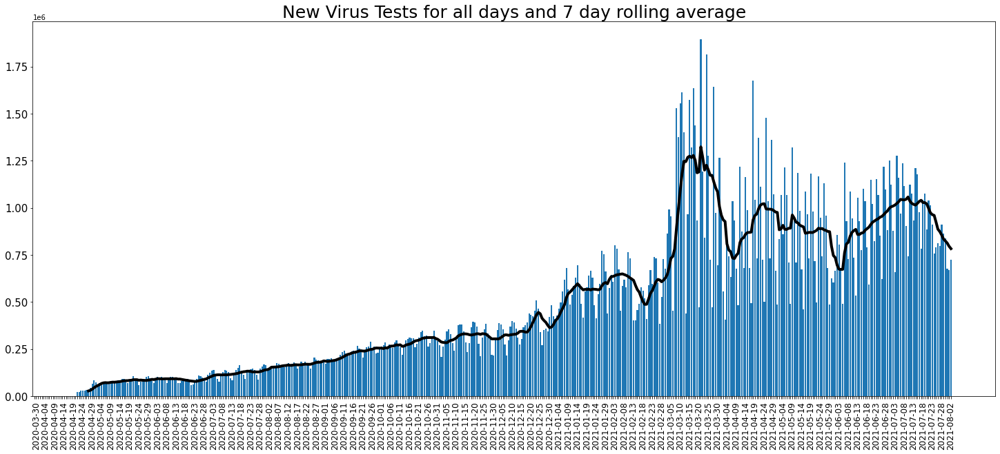

In [25]:
return1, return2, return3 = one_chart(df_summary, 'newVirusTests', 'New Virus Tests',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

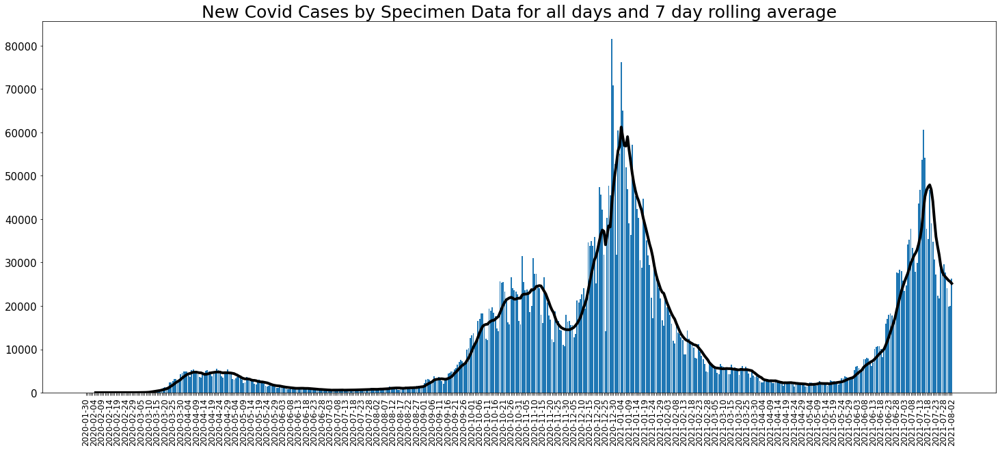

In [26]:
return1, return2, return3 = one_chart(df_summary, 'newCasesBySpecimenDate', 'New Covid Cases by Specimen Data',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

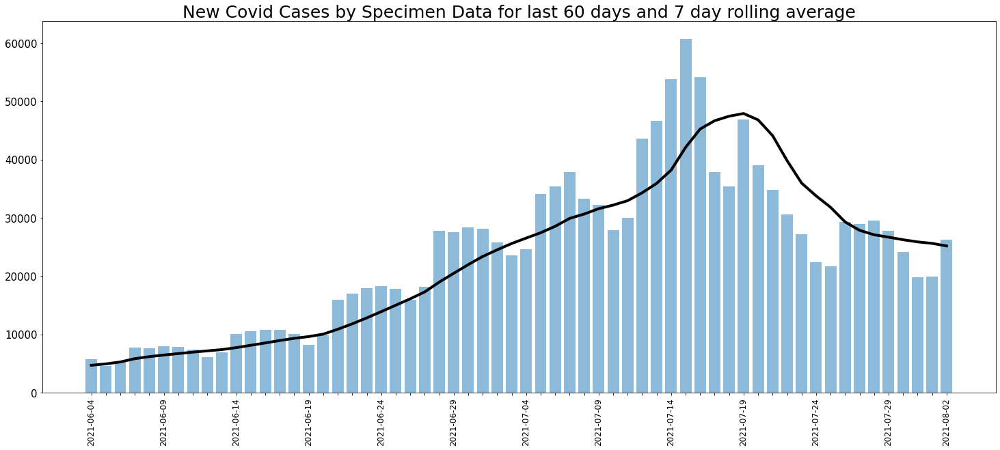

In [27]:
return1, return2, return3 = one_chart(df_summary, 'newCasesBySpecimenDate', 'New Covid Cases by Specimen Data',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

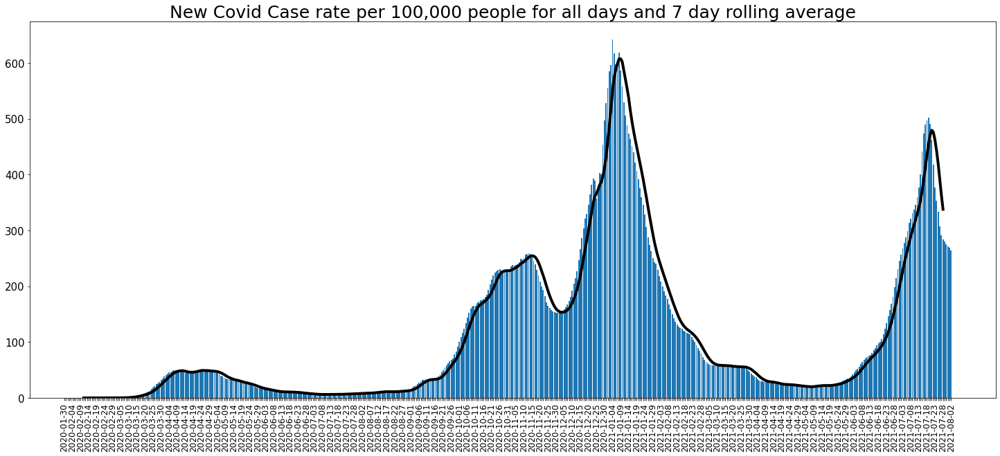

In [28]:
return1, return2, return3 = one_chart(df_summary, 'newCasesBySpecimenDate_caseRate', 
                                      'New Covid Case rate per 100,000 people',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

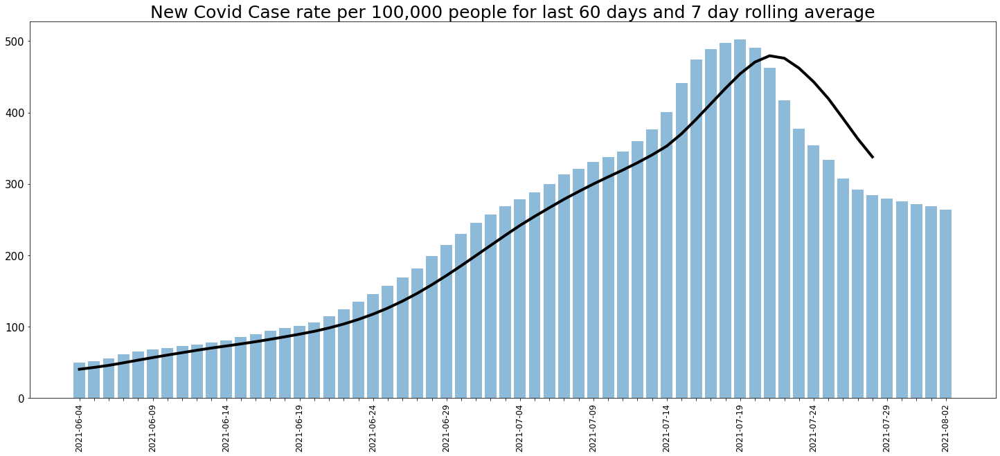

In [29]:
return1, return2, return3 = one_chart(df_summary, 'newCasesBySpecimenDate_caseRate', 
                                      'New Covid Case rate per 100,000 people',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

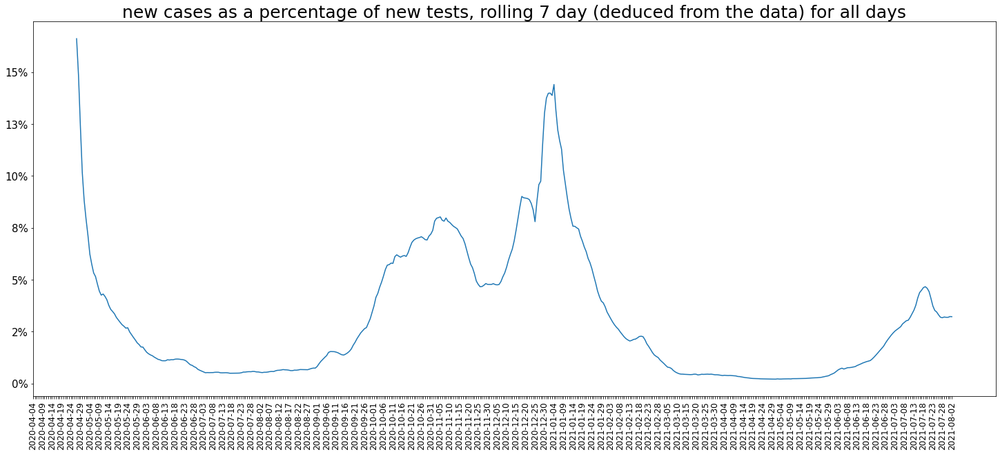

In [30]:
return1, return2, return3 = one_chart(df_summary, '%_positive_tests', 
                                      'new cases as a percentage of new tests, rolling 7 day (deduced from the data)',
                                      0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

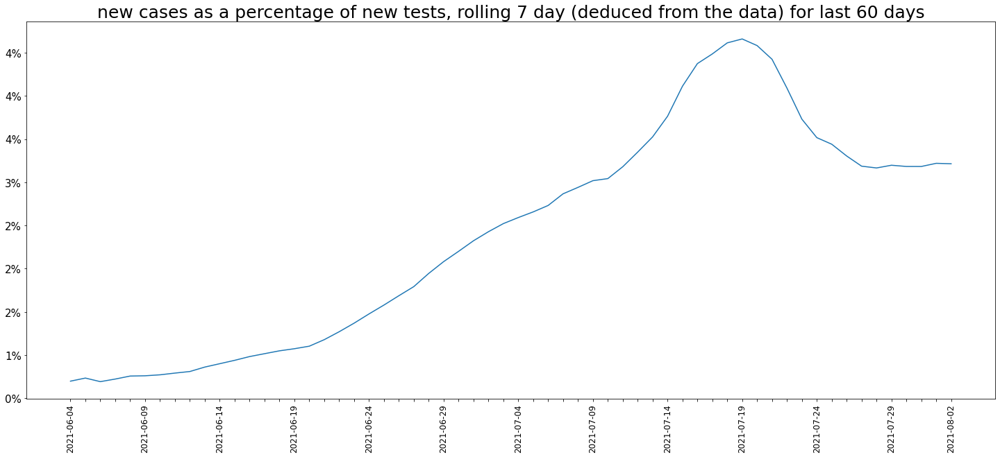

In [31]:
return1, return2, return3 = one_chart(df_summary, '%_positive_tests', 
                                      'new cases as a percentage of new tests, rolling 7 day (deduced from the data)',
                                      0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

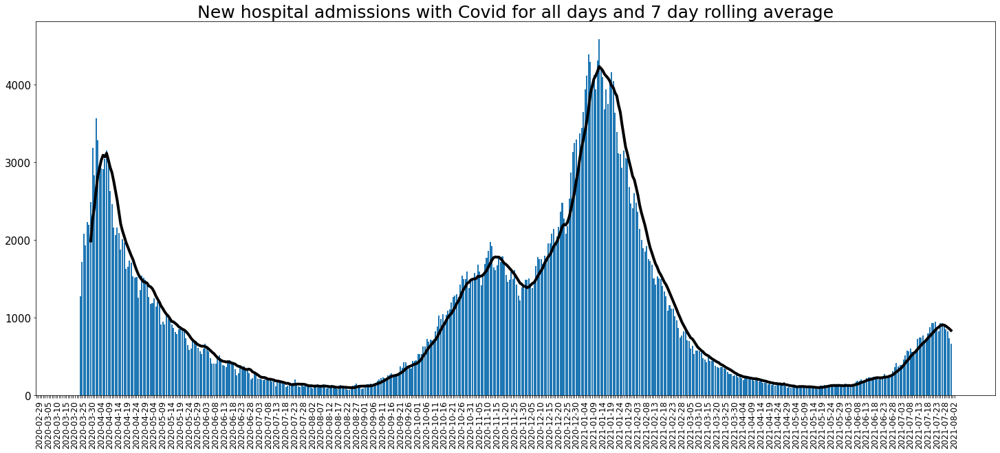

In [32]:
return1, return2, return3 = one_chart(df_summary, 'newAdmissions', 'New hospital admissions with Covid',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

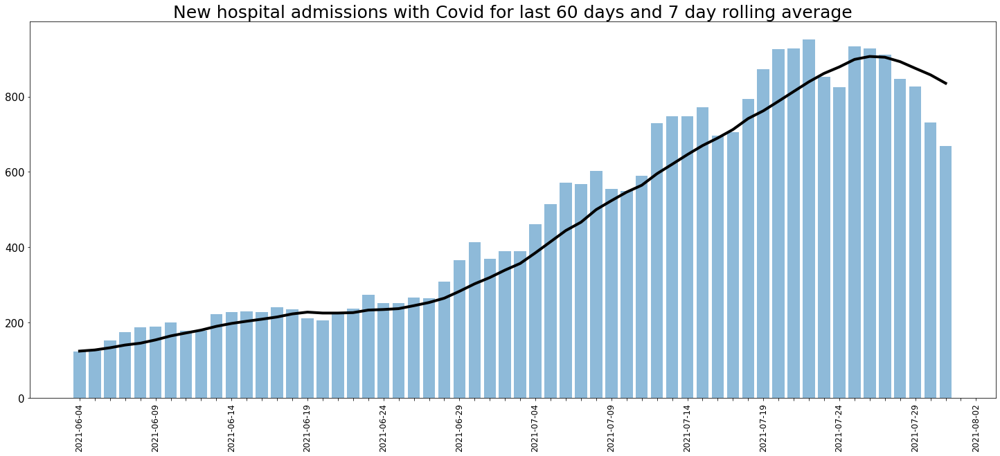

In [33]:
return1, return2, return3 = one_chart(df_summary, 'newAdmissions', 'New hospital admissions with Covid',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

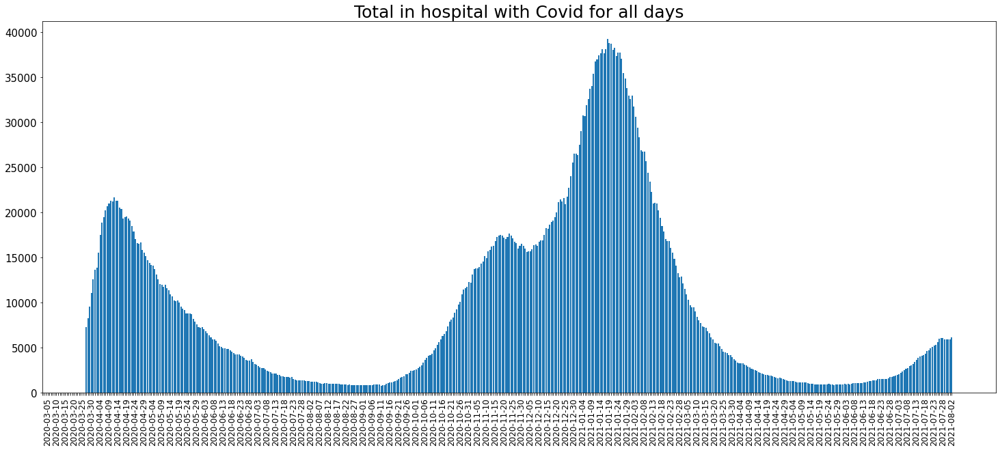

In [34]:
return1, return2, return3 = one_chart(df_summary, 'hospitalCases', 'Total in hospital with Covid',1,0,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

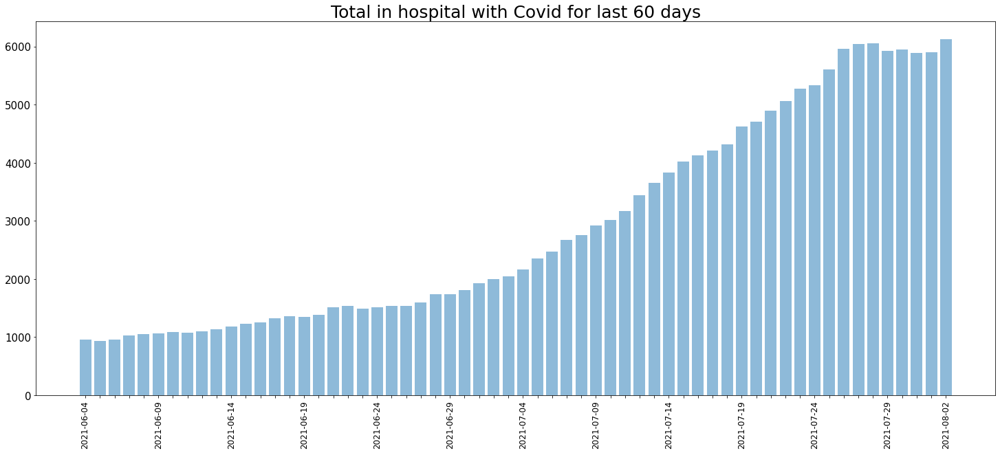

In [35]:
return1, return2, return3 = one_chart(df_summary, 'hospitalCases', 'Total in hospital with Covid',1,0,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

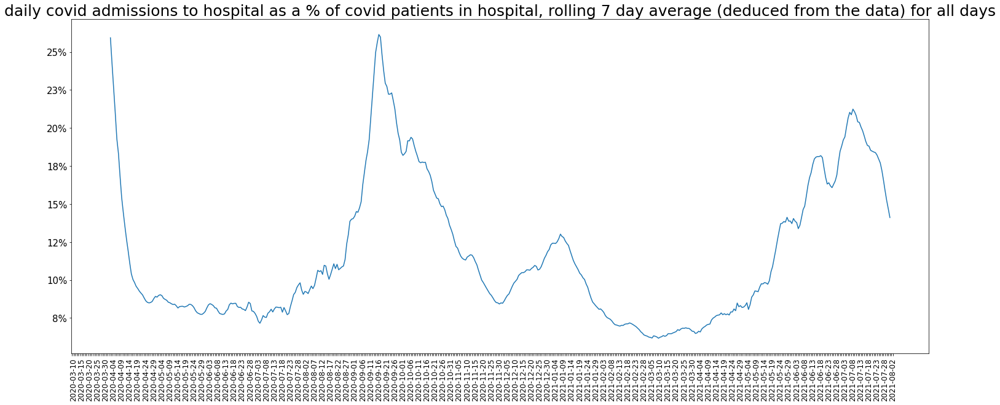

In [36]:
return1, return2, return3 = one_chart(df_summary, 'newAdmissions%_inHospital', 
                                      'daily covid admissions to hospital as a % of covid patients in hospital, rolling 7 day average (deduced from the data)',
                                      0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

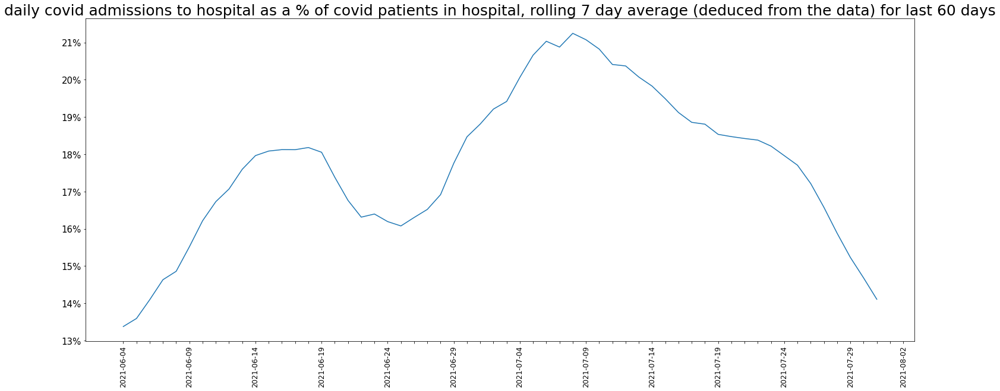

In [37]:
return1, return2, return3 = one_chart(df_summary, 'newAdmissions%_inHospital', 
                                      'daily covid admissions to hospital as a % of covid patients in hospital, rolling 7 day average (deduced from the data)',
                                      0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

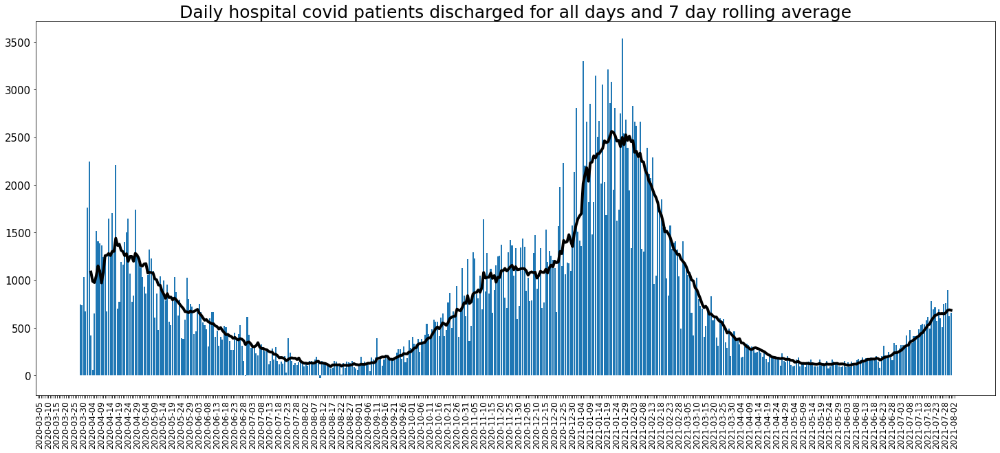

In [38]:
return1, return2, return3 = one_chart(df_summary, 'leaving_hospital', 
                                      'Daily hospital covid patients discharged',1,0,1,0)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

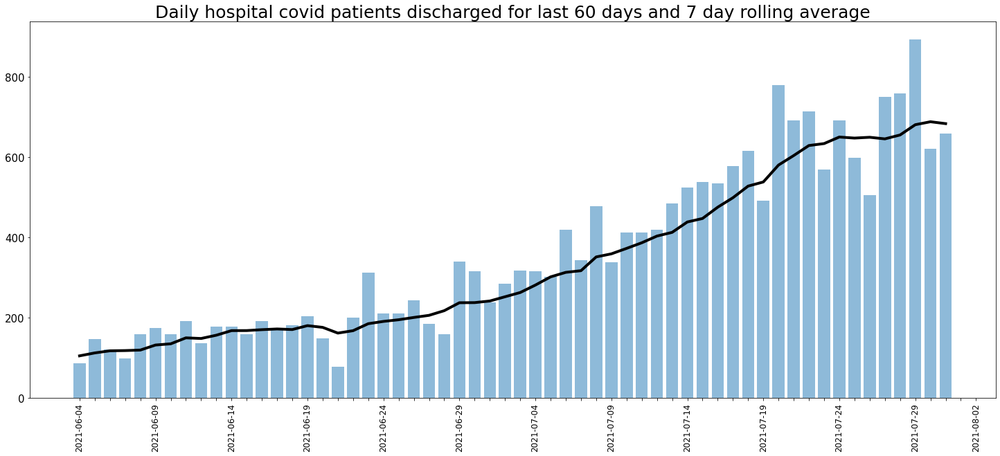

In [39]:
return1, return2, return3 = one_chart(df_summary, 'leaving_hospital', 
                                      'Daily hospital covid patients discharged',1,0,1,60)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

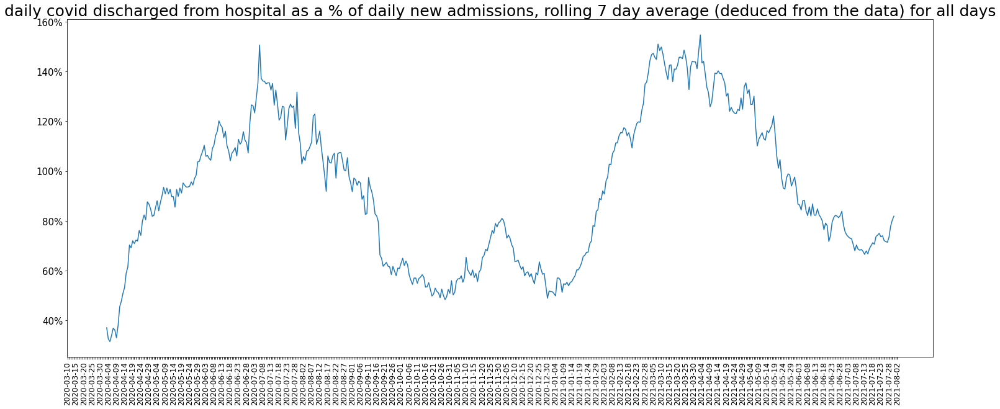

In [40]:
return1, return2, return3 = one_chart(df_summary, 'leavers_%_admissions', 
                                      'daily covid discharged from hospital as a % of daily new admissions, rolling 7 day average (deduced from the data)',
                                      0,1,0,0)
slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

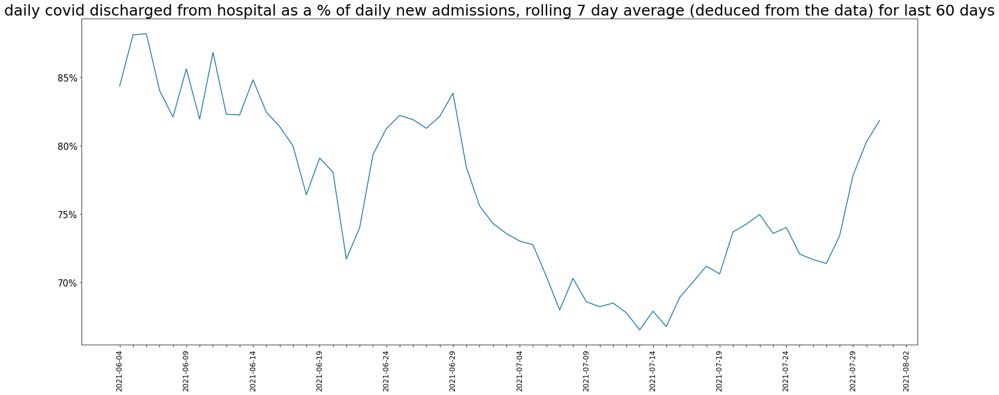

In [41]:
return1, return2, return3 = one_chart(df_summary, 'leavers_%_admissions', 
                                      'daily covid discharged from hospital as a % of daily new admissions, rolling 7 day average (deduced from the data)',
                                      0,1,0,60)
slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

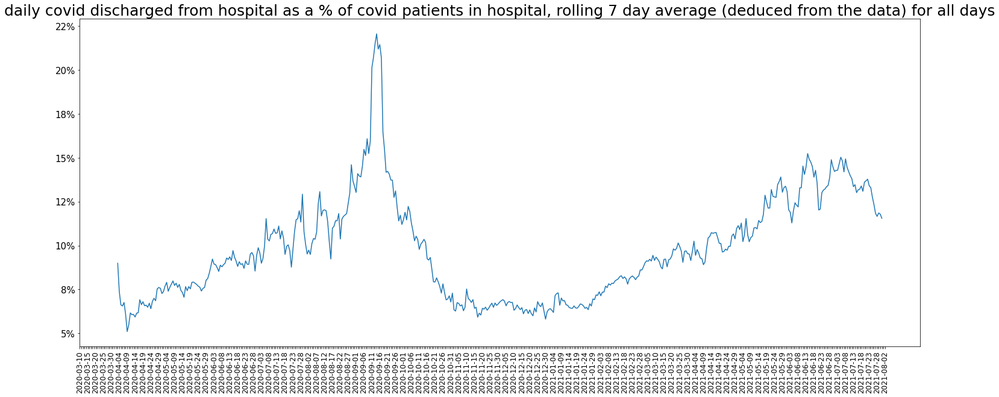

In [42]:
return1, return2, return3 = one_chart(df_summary, 'leavers_%_inHospital', 
                                      'daily covid discharged from hospital as a % of covid patients in hospital, rolling 7 day average (deduced from the data)',
                                      0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

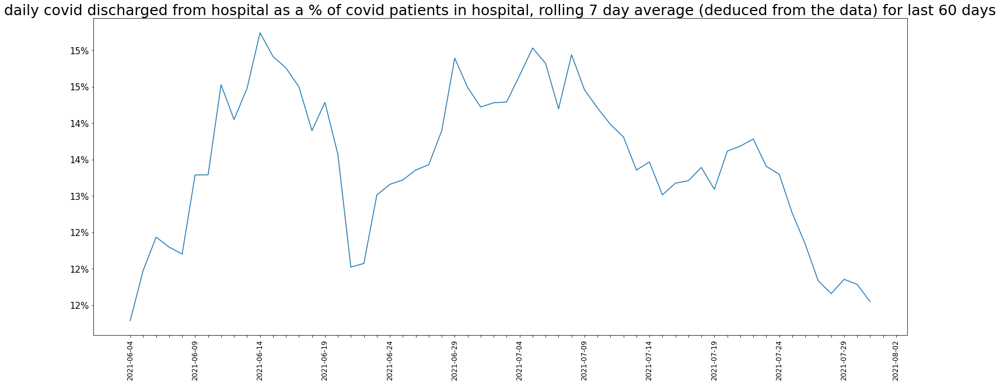

In [43]:
return1, return2, return3 = one_chart(df_summary, 'leavers_%_inHospital', 
                                      'daily covid discharged from hospital as a % of covid patients in hospital, rolling 7 day average (deduced from the data)',
                                      0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

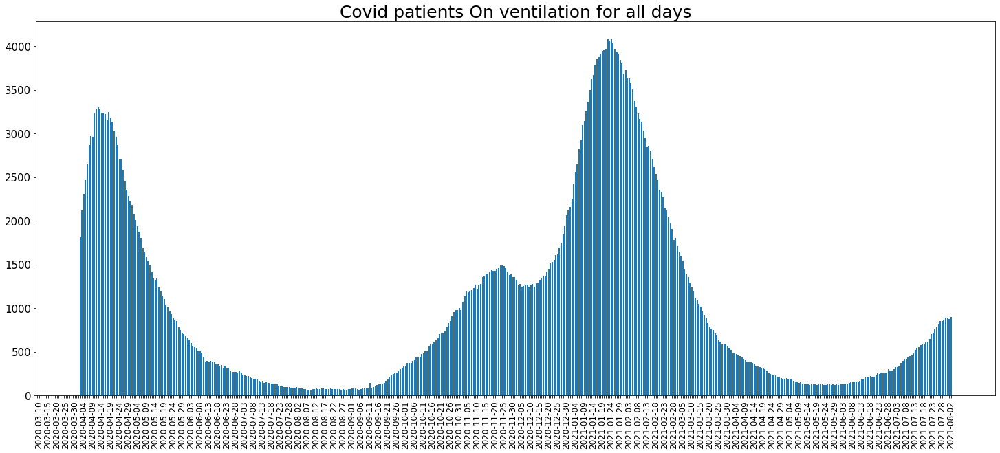

In [44]:
return1, return2, return3 = one_chart(df_summary, 'covidOccupiedMVBeds', 'Covid patients On ventilation',1,0,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

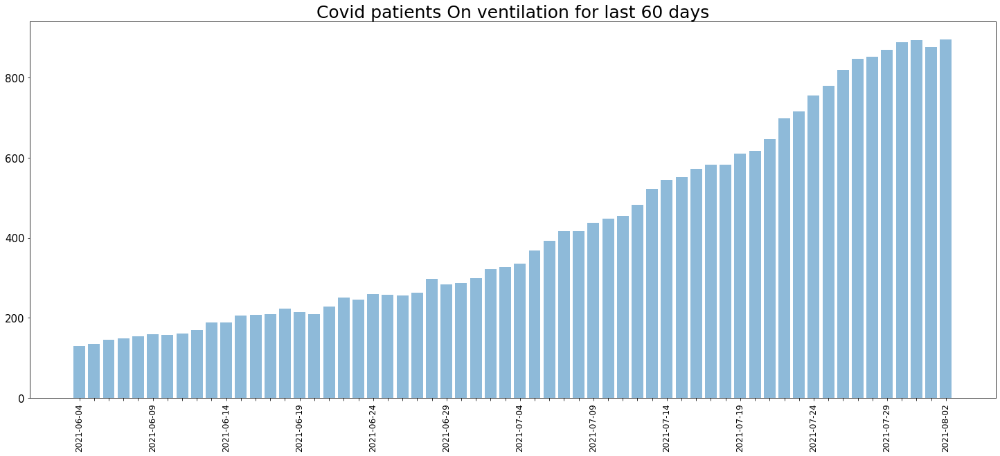

In [45]:
return1, return2, return3 = one_chart(df_summary, 'covidOccupiedMVBeds', 'Covid patients On ventilation',1,0,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

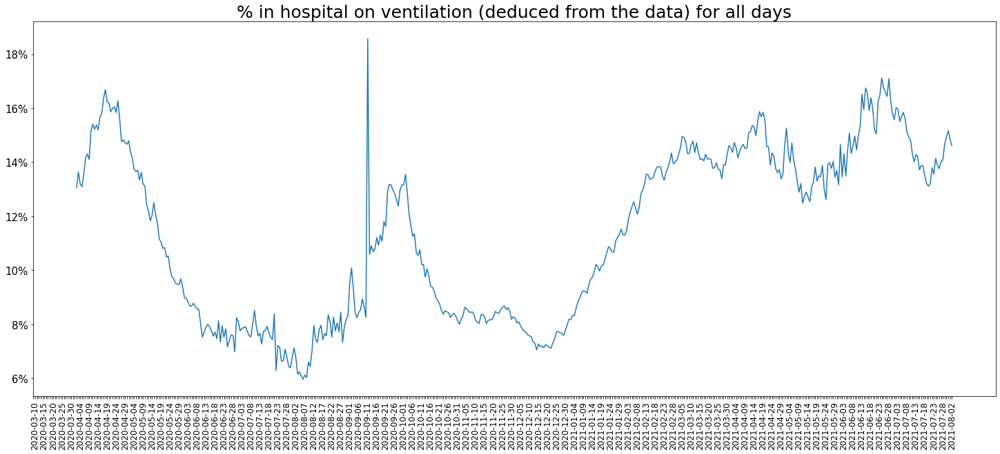

In [46]:
return1, return2, return3 = one_chart(df_summary, '%_on_ventilation', 
                                      '% in hospital on ventilation (deduced from the data)',0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

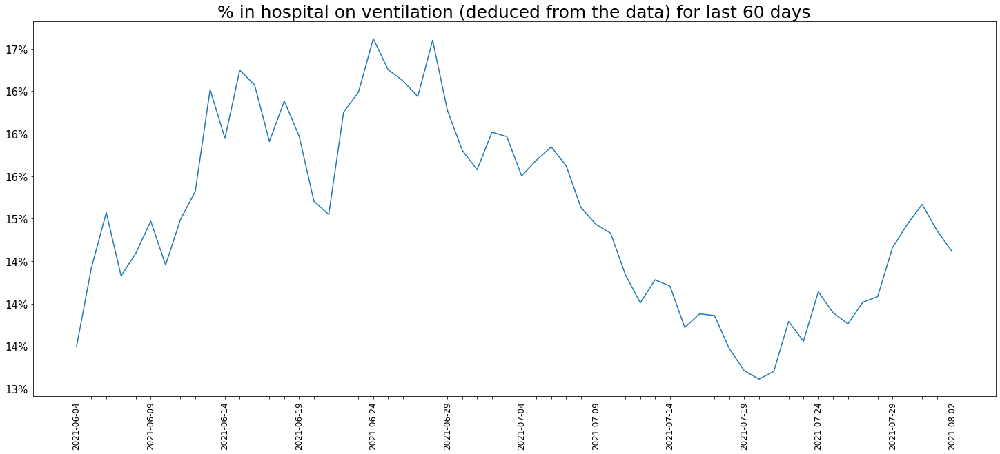

In [47]:
return1, return2, return3 = one_chart(df_summary, '%_on_ventilation',
                                      '% in hospital on ventilation (deduced from the data)',0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

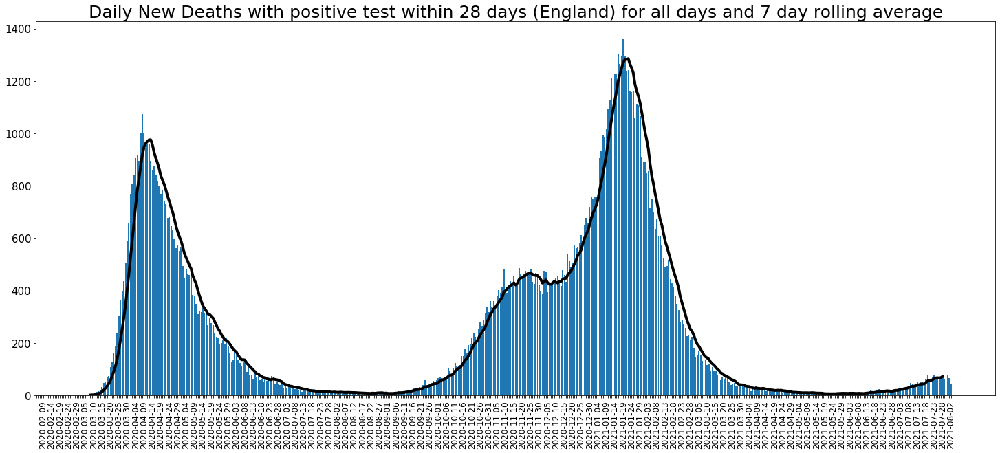

In [48]:
return1, return2, return3 = one_chart(df_summary, 'newDeaths28DaysByDeathDate', 
                                      'Daily New Deaths with positive test within 28 days (England)',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

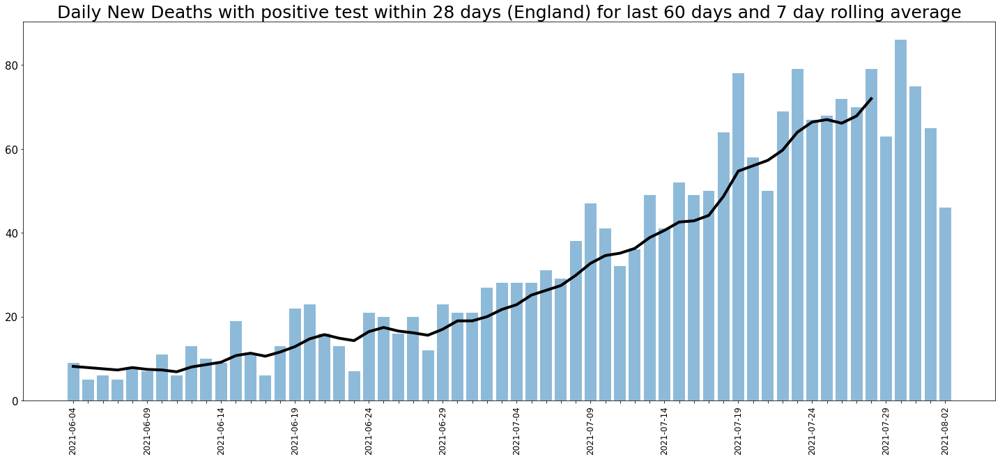

In [49]:
return1, return2, return3 = one_chart(df_summary, 'newDeaths28DaysByDeathDate', 
                                      'Daily New Deaths with positive test within 28 days (England)',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

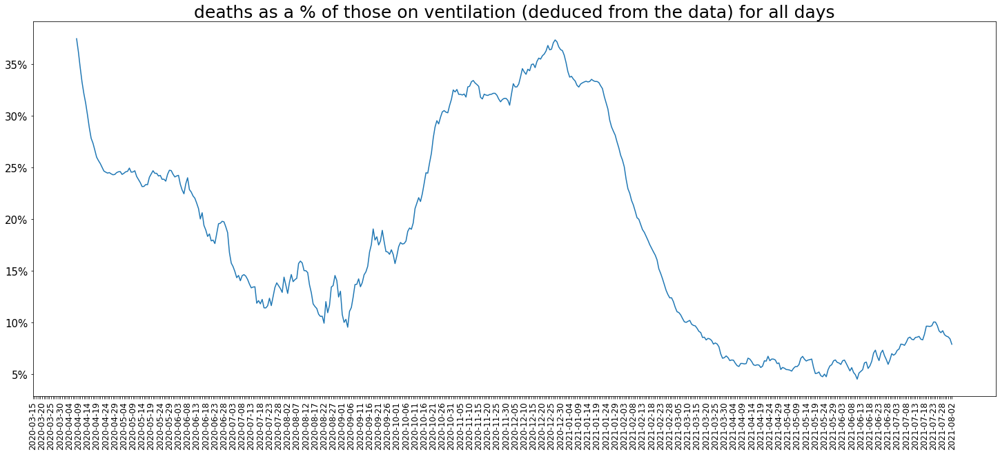

In [50]:
return1, return2, return3 = one_chart(df_summary, 'deaths_%_vent', 
                                      'deaths as a % of those on ventilation (deduced from the data)',
                                      0,1,0,0)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

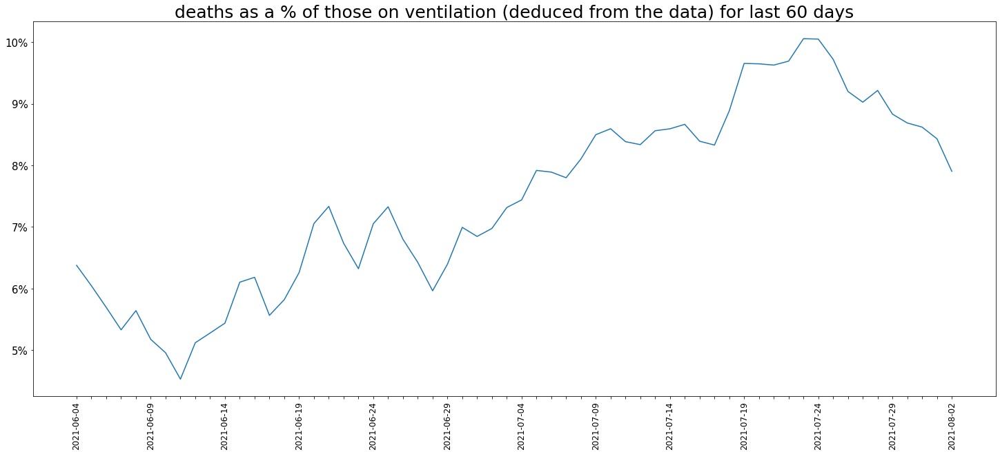

In [51]:
return1, return2, return3 = one_chart(df_summary, 
                                      'deaths_%_vent', 'deaths as a % of those on ventilation (deduced from the data)',
                                      0,1,0,60)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

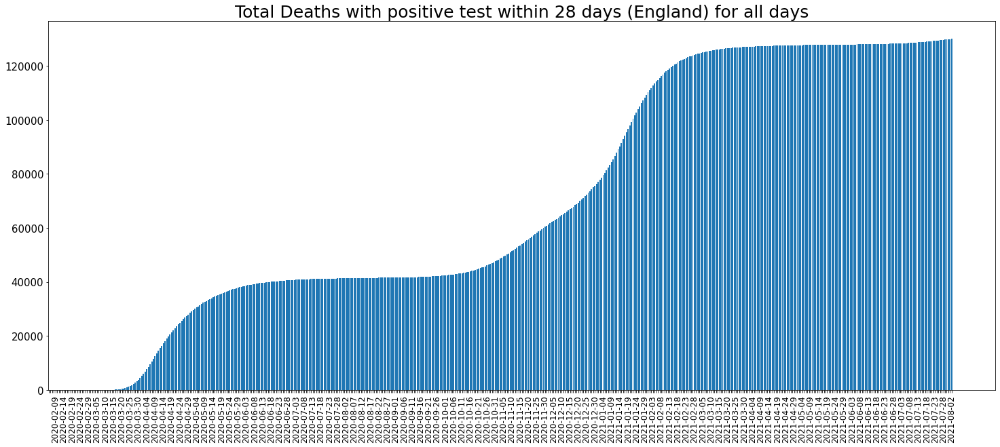

In [52]:
return1, return2, return3 = one_chart(df_summary, 'cumDeaths28DaysByDeathDate', 
                                      'Total Deaths with positive test within 28 days (England)',1,0,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [53]:
# for the presentation, insert a new chapter slide

if savePNG == 1 or PwrptPrep == 1:
    #plt.savefig('Auto Trader - bar chart of Lookers cars on site.png', bbox_inches = 'tight')
    
    slideTitle.append('SECTION 2: Data for the England by Age (most upto date age related death data i can find): Cases, Hospitalisations and Deaths')
    slideText.append('')
    imagePath.append('')

plt.show()

In [54]:
df_eng_newcasesbyage = df_eng_c
df_eng_cumdeathsbyage = df_eng_d

In [55]:
df_eng_newcasesbyage.tail()

,areaCode,areaName,areaType,date,age,cases,rollingSum,rollingRate
12051,E92000001,England,nation,2021-07-30,85_89,84,565,64.2
12052,E92000001,England,nation,2021-07-30,90+,75,380,73.5
12053,E92000001,England,nation,2021-07-30,unassigned,8,83,NaN
12054,E92000001,England,nation,2021-07-30,50_54,1011,7493,191.8
12055,E92000001,England,nation,2021-07-30,00_04,409,3251,98.5


In [56]:
df_eng_cumdeathsbyage.tail()

,areaCode,areaName,areaType,date,age,deaths,rollingSum,rollingRate
10831,E92000001,England,nation,2021-07-30,80_84,13,60,4.2
10832,E92000001,England,nation,2021-07-30,85_89,9,65,7.4
10833,E92000001,England,nation,2021-07-30,90+,9,58,11.2
10834,E92000001,England,nation,2021-07-30,45_49,2,15,0.4
10835,E92000001,England,nation,2021-07-30,00_04,0,0,0.0


In [57]:
# clean the dateframes

# delete duplicate rows
df_eng_newcasesbyage.drop_duplicates(inplace=True)
df_eng_newcasesbyage.reset_index(drop=True)

df_eng_cumdeathsbyage.drop_duplicates(inplace=True)
df_eng_cumdeathsbyage.reset_index(drop=True)

df_eng_cumadmissionsbyage.drop_duplicates(inplace=True)
df_eng_cumadmissionsbyage.reset_index(drop=True)

,areaCode,areaName,areaType,date,age,rate,value
0,E92000001,England,nation,2020-03-19,6_to_17,0.1,5
1,E92000001,England,nation,2020-03-19,18_to_64,0.5,171
2,E92000001,England,nation,2020-03-19,65_to_84,2.4,209
3,E92000001,England,nation,2020-03-19,85+,7.1,97
4,E92000001,England,nation,2020-03-19,0_to_5,0.1,4
...,...,...,...,...,...,...,...
2505,E92000001,England,nation,2021-08-02,6_to_17,46.2,3650
2506,E92000001,England,nation,2021-08-02,65_to_84,1927.4,169884
2507,E92000001,England,nation,2021-08-02,85+,6265.6,85524
2508,E92000001,England,nation,2021-08-02,0_to_5,91.7,3713


In [58]:
# delete unwanted columns

df_eng_newcasesbyage = df_eng_newcasesbyage[['date', 'age', 'cases']]
df_eng_cumdeathsbyage = df_eng_cumdeathsbyage[['date', 'age', 'rollingSum']]
df_eng_cumadmissionsbyage = df_eng_cumadmissionsbyage[['date', 'age', 'value']]

In [59]:
df_eng_newcasesbyage.tail()

,date,age,cases
12051,2021-07-30,85_89,84
12052,2021-07-30,90+,75
12053,2021-07-30,unassigned,8
12054,2021-07-30,50_54,1011
12055,2021-07-30,00_04,409


In [60]:
df_eng_cumdeathsbyage.tail()

,date,age,rollingSum
10831,2021-07-30,80_84,60
10832,2021-07-30,85_89,65
10833,2021-07-30,90+,58
10834,2021-07-30,45_49,15
10835,2021-07-30,00_04,0


In [61]:
df_eng_cumadmissionsbyage.tail()

,date,age,value
2505,2021-08-02,6_to_17,3650
2506,2021-08-02,65_to_84,169884
2507,2021-08-02,85+,85524
2508,2021-08-02,0_to_5,3713
2509,2021-08-02,18_to_64,158274


In [62]:
# function to create new dataframs with the age bands at the headers

def dataframe_ageHeaders(df1, header1):
    
    dates = df1['date'].tolist()
    dates = list(set(dates))

    df1_Summary = pd.DataFrame(dates, columns = ['date'])
    df1_Summary.sort_values('date', inplace = True)
    df1_Summary.reset_index(drop=True, inplace=True)
    
    headers = df1['age'].unique().tolist()
    
    for i in range(len(headers)):
        listOfValues = df1[df1['age'] == headers[i]][header1].tolist()
        df1_Summary[headers[i]] = listOfValues
    
    return df1_Summary
  

In [63]:
df_eng_newcasesbyage_Summary = dataframe_ageHeaders(df_eng_newcasesbyage,'cases')

In [64]:
df_eng_newcasesbyage_Summary.tail()

,date,unassigned,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,40_44,90+,50_54,85_89,80_84,75_79,70_74,45_49,60_64,60+,55_59,65_69
543,2021-07-26,22,587,23685,1133,2250,3332,3702,2857,2494,2005,1659,74,1235,108,160,254,334,1409,681,2076,1022,465
544,2021-07-27,21,507,23469,895,1947,3513,4267,3125,2464,1948,1507,48,1162,94,133,186,310,1261,591,1795,873,433
545,2021-07-28,15,473,24481,806,1738,3801,4794,3444,2797,1957,1574,51,1059,81,132,202,267,1208,598,1672,830,341
546,2021-07-29,6,405,23003,795,1525,3570,4481,3284,2444,1800,1543,50,1075,71,103,180,291,1227,537,1569,854,337
547,2021-07-30,8,409,19793,712,1387,3062,3571,2631,2150,1554,1346,75,1011,84,125,172,285,1160,531,1619,800,347


In [65]:
df_eng_cumdeathsbyage_Summary = dataframe_ageHeaders(df_eng_cumdeathsbyage,'rollingSum')

In [66]:
df_eng_cumdeathsbyage_Summary.tail()

,date,90+,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,85_89,45_49,80_84,75_79,70_74,65_69,40_44,60+,55_59,50_54,60_64
511,2021-07-26,57,0,76,0,0,1,2,4,3,4,66,13,58,39,36,48,10,323,21,18,19
512,2021-07-27,57,0,74,0,0,1,2,3,3,5,62,15,57,51,43,49,3,334,21,21,15
513,2021-07-28,57,0,80,0,0,1,3,2,3,6,71,17,56,54,44,53,5,353,22,21,18
514,2021-07-29,57,0,81,0,0,0,3,1,4,6,70,16,57,52,45,49,5,345,23,23,15
515,2021-07-30,58,0,82,0,0,0,3,1,4,8,65,15,60,49,51,53,7,354,21,23,18


In [67]:
# convert the rolling deaths into daily deaths

def rolling_to_new(column_name):

    newdeaths = [0]*6   
    for i in range(6,len(df_eng_cumdeathsbyage_Summary)):
        newdaydeaths = df_eng_cumdeathsbyage_Summary[column_name].iloc[i] - df_eng_cumdeathsbyage_Summary[column_name].iloc[i-1] + newdeaths[i-7]
        newdeaths.append(newdaydeaths)

    df_eng_cumdeathsbyage_Summary[column_name + '_new'] = newdeaths

In [68]:
col_names = df_eng_cumdeathsbyage_Summary.columns[1:].tolist()

for i in range(len(col_names)):
    rolling_to_new(col_names[i])

In [69]:
df_eng_cumdeathsbyage_Summary.tail()

,date,90+,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,85_89,45_49,80_84,75_79,70_74,65_69,40_44,60+,55_59,50_54,60_64,90+_new,00_04_new,00_59_new,05_09_new,10_14_new,15_19_new,20_24_new,25_29_new,30_34_new,35_39_new,85_89_new,45_49_new,80_84_new,75_79_new,70_74_new,65_69_new,40_44_new,60+_new,55_59_new,50_54_new,60_64_new
511,2021-07-26,57,0,76,0,0,1,2,4,3,4,66,13,58,39,36,48,10,323,21,18,19,11,0,8,0,0,0,0,0,0,1,10,3,9,8,5,10,1,54,2,1,1
512,2021-07-27,57,0,74,0,0,1,2,3,3,5,62,15,57,51,43,49,3,334,21,21,15,7,0,11,0,0,0,0,0,0,1,5,3,7,12,9,4,1,45,1,5,1
513,2021-07-28,57,0,80,0,0,1,3,2,3,6,71,17,56,54,44,53,5,353,22,21,18,7,0,10,0,0,0,1,0,0,1,14,3,8,10,6,7,2,55,2,1,3
514,2021-07-29,57,0,81,0,0,0,3,1,4,6,70,16,57,52,45,49,5,345,23,23,15,8,0,12,0,0,0,1,0,1,1,8,1,8,2,5,4,0,36,5,3,1
515,2021-07-30,58,0,82,0,0,0,3,1,4,8,65,15,60,49,51,53,7,354,21,23,18,9,0,13,0,0,0,0,0,1,2,9,2,13,5,13,10,3,65,2,3,6


In [70]:
df_eng_cumadmissionsbyage_Summary = dataframe_ageHeaders(df_eng_cumadmissionsbyage,'value')

In [71]:
df_eng_cumadmissionsbyage_Summary.tail()

,date,6_to_17,18_to_64,65_to_84,85+,0_to_5
497,2021-07-29,3581,156754,169206,85302,3632
498,2021-07-30,3597,157157,169371,85350,3649
499,2021-07-31,3613,157498,169526,85411,3669
500,2021-08-01,3635,157865,169695,85468,3696
501,2021-08-02,3650,158274,169884,85524,3713


In [72]:
# convert the cum admissions into daily admissions

def cum_to_new(column_name):

    newadmissions = []
    newadmissions.append(df_eng_cumadmissionsbyage_Summary[column_name][0])
    for i in range(1,len(df_eng_cumadmissionsbyage_Summary)):
        newdayadmissions = df_eng_cumadmissionsbyage_Summary[column_name].iloc[i] - df_eng_cumadmissionsbyage_Summary[column_name].iloc[i-1]
        newadmissions.append(newdayadmissions)

    df_eng_cumadmissionsbyage_Summary[column_name + '_new'] = newadmissions

In [73]:
col_names = df_eng_cumadmissionsbyage_Summary.columns[1:].tolist()

for i in range(len(col_names)):
    cum_to_new(col_names[i])

In [74]:
df_eng_cumadmissionsbyage_Summary.head()

,date,6_to_17,18_to_64,65_to_84,85+,0_to_5,6_to_17_new,18_to_64_new,65_to_84_new,85+_new,0_to_5_new
0,2020-03-19,5,171,209,97,4,5,171,209,97,4
1,2020-03-20,13,384,445,213,4,8,213,236,116,0
2,2020-03-21,16,618,695,340,5,3,234,250,127,1
3,2020-03-22,17,856,1024,469,10,1,238,329,129,5
4,2020-03-23,23,1200,1471,650,16,6,344,447,181,6


In [75]:
# create new columns in the other two dataframes to match the admissions ages

In [76]:
def create_new_columns(df, newcol,name):

    df[name] = 0

    for i in range(len(newcol)):
        df[name] = df[name] + df[newcol[i]]


In [77]:
nursery = ['00_04']
school = ['15_19','10_14','05_09']
working = ['60_64', '55_59', '50_54','45_49','40_44','35_39','30_34','25_29','20_24']
old = ['80_84','75_79','70_74','65_69']
older = ['90+','85_89']

In [78]:
create_new_columns(df_eng_newcasesbyage_Summary,nursery,'00_04_')
create_new_columns(df_eng_newcasesbyage_Summary,school,'05_19_')
create_new_columns(df_eng_newcasesbyage_Summary,working,'20_64_')
create_new_columns(df_eng_newcasesbyage_Summary,old,'65_84_')
create_new_columns(df_eng_newcasesbyage_Summary,older,'85+_')

In [79]:
nursery = ['00_04_new']
school = ['15_19_new','10_14_new','05_09_new']
working = ['60_64_new', '55_59_new', '50_54_new','45_49_new','40_44_new','35_39_new','30_34_new','25_29_new','20_24_new']
old = ['80_84_new','75_79_new','70_74_new','65_69_new']
older = ['90+_new','85_89_new']

In [80]:
create_new_columns(df_eng_cumdeathsbyage_Summary,nursery,'00_04_')
create_new_columns(df_eng_cumdeathsbyage_Summary,school,'05_19_')
create_new_columns(df_eng_cumdeathsbyage_Summary,working,'20_64_')
create_new_columns(df_eng_cumdeathsbyage_Summary,old,'65_84_')
create_new_columns(df_eng_cumdeathsbyage_Summary,older,'85+_')

In [81]:
# add rolling mean 7 day columns

columns1 = ['00_04_','05_19_','20_64_','65_84_','85+_']
columns2 = ['0_to_5_new','6_to_17_new','18_to_64_new',
            '65_to_84_new','85+_new']

for i in range(len(columns1)):
    df_eng_newcasesbyage_Summary[columns1[i] + 'rolling7'] = df_eng_newcasesbyage_Summary[columns1[i]].rolling(7).mean()
    df_eng_cumdeathsbyage_Summary[columns1[i] + 'rolling7'] = df_eng_cumdeathsbyage_Summary[columns1[i]].rolling(7).mean()

for i in range(len(columns2)):
    df_eng_cumadmissionsbyage_Summary[columns2[i] + 'rolling7'] = df_eng_cumadmissionsbyage_Summary[columns2[i]].rolling(7).mean()


In [82]:
# add cumulative columns

columns1 = ['00_04_','05_19_','20_64_','65_84_','85+_']
columns2 = ['0_to_5_new','6_to_17_new','18_to_64_new',
            '65_to_84_new','85+_new']

for i in range(len(columns1)):
    df_eng_newcasesbyage_Summary[columns1[i] + 'cumsum'] = df_eng_newcasesbyage_Summary[columns1[i]].cumsum()
    df_eng_cumdeathsbyage_Summary[columns1[i] + 'cumsum'] = df_eng_cumdeathsbyage_Summary[columns1[i]].cumsum()

for i in range(len(columns2)):
    df_eng_cumadmissionsbyage_Summary[columns2[i] + 'cumsum'] = df_eng_cumadmissionsbyage_Summary[columns2[i]].cumsum()


In [83]:
df_eng_newcasesbyage_Summary.head()

,date,unassigned,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,40_44,90+,50_54,85_89,80_84,75_79,70_74,45_49,60_64,60+,55_59,65_69,00_04_,05_19_,20_64_,65_84_,85+_,00_04_rolling7,05_19_rolling7,20_64_rolling7,65_84_rolling7,85+_rolling7,00_04_cumsum,05_19_cumsum,20_64_cumsum,65_84_cumsum,85+_cumsum
0,2020-01-30,0,0,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,0,0,NaN,NaN,NaN,NaN,NaN,0,0,2,0,0
1,2020-01-31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,2,0,0
2,2020-02-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,2,0,0
3,2020-02-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,2,0,0
4,2020-02-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,2,0,0


In [84]:
df_eng_cumadmissionsbyage_Summary.head()

,date,6_to_17,18_to_64,65_to_84,85+,0_to_5,6_to_17_new,18_to_64_new,65_to_84_new,85+_new,0_to_5_new,0_to_5_newrolling7,6_to_17_newrolling7,18_to_64_newrolling7,65_to_84_newrolling7,85+_newrolling7,0_to_5_newcumsum,6_to_17_newcumsum,18_to_64_newcumsum,65_to_84_newcumsum,85+_newcumsum
0,2020-03-19,5,171,209,97,4,5,171,209,97,4,NaN,NaN,NaN,NaN,NaN,4,5,171,209,97
1,2020-03-20,13,384,445,213,4,8,213,236,116,0,NaN,NaN,NaN,NaN,NaN,4,13,384,445,213
2,2020-03-21,16,618,695,340,5,3,234,250,127,1,NaN,NaN,NaN,NaN,NaN,5,16,618,695,340
3,2020-03-22,17,856,1024,469,10,1,238,329,129,5,NaN,NaN,NaN,NaN,NaN,10,17,856,1024,469
4,2020-03-23,23,1200,1471,650,16,6,344,447,181,6,NaN,NaN,NaN,NaN,NaN,16,23,1200,1471,650


In [85]:
df_eng_cumdeathsbyage_Summary.head()

,date,90+,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,85_89,45_49,80_84,75_79,70_74,65_69,40_44,60+,55_59,50_54,60_64,90+_new,00_04_new,00_59_new,05_09_new,10_14_new,15_19_new,20_24_new,25_29_new,30_34_new,35_39_new,85_89_new,45_49_new,80_84_new,75_79_new,70_74_new,65_69_new,40_44_new,60+_new,55_59_new,50_54_new,60_64_new,00_04_,05_19_,20_64_,65_84_,85+_,00_04_rolling7,05_19_rolling7,20_64_rolling7,65_84_rolling7,85+_rolling7,00_04_cumsum,05_19_cumsum,20_64_cumsum,65_84_cumsum,85+_cumsum
0,2020-03-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
1,2020-03-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
2,2020-03-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
3,2020-03-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
4,2020-03-06,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0


In [86]:
def multiple_line_charts(df, columns, legend_labels, chart_title, days):

    # days = number of days to plot from the end, 0 = all days

    fig, ax = plt.subplots(figsize=(25,10))

    plt.subplots_adjust(hspace=0.6, wspace=0.2)

    x = df.index.values[-days:]

    labels = list(df['date'][-days:])
    
    start_date = df['date'].iloc[0]
    end_date = df['date'].iloc[-1]

    # if days = 0 then print entire chart
    days_print = 'for last ' + str(days) + ' days'
    slideText1 = str(days_print) + ' to ' + str(end_date)
    
    if days == 0:
        days = len(list(df_summary['date']))
        days_print = 'for all days'
        slideText1 = (str(start_date) + ' to ' + str(end_date))
    
    chart_title = chart_title + ' ' + days_print    

    # prevent x-axis labels from overlapping by printing every nth label
    for i in range(5,len(labels),5): # label prints at every nth label
        for ii in range(1,5): # the rest is blanks
            labels[i-ii] =''   
            
    # for the final label, ensure there is space to avoid a clash
    labels[len(labels)-1]=list(df['date'])[-1]
    labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''            
        
    ax.set_title(chart_title, fontsize=25)
    ax.set_xticklabels(labels, rotation=90, fontsize=12)
    ax.set_xticks(x)
    
    if '%' in chart_title:
        ax.yaxis.set_major_formatter(ticker.PercentFormatter(1.0, decimals=0))
    
    ax.yaxis.set_tick_params(labelsize=15)
    
    for i in range(len(columns)):
        y1 = df[columns[i]][-days:]
        ax.plot(x, y1, label = legend_labels[i])
    
    ax.legend(fontsize=20)
    
    fileName = 'Coviduk - multiple_line_charts ' + str(days_print) + str(chart_title) + '.png'  
    
    
    # need to remove any dates filename when saved as .png given they change
    # but keep the days printed in the filename to differentiate files
    plt.savefig(fileName.split('202')[0] + '.png', bbox_inches = 'tight')
    
    slideTitle_ = chart_title
    slideText_ = slideText1
    imagePath_ = (fileName.split('202')[0] + '.png')  
    
    plt.show()
    
    return slideTitle_, slideText_, imagePath_    


In [87]:
columns = ['00_04_rolling7','05_19_rolling7','20_64_rolling7',
           '65_84_rolling7','85+_rolling7']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
# first_date = df_eng_newcasesbyage_Summary['date'].iloc[0]
last_date = df_eng_newcasesbyage_Summary['date'].iloc[-1]

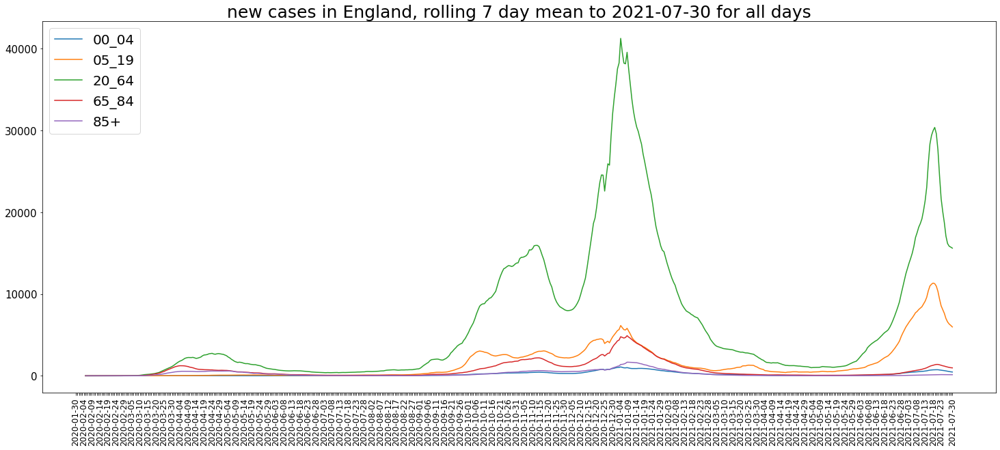

In [88]:
return1, return2, return3 = multiple_line_charts(df_eng_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in England, rolling 7 day mean to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

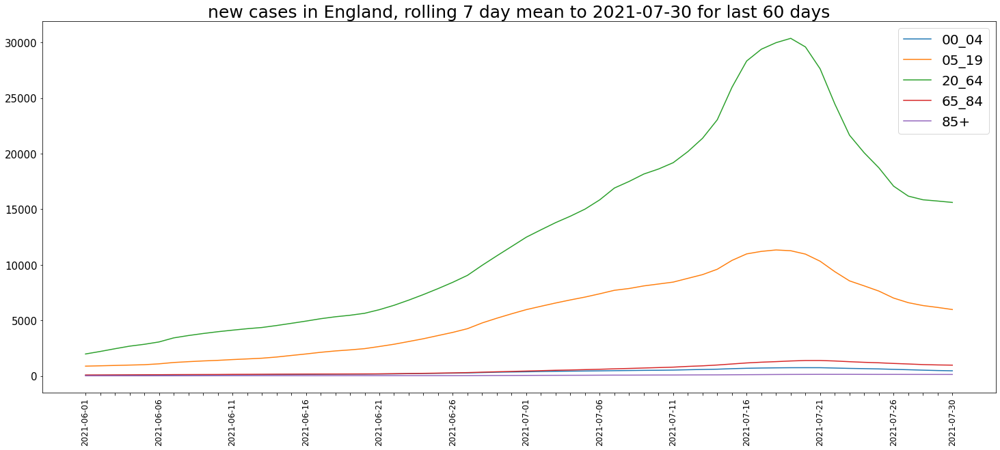

In [89]:
return1, return2, return3 = multiple_line_charts(df_eng_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in England, rolling 7 day mean to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [90]:
columns = ['00_04_rolling7','05_19_rolling7',
           '65_84_rolling7','85+_rolling7']
chart_titles = ['00_04','05_19','65_84','85+']
#first_date = df_eng_newcasesbyage_Summary['date'].iloc[0]
last_date = df_eng_newcasesbyage_Summary['date'].iloc[-1]

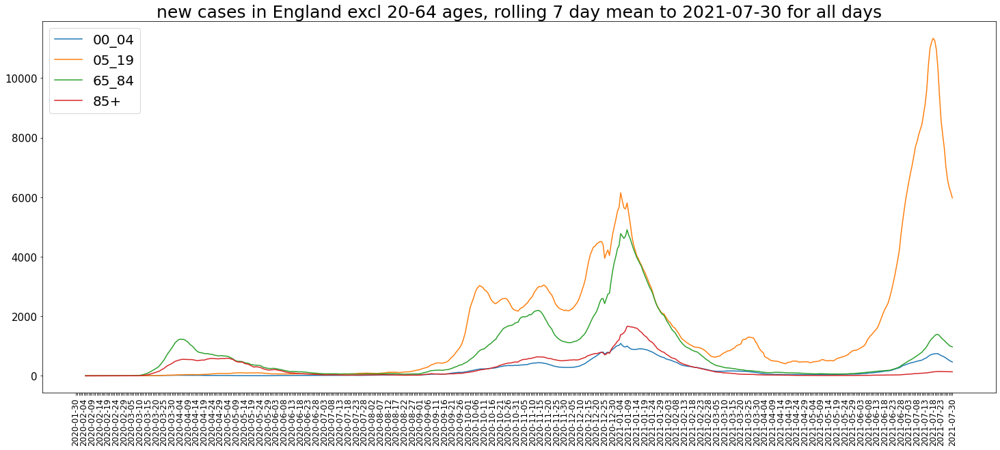

In [91]:
return1, return2, return3 = multiple_line_charts(df_eng_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in England excl 20-64 ages, rolling 7 day mean to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

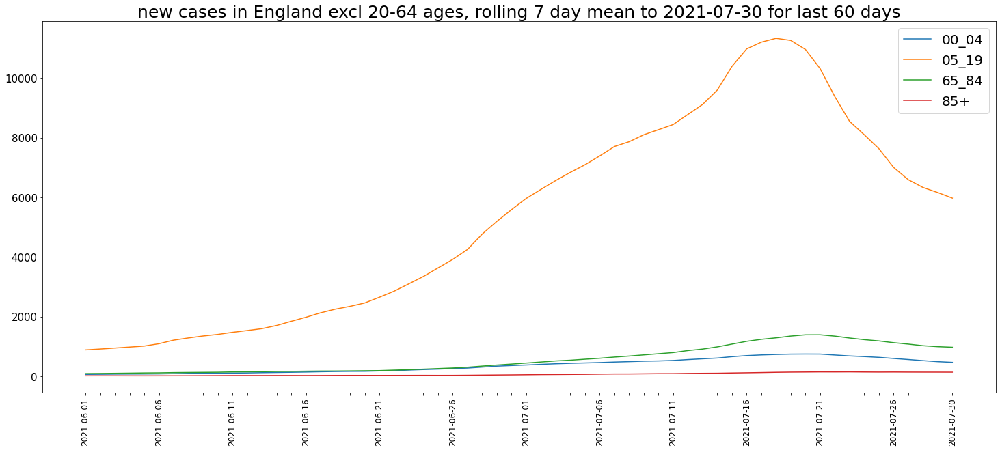

In [92]:
return1, return2, return3 = multiple_line_charts(df_eng_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in England excl 20-64 ages, rolling 7 day mean to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [93]:
columns = ['0_to_5_newrolling7','6_to_17_newrolling7','18_to_64_newrolling7',
            '65_to_84_newrolling7','85+_newrolling7']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
#first_date = df_eng_cumadmissionsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumadmissionsbyage_Summary['date'].iloc[-1]

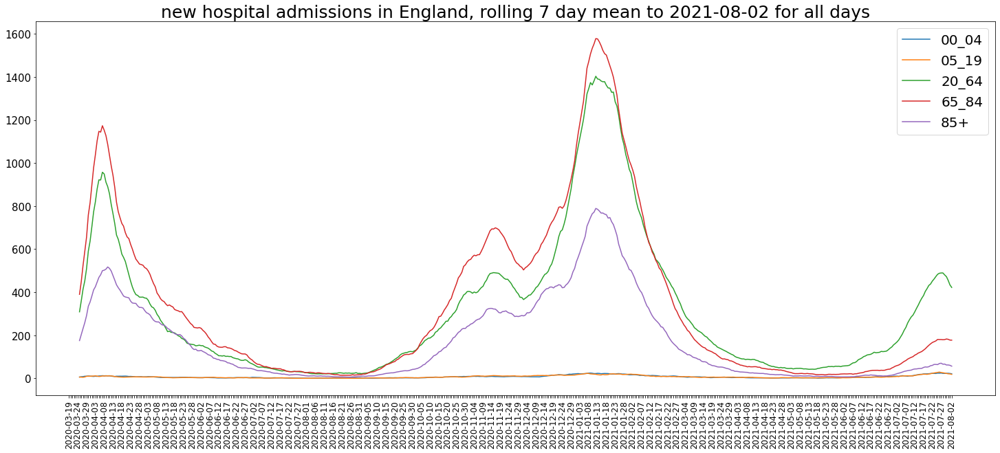

In [94]:
return1, return2, return3 = multiple_line_charts(df_eng_cumadmissionsbyage_Summary, columns, chart_titles, 
                                                 'new hospital admissions in England, rolling 7 day mean to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

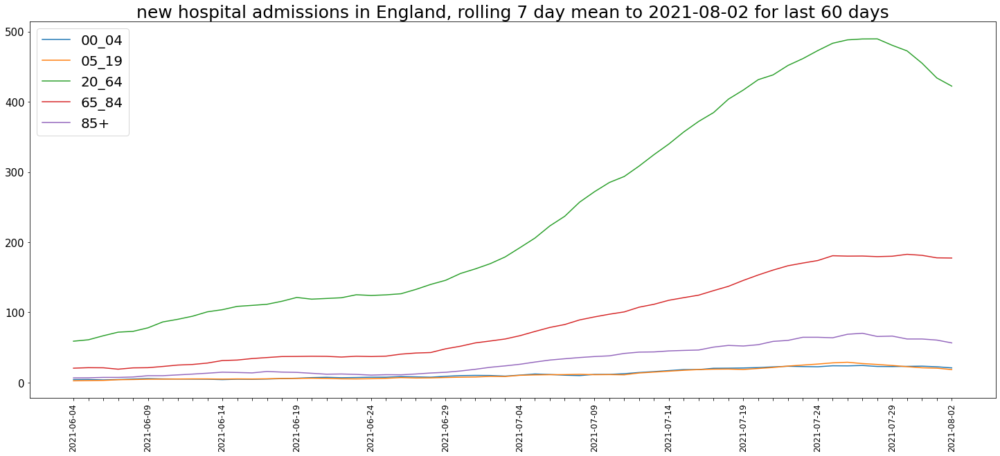

In [95]:
return1, return2, return3 = multiple_line_charts(df_eng_cumadmissionsbyage_Summary, columns, chart_titles, 
                                                 'new hospital admissions in England, rolling 7 day mean to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [96]:
columns = ['00_04_rolling7','05_19_rolling7','20_64_rolling7',
           '65_84_rolling7','85+_rolling7']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
#first_date = df_eng_cumdeathsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumdeathsbyage_Summary['date'].iloc[-1]

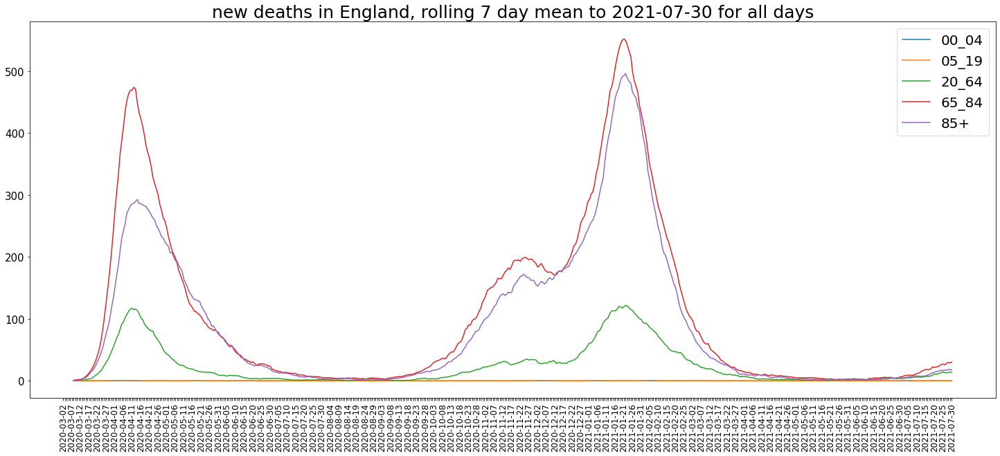

In [97]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'new deaths in England, rolling 7 day mean to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

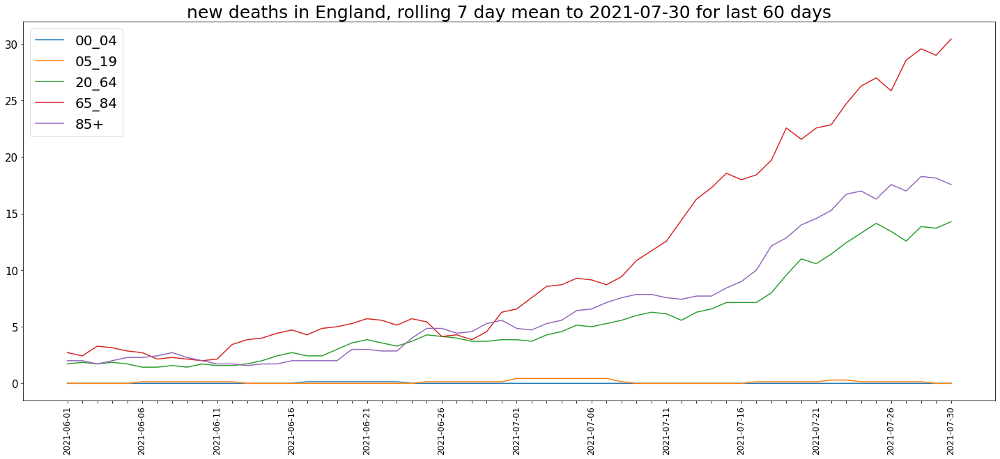

In [98]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'new deaths in England, rolling 7 day mean to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [99]:
columns = ['00_04_rolling7','05_19_rolling7','20_64_rolling7']
chart_titles = ['00_04','05_19','20_64']
#first_date = df_eng_cumdeathsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumdeathsbyage_Summary['date'].iloc[-1]

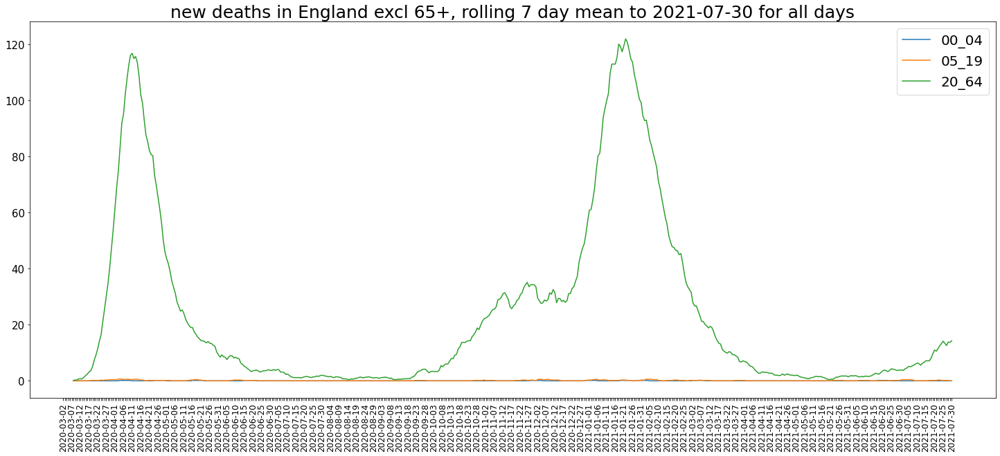

In [100]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'new deaths in England excl 65+, rolling 7 day mean to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

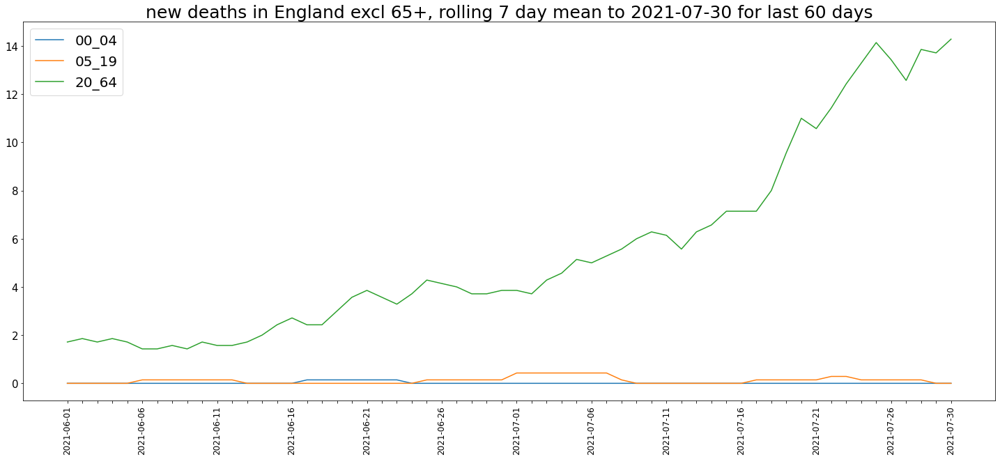

In [101]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'new deaths in England excl 65+, rolling 7 day mean to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [102]:
columns = ['00_04_cumsum','05_19_cumsum','20_64_cumsum',
           '65_84_cumsum','85+_cumsum']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
#first_date = df_eng_newcasesbyage_Summary['date'].iloc[0]
last_date = df_eng_newcasesbyage_Summary['date'].iloc[-1]

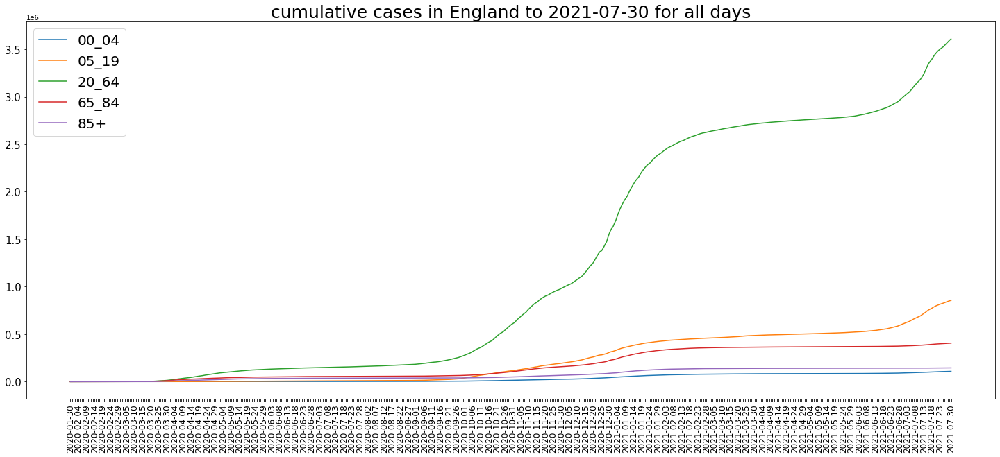

In [103]:
return1, return2, return3 = multiple_line_charts(df_eng_newcasesbyage_Summary, columns, chart_titles, 
                                                 'cumulative cases in England to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [104]:
columns = ['00_04_cumsum','05_19_cumsum',
           '65_84_cumsum','85+_cumsum']
chart_titles = ['00_04','05_19','65_84','85+']
#first_date = df_eng_newcasesbyage_Summary['date'].iloc[0]
last_date = df_eng_newcasesbyage_Summary['date'].iloc[-1]

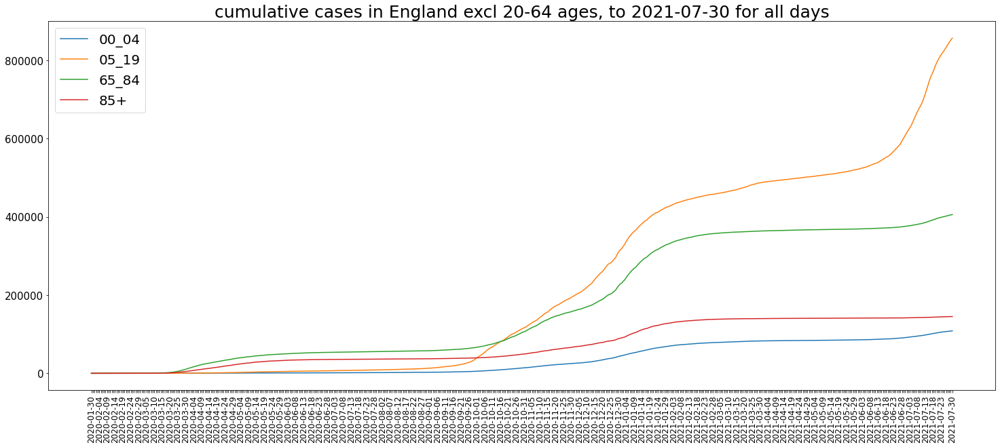

In [105]:
return1, return2, return3 = multiple_line_charts(df_eng_newcasesbyage_Summary, columns, chart_titles, 
                                                 'cumulative cases in England excl 20-64 ages, to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [106]:
columns = ['0_to_5_newcumsum','6_to_17_newcumsum','18_to_64_newcumsum',
            '65_to_84_newcumsum','85+_newcumsum']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
#first_date = df_eng_cumadmissionsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumadmissionsbyage_Summary['date'].iloc[-1]

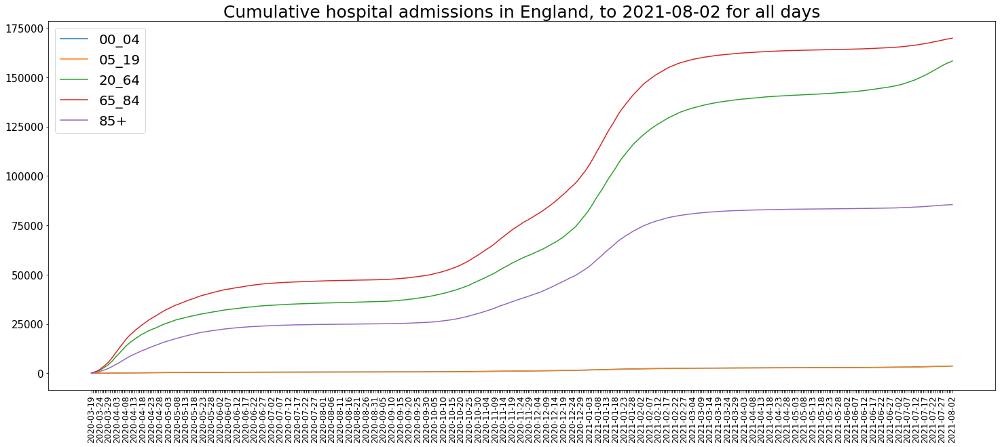

In [107]:
return1, return2, return3 = multiple_line_charts(df_eng_cumadmissionsbyage_Summary, columns, chart_titles, 
                                                 'Cumulative hospital admissions in England, to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [108]:
columns = ['00_04_cumsum','05_19_cumsum','20_64_cumsum',
           '65_84_cumsum','85+_cumsum']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
#first_date = df_eng_cumdeathsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumdeathsbyage_Summary['date'].iloc[-1]

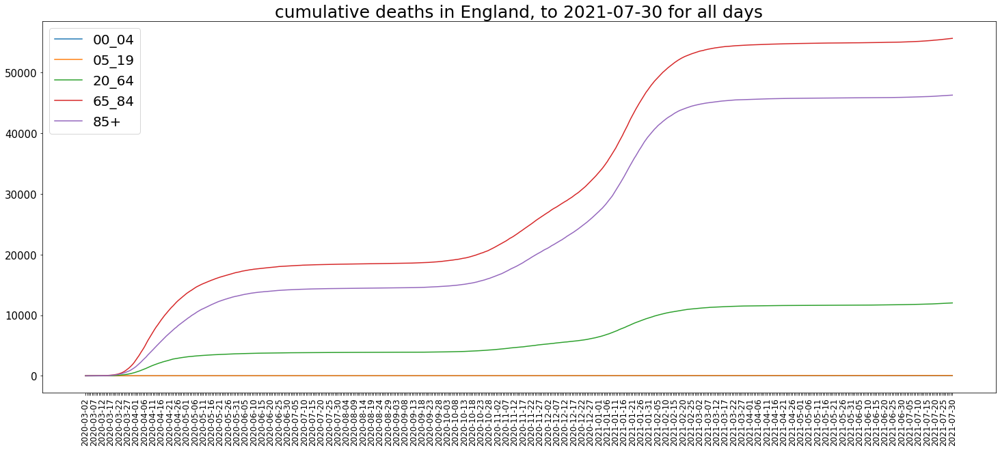

In [109]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'cumulative deaths in England, to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [110]:
columns = ['00_04_cumsum','05_19_cumsum','20_64_cumsum']
chart_titles = ['00_04','05_19','20_64']
#first_date = df_eng_cumdeathsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumdeathsbyage_Summary['date'].iloc[-1]

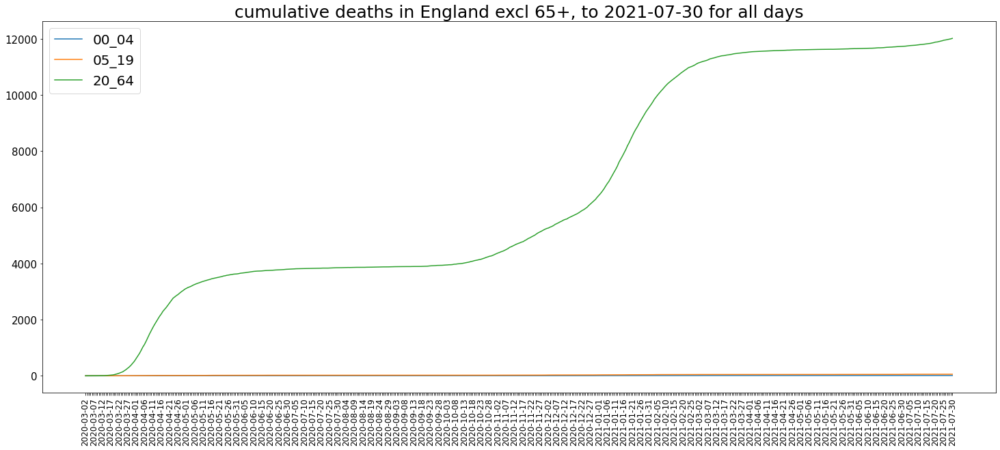

In [111]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'cumulative deaths in England excl 65+, to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [112]:
columns = ['00_04_cumsum','05_19_cumsum']
chart_titles = ['00_04','05_19']
#first_date = df_eng_cumdeathsbyage_Summary['date'].iloc[0]
last_date = df_eng_cumdeathsbyage_Summary['date'].iloc[-1]

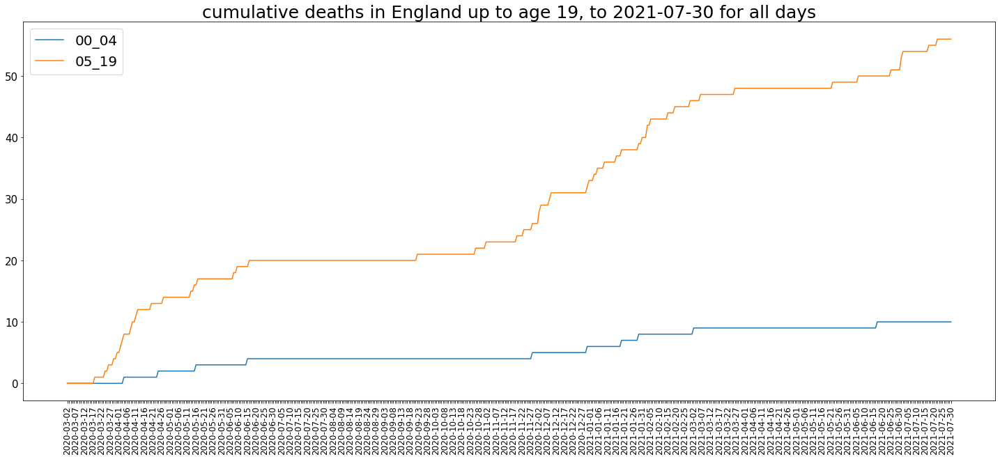

In [113]:
return1, return2, return3 = multiple_line_charts(df_eng_cumdeathsbyage_Summary, columns, chart_titles, 
                                                 'cumulative deaths in England up to age 19, to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [114]:
# for the presentation, insert a new chapter slide

if savePNG == 1 or PwrptPrep == 1:
    #plt.savefig('Auto Trader - bar chart of Lookers cars on site.png', bbox_inches = 'tight')
    
    slideTitle.append('SECTION 3: Comparing the second and third waves for hospital admissions and deaths')
    slideText.append('')
    imagePath.append('')

plt.show()

In [115]:
# create a new dataframe for second / third waves of hospital addmissions and deaths

hospital_second_wave_start = df_summary[df_summary['newAdmissions'] == 
                                       df_summary[df_summary['date']<'2020-09-01']['newAdmissions'].min()]['date'].index.values[0]
hospital_winter_wave_start = df_summary[hospital_second_wave_start+1:][df_summary['newAdmissions'] == 
                                       df_summary[(df_summary['date']>'2020-11-15') &
                                                  (df_summary['date']<'2020-12-31')]['newAdmissions'].min()]['date'].index.values[0]
hospital_third_wave_start = df_summary[hospital_winter_wave_start+1:][df_summary['newAdmissions'] == 
                                       df_summary[(df_summary['date']>'2020-12-31') &
                                                  (df_summary['date']<'2021-07-15')]['newAdmissions'].min()]['date'].index.values[0]


# hospital_third_wave_start = df_summary[df_summary['newAdmissions'] == 
#                                        df_summary[df_summary['date']>'2020-12-31']['newAdmissions'].min()]['date'].index.values[0]


hospital_second_wave_start, hospital_winter_wave_start, hospital_third_wave_start

C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.


(205, 303, 472)

In [116]:
df_secondwave = df_summary[hospital_second_wave_start:hospital_second_wave_start+100]
df_winterwave = df_summary[hospital_winter_wave_start:hospital_winter_wave_start+100]
df_thirdwave = df_summary[hospital_third_wave_start:]


In [117]:
second_wave_Sdate = df_secondwave['date'].iloc[0]
winter_wave_Sdate = df_winterwave['date'].iloc[0]
third_wave_Sdate = df_thirdwave['date'].iloc[0]

second_wave_Sdate, winter_wave_Sdate, third_wave_Sdate

('2020-08-22', '2020-11-28', '2021-05-16')

In [118]:
col_ages = ['0_to_5_new','6_to_17_new','18_to_64_new','65_to_84_new','85+_new']

In [119]:
for i in range(len(col_ages)):
    list_2 = (df_eng_cumadmissionsbyage_Summary[col_ages[i]][df_eng_cumadmissionsbyage_Summary[df_eng_cumadmissionsbyage_Summary['date'] == second_wave_Sdate].index.values[0]:
                                               df_eng_cumadmissionsbyage_Summary[df_eng_cumadmissionsbyage_Summary['date'] == second_wave_Sdate].index.values[0]+100]
            .to_list())

    list_w = (df_eng_cumadmissionsbyage_Summary[col_ages[i]][df_eng_cumadmissionsbyage_Summary[df_eng_cumadmissionsbyage_Summary['date'] == winter_wave_Sdate].index.values[0]:
                                               df_eng_cumadmissionsbyage_Summary[df_eng_cumadmissionsbyage_Summary['date'] == winter_wave_Sdate].index.values[0]+100]
            .to_list())
    
    list_3 = (df_eng_cumadmissionsbyage_Summary[col_ages[i]][df_eng_cumadmissionsbyage_Summary[df_eng_cumadmissionsbyage_Summary['date'] == third_wave_Sdate].index.values[0]:
                                               df_eng_cumadmissionsbyage_Summary[df_eng_cumadmissionsbyage_Summary['date'] == third_wave_Sdate].index.values[0]+100]
            .to_list())    
    
    for ii in range(len(df_thirdwave) - len(list_3)):
        list_3.append(np.nan)
    
    df_secondwave[col_ages[i]] = list_2
    df_winterwave[col_ages[i]] = list_w
    df_thirdwave[col_ages[i]] = list_3


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-

In [120]:
col_ages_deaths = ['00_04_','05_19_','20_64_','65_84_','85+_']

In [121]:
for i in range(len(col_ages_deaths)):
    list_2 = (df_eng_cumdeathsbyage_Summary[col_ages_deaths[i]][df_eng_cumdeathsbyage_Summary[df_eng_cumdeathsbyage_Summary['date'] == second_wave_Sdate].index.values[0]:
                                               df_eng_cumdeathsbyage_Summary[df_eng_cumdeathsbyage_Summary['date'] == second_wave_Sdate].index.values[0]+100]
            .to_list())

    list_w = (df_eng_cumdeathsbyage_Summary[col_ages_deaths[i]][df_eng_cumdeathsbyage_Summary[df_eng_cumdeathsbyage_Summary['date'] == winter_wave_Sdate].index.values[0]:
                                               df_eng_cumdeathsbyage_Summary[df_eng_cumdeathsbyage_Summary['date'] == winter_wave_Sdate].index.values[0]+100]
            .to_list())
    
    list_3 = (df_eng_cumdeathsbyage_Summary[col_ages_deaths[i]][df_eng_cumdeathsbyage_Summary[df_eng_cumdeathsbyage_Summary['date'] == third_wave_Sdate].index.values[0]:
                                               df_eng_cumdeathsbyage_Summary[df_eng_cumdeathsbyage_Summary['date'] == third_wave_Sdate].index.values[0]+100]
            .to_list())    
    
    for ii in range(len(df_thirdwave) - len(list_3)):
        list_3.append(np.nan)
    
    df_secondwave[col_ages_deaths[i]+str('deaths')] = list_2
    df_winterwave[col_ages_deaths[i]+str('deaths')] = list_w
    df_thirdwave[col_ages_deaths[i]+str('deaths')] = list_3


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-

In [122]:
df_secondwave.head()

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests,%_on_ventilation,%_positive_tests,leaving_hospital,leavers_%_admissions,newAdmissions%_inHospital,leavers_%_inHospital,deaths_%_vent,newVirusTests_rolling,newCasesBySpecimenDate_rolling,newAdmissions_rolling,leaving_hospital_rolling,newDeaths28DaysByDeathDate_rolling,newCasesBySpecimenDate_rolling_sum,newCasesBySpecimenDate_caseRate,newCasesBySpecimenDate_caseRate_rolling,0_to_5_new,6_to_17_new,18_to_64_new,65_to_84_new,85+_new,00_04_deaths,05_19_deaths,20_64_deaths,65_84_deaths,85+_deaths
205,2020-08-22,824,327283,8.0,41569.0,72.0,134676.0,943.0,71.0,177279.0,13851399.0,0.075292,0.006475,9.0,0.971510,0.106719,0.103679,0.099415,169481.000000,1097.428571,100.285714,97.428571,7.285714,7682.0,11.500000,11.149487,1,0,11,8,5,0,0,2,4,0
206,2020-08-23,824,328107,14.0,41583.0,74.0,134750.0,870.0,72.0,165455.0,14017466.0,0.082759,0.006681,133.0,1.068966,0.107590,0.115010,0.120316,169096.857143,1129.714286,99.428571,106.285714,8.714286,7908.0,11.838323,11.213216,1,0,33,9,1,0,0,1,8,10
207,2020-08-24,1275,329382,6.0,41589.0,92.0,134842.0,876.0,68.0,147940.0,14165419.0,0.077626,0.006669,80.0,1.073806,0.108597,0.116612,0.109562,169336.285714,1129.285714,98.714286,106.000000,7.857143,7905.0,11.833832,11.317365,1,0,16,16,8,0,0,2,2,0
208,2020-08-25,1246,330628,12.0,41601.0,122.0,134964.0,844.0,68.0,179602.0,14366169.0,0.080569,0.006681,142.0,1.074671,0.109210,0.117365,0.116700,172537.428571,1152.714286,97.571429,104.857143,8.285714,8069.0,12.079341,11.511762,0,0,32,23,5,0,0,2,5,2
209,2020-08-26,1349,331977,11.0,41612.0,132.0,135096.0,829.0,64.0,206143.0,14573699.0,0.077201,0.006634,136.0,1.041488,0.113492,0.118201,0.134420,176078.142857,1168.142857,99.857143,104.000000,9.428571,8177.0,12.241018,11.721771,2,1,29,12,8,0,0,1,6,4


In [123]:
df_winterwave.head()

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests,%_on_ventilation,%_positive_tests,leaving_hospital,leavers_%_admissions,newAdmissions%_inHospital,leavers_%_inHospital,deaths_%_vent,newVirusTests_rolling,newCasesBySpecimenDate_rolling,newAdmissions_rolling,leaving_hospital_rolling,newDeaths28DaysByDeathDate_rolling,newCasesBySpecimenDate_rolling_sum,newCasesBySpecimenDate_caseRate,newCasesBySpecimenDate_caseRate_rolling,0_to_5_new,6_to_17_new,18_to_64_new,65_to_84_new,85+_new,00_04_deaths,05_19_deaths,20_64_deaths,65_84_deaths,85+_deaths
303,2020-11-28,10965,1633570,467.0,59539.0,1220.0,220942.0,15985.0,1378.0,311126.0,40534403.0,0.086206,0.047289,1339.0,0.789385,0.085155,0.067220,0.315815,312561.000000,14780.571429,1445.428571,1141.000000,458.428571,103464.0,154.886228,169.228614,9,5,305,459,287,1,1,30,201,150
304,2020-11-29,10683,1644253,465.0,60004.0,1388.0,222330.0,16313.0,1387.0,219899.0,40756444.0,0.085024,0.048109,595.0,0.775514,0.084960,0.065888,0.316921,304112.142857,14630.571429,1430.571429,1109.428571,457.000000,102414.0,153.314371,163.508554,9,12,376,513,305,0,0,35,187,187
305,2020-11-30,18014,1662267,423.0,60427.0,1405.0,223735.0,16565.0,1357.0,214835.0,40989701.0,0.081920,0.047704,730.0,0.792188,0.084204,0.066705,0.316941,304441.000000,14523.000000,1404.428571,1112.571429,451.142857,101661.0,152.187126,159.295979,6,10,367,526,306,0,0,31,182,148
306,2020-12-01,16454,1678721,399.0,60826.0,1490.0,225225.0,16312.0,1351.0,312003.0,41307854.0,0.082822,0.047700,1344.0,0.798004,0.084936,0.067779,0.315082,304475.285714,14523.571429,1403.142857,1119.714286,442.285714,101665.0,152.193114,156.519461,7,7,412,523,300,0,0,26,188,130
307,2020-12-02,16469,1695190,386.0,61212.0,1486.0,226711.0,15977.0,1315.0,352990.0,41660895.0,0.082306,0.047703,1435.0,0.809882,0.084675,0.068577,0.310320,304041.571429,14503.571429,1384.857143,1121.571429,428.285714,101525.0,151.983533,154.598375,9,19,385,538,307,0,2,17,168,149


In [124]:
df_thirdwave.head()

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests,%_on_ventilation,%_positive_tests,leaving_hospital,leavers_%_admissions,newAdmissions%_inHospital,leavers_%_inHospital,deaths_%_vent,newVirusTests_rolling,newCasesBySpecimenDate_rolling,newAdmissions_rolling,leaving_hospital_rolling,newDeaths28DaysByDeathDate_rolling,newCasesBySpecimenDate_rolling_sum,newCasesBySpecimenDate_caseRate,newCasesBySpecimenDate_caseRate_rolling,0_to_5_new,6_to_17_new,18_to_64_new,65_to_84_new,85+_new,00_04_deaths,05_19_deaths,20_64_deaths,65_84_deaths,85+_deaths
472,2021-05-16,1854,4448160,8.0,127793.0,80.0,465644.0,940.0,123.0,1086443.0,166384182.0,0.130851,0.002387,97.0,1.169054,0.097214,0.113649,0.064130,865092.285714,2065.142857,99.714286,116.571429,8.428571,14456.0,21.640719,22.153978,0,3,35,14,7,0.0,0.0,2.0,7.0,3.0
473,2021-05-17,2764,4450924,7.0,127800.0,102.0,465746.0,942.0,125.0,967126.0,167599744.0,0.132696,0.002401,93.0,1.183908,0.099514,0.117815,0.064732,866757.857143,2081.285714,99.428571,117.714286,8.285714,14569.0,21.809880,22.026305,4,2,46,11,11,0.0,0.0,0.0,2.0,2.0
474,2021-05-18,2710,4453634,6.0,127806.0,127.0,465873.0,897.0,124.0,732012.0,168404482.0,0.138239,0.002477,166.0,1.220979,0.105364,0.128647,0.056689,869744.714286,2154.428571,102.142857,124.714286,7.142857,15081.0,22.576347,22.051112,0,2,62,17,9,0.0,0.0,0.0,1.0,0.0
475,2021-05-19,2710,4456344,5.0,127811.0,126.0,465999.0,917.0,122.0,1180660.0,169635175.0,0.133043,0.002558,101.0,1.146814,0.108800,0.124774,0.050691,869133.142857,2223.000000,103.142857,118.285714,6.285714,15561.0,23.294910,22.213430,3,3,56,23,8,0.0,0.0,0.0,3.0,0.0
476,2021-05-20,2424,4458768,5.0,127816.0,131.0,466130.0,911.0,123.0,982099.0,170774076.0,0.135016,0.002613,132.0,1.060080,0.114404,0.121277,0.051044,869021.428571,2270.428571,107.000000,113.428571,6.285714,15893.0,23.791916,22.461933,3,2,64,17,12,0.0,0.0,-1.0,1.0,2.0


In [125]:
def wave_charts(chart_title, col):

    # bar = bar chart rather than line chart
    # percent is percent y labels rather than absolute numbers
    # rolling = print rolling line
    # days = number of days to plot from the end, 0 = all days

    fig, ax = plt.subplots(figsize=(25,10))

    plt.subplots_adjust(hspace=0.6, wspace=0.2)

    # start_date = df['date'].iloc[0]
    # end_date = df['date'].iloc[-1]

    # x = df.index.values[-days:]

    x1 = list(range(len(df_secondwave)))
    x2 = list(range(len(df_winterwave)))
    x3 = list(range(len(df_thirdwave)))
    
    second_wave_date = df_secondwave['date'].iloc[0]
    winter_wave_date = df_winterwave['date'].iloc[0]
    third_wave_date = df_thirdwave['date'].iloc[0]
    

    labels = list(range(150))

    # transparent = 0.5

    # days_print = 'for last ' + str(days) + ' days'
    slideText1 = ("second wave started: " + str(second_wave_date) + "; winter wave started: " 
                  + str(winter_wave_date) + "; third wave started: " + str(third_wave_date))

    # if days = 0 then print entire chart   
    # if days == 0:
    #     days = len(list(df['date']))
    #     days_print = 'for all days'
    #     transparent = 1 # set bars for full fill
    #     slideText1 = (str(start_date) + ' to ' + str(end_date))

    #  chart_title = chart_title + ' ' + days_print

    # prevent x-axis labels from overlapping by printing every nth label
    for i in range(5,len(labels),5): # label prints at every nth label
        for ii in range(1,5): # the rest is blanks
            labels[i-ii] =''

    # for the final label, ensure there is space to avoid a clash
    # labels[len(labels)-1]=list(df['date'])[-1]
    # labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''

    y1 = df_secondwave[col]
    y2 = df_winterwave[col]
    y3 = df_thirdwave[col]
    # if rolling == 1:
    #     y2 = df[column + '_rolling'][-days:]
    #     chart_title_1 = chart_title + ' and 7 day rolling average'
    # else:
    #     chart_title_1 = chart_title

    ax.set_title(chart_title, fontsize=25)
    ax.set_xticklabels(labels, rotation=90, fontsize=12)
    ax.set_xticks(x1)

    # if percent == 1:
    #     ax.yaxis.set_major_formatter(ticker.PercentFormatter(1.0, decimals=0))

    ax.yaxis.set_tick_params(labelsize=15)

    ax.plot(x1, y1, label = 'second wave')
    ax.plot(x2, y2, label = 'winter wave')
    ax.plot(x3, y3, label = 'third wave')

    ax.legend(fontsize=20)


    fileName = 'Coviduk - wavechart ' + str(chart_title) + '.png'  

    plt.savefig(fileName, bbox_inches = 'tight')

    slideTitle_ = chart_title
    slideText_ = slideText1
    imagePath_ = (fileName)  

    plt.show()

    return slideTitle_, slideText_, imagePath_

In [126]:
def wave_charts_ages(chart_title, cols):

    # bar = bar chart rather than line chart
    # percent is percent y labels rather than absolute numbers
    # rolling = print rolling line
    # days = number of days to plot from the end, 0 = all days

    fig, ax = plt.subplots(figsize=(25,10))

    plt.subplots_adjust(hspace=0.6, wspace=0.2)

    # start_date = df['date'].iloc[0]
    # end_date = df['date'].iloc[-1]

    # x = df.index.values[-days:]

    x1 = list(range(len(df_secondwave)))
    x2 = list(range(len(df_winterwave)))
    x3 = list(range(len(df_thirdwave)))
    
    second_wave_date = df_secondwave['date'].iloc[0]
    winter_wave_date = df_winterwave['date'].iloc[0]
    third_wave_date = df_thirdwave['date'].iloc[0]
    

    labels = list(range(150))

    # transparent = 0.5

    # days_print = 'for last ' + str(days) + ' days'
    slideText1 = ("second wave started: " + str(second_wave_date) + "; winter wave started: " 
                  + str(winter_wave_date) + "; third wave started: " + str(third_wave_date))

    # if days = 0 then print entire chart   
    # if days == 0:
    #     days = len(list(df['date']))
    #     days_print = 'for all days'
    #     transparent = 1 # set bars for full fill
    #     slideText1 = (str(start_date) + ' to ' + str(end_date))

    #  chart_title = chart_title + ' ' + days_print

    # prevent x-axis labels from overlapping by printing every nth label
    for i in range(5,len(labels),5): # label prints at every nth label
        for ii in range(1,5): # the rest is blanks
            labels[i-ii] =''

    # for the final label, ensure there is space to avoid a clash
    # labels[len(labels)-1]=list(df['date'])[-1]
    # labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''

    y1=[]
    for i in range(len(cols)):
        y1.append(df_secondwave[cols[i]])
        
    #y2 = df_winterwave[col]

    y3=[]
    for i in range(len(cols)):
        y3.append(df_thirdwave[cols[i]])

    # if rolling == 1:
    #     y2 = df[column + '_rolling'][-days:]
    #     chart_title_1 = chart_title + ' and 7 day rolling average'
    # else:
    #     chart_title_1 = chart_title

    ax.set_title(chart_title, fontsize=25)
    ax.set_xticklabels(labels, rotation=90, fontsize=12)
    ax.set_xticks(x1)

    # if percent == 1:
    #     ax.yaxis.set_major_formatter(ticker.PercentFormatter(1.0, decimals=0))

    ax.yaxis.set_tick_params(labelsize=15)

    colour_list = ['b','g','r','m','k']
    
    
    for i in range(len(cols)):
        ax.plot(x1, y1[i], label = 'second wave: ' + str(cols[i][:-4]), color = colour_list[i], linestyle = '--')
        #ax.plot(x2, y2, label = 'winter wave')
        ax.plot(x3, y3[i], label = 'third wave: ' + str(cols[i][:-4]), color = colour_list[i], linestyle = '-')

    ax.legend(fontsize=20)


    fileName = 'Coviduk - wavechart_ages ' + str(chart_title) + '.png'  

    plt.savefig(fileName, bbox_inches = 'tight')

    slideTitle_ = chart_title
    slideText_ = slideText1
    imagePath_ = (fileName)  

    plt.show()

    return slideTitle_, slideText_, imagePath_

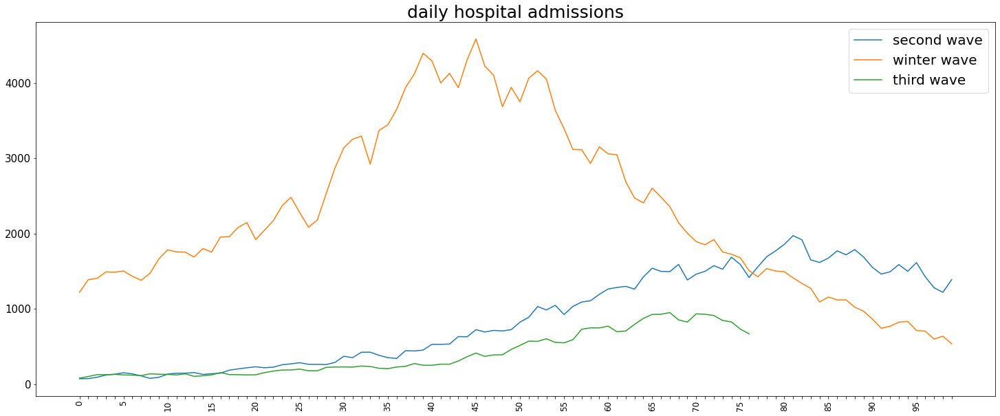

In [127]:
#wave_charts('daily hospital admissions', 'newAdmissions')

return1, return2, return3 = wave_charts('daily hospital admissions', 'newAdmissions')

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

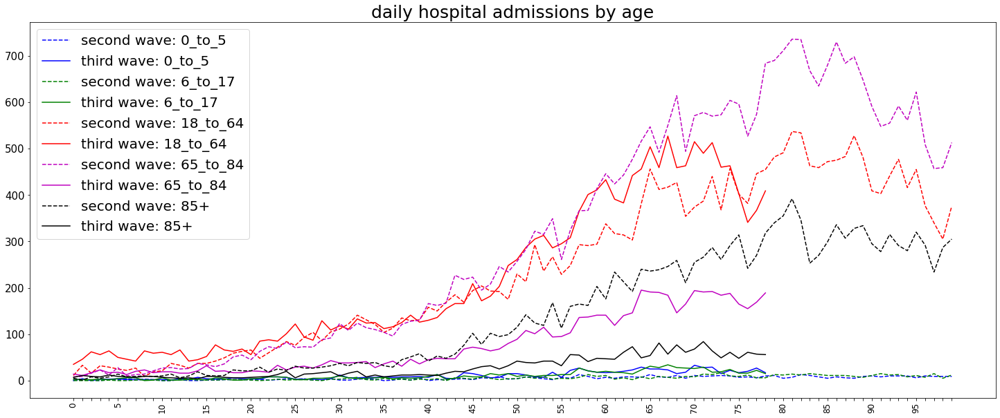

In [128]:
return1, return2, return3 = wave_charts_ages('daily hospital admissions by age', col_ages)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

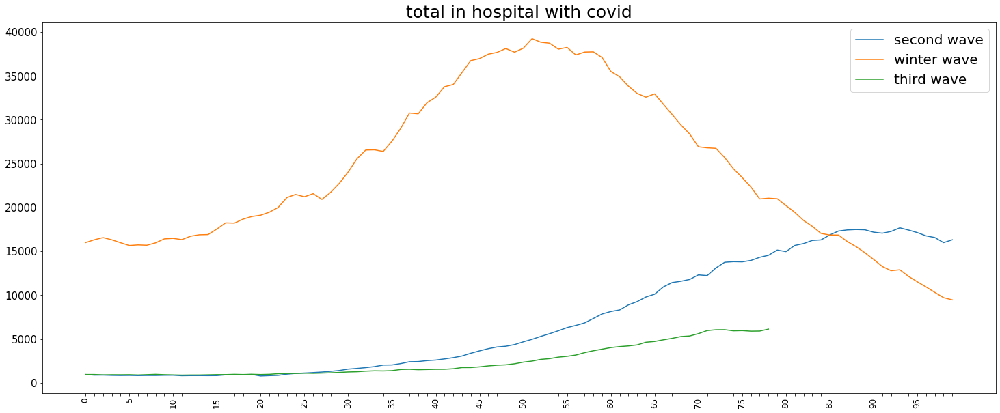

In [129]:
#wave_charts('total in hospital with covid', 'hospitalCases')

return1, return2, return3 = wave_charts('total in hospital with covid', 'hospitalCases')

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

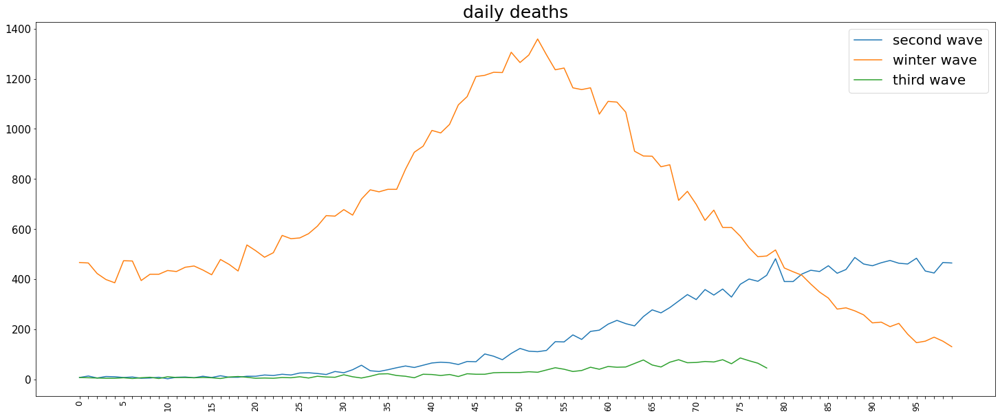

In [130]:
#wave_charts('daily deaths', 'newDeaths28DaysByDeathDate')

return1, return2, return3 = wave_charts('daily deaths', 'newDeaths28DaysByDeathDate')

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [131]:
#col_ages_deaths
string = 'deaths'
col_ages_deaths_ = [x + string for x in col_ages_deaths]

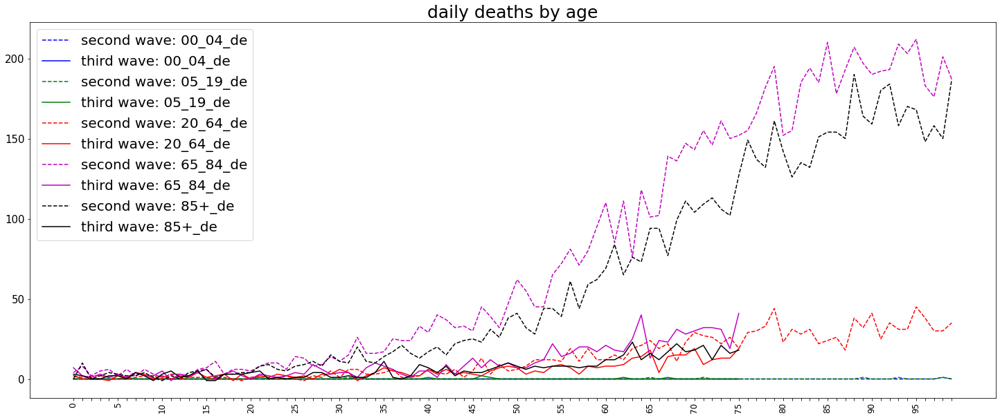

In [132]:
return1, return2, return3 = wave_charts_ages('daily deaths by age', col_ages_deaths_)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [133]:
# for the presentation, insert a new chapter slide

if savePNG == 1 or PwrptPrep == 1:
    #plt.savefig('Auto Trader - bar chart of Lookers cars on site.png', bbox_inches = 'tight')
    
    slideTitle.append('Section 4: Regional Data')
    slideText.append('')
    imagePath.append('')

plt.show()

In [134]:
df_EM.tail()

,areaCode,areaName,areaType,date,newCasesBySpecimenDate,newDeaths28DaysByDeathDate
525,E12000004,East Midlands,region,2021-07-30,2050,6.0
526,E12000004,East Midlands,region,2021-07-31,1814,5.0
527,E12000004,East Midlands,region,2021-08-01,1717,3.0
528,E12000004,East Midlands,region,2021-08-02,2332,2.0
529,E12000004,East Midlands,region,2021-08-03,624,0.0


In [135]:
# add a new column to each dataframe for the rolling 7 day mean

In [136]:
def rolling_seven(df, col_names):
    
    col_names = col_names
    
    for i in range(len(col_names)):
        df[str(col_names[i]) + '_rolling'] = df[str(col_names[i])].rolling(7).mean()

In [137]:
df_list = [df_EM, df_EE, df_LO, df_NE, df_NW, df_SE, df_SW, df_WM, df_YH]

col_names = ['newCasesBySpecimenDate', 'newDeaths28DaysByDeathDate']

In [138]:
for i in range(len(df_list)):
    rolling_seven(df_list[i], col_names)

In [139]:
def regional_charts(df, col_names, chart_titles, region, days):

    col_names = col_names

    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(25,25))

    last_date = df['date'].iloc[-1]

    start_date = df['date'].iloc[0]
    end_date = df['date'].iloc[-1]
    
    transparent = 0.5
        
    # if days = 0 then print entire chart
    days_print = 'for last ' + str(days)
    slideText1 = str(days_print) + ' to ' + str(last_date)
    
    if days == 0:
        days = len(list(df['date']))
        days_print = 'for all days'
        transparent = 1 # set bars for full fill
        slideText1 = (str(start_date) + ' to ' + str(end_date))

    plt.subplots_adjust(hspace=0.4, wspace=0.6)
    plt.suptitle('Bar charts showing daily new cases and new deaths in ' + str(region) + ' to ' + last_date + 
                 ' ' + str(days_print), fontsize = 20)

    x = df.index.values[-days:]
    x1 = df.index.values[-days:-5] # for rolling deaths, dont plot the last 5 data points, incomplete

    labels = list(df['date'][-days:])

    # prevent x-axis labels from overlapping by printing every nth label
    for i in range(5,len(labels),5): # label prints at every nth label
        for ii in range(1,5): # the rest is blanks
            labels[i-ii] =''

    # for the final label, ensure there is space to avoid a clash
    labels[len(labels)-1]=list(df['date'])[-1]
    labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''


    for ii in range(len(col_names)):

        y1 = df[col_names[ii]][-days:]
        if ii == 1:
            y2 = df[str(col_names[ii]) + '_rolling'][-days:-5]
        else:
            y2 = df[str(col_names[ii]) + '_rolling'][-days:]
        ax[ii].set_title(chart_titles[ii] + days_print, fontsize=20)
        ax[ii].set_xticks(x)
        ax[ii].set_xticklabels(labels, rotation = 90, fontsize=12)
        ax[ii].yaxis.set_tick_params(labelsize=15)
        ax[ii].yaxis.set_major_locator(MaxNLocator(integer=True))
        ax[ii].bar(x,y1, color='#1f77b4', alpha = transparent)

        if ii ==1:
            ax[ii].plot(x1,y2, color='black', lw=4)
        else:
            ax[ii].plot(x,y2, color='black', lw=4) 

    fileName = 'Coviduk - regional charts for ' + str(days_print) + str(region) + '.png'  
    
    
    # need to remove any dates filename when saved as .png given they change
    # but keep the days printed in to differentiate the filenames
    plt.savefig(fileName, bbox_inches = 'tight')
    
    slideTitle_ = str(region) + ': daily cases and daily deaths'
    slideText_ = slideText1
    imagePath_ = (fileName)  
    
    plt.show()
    
    return slideTitle_, slideText_, imagePath_ 

In [140]:
col_names = ['newCasesBySpecimenDate', 'newDeaths28DaysByDeathDate']

chart_titles = ['daily new cases and 7 day rolling mean',
                'daily new deaths by date of death and 7 day rolling mean']

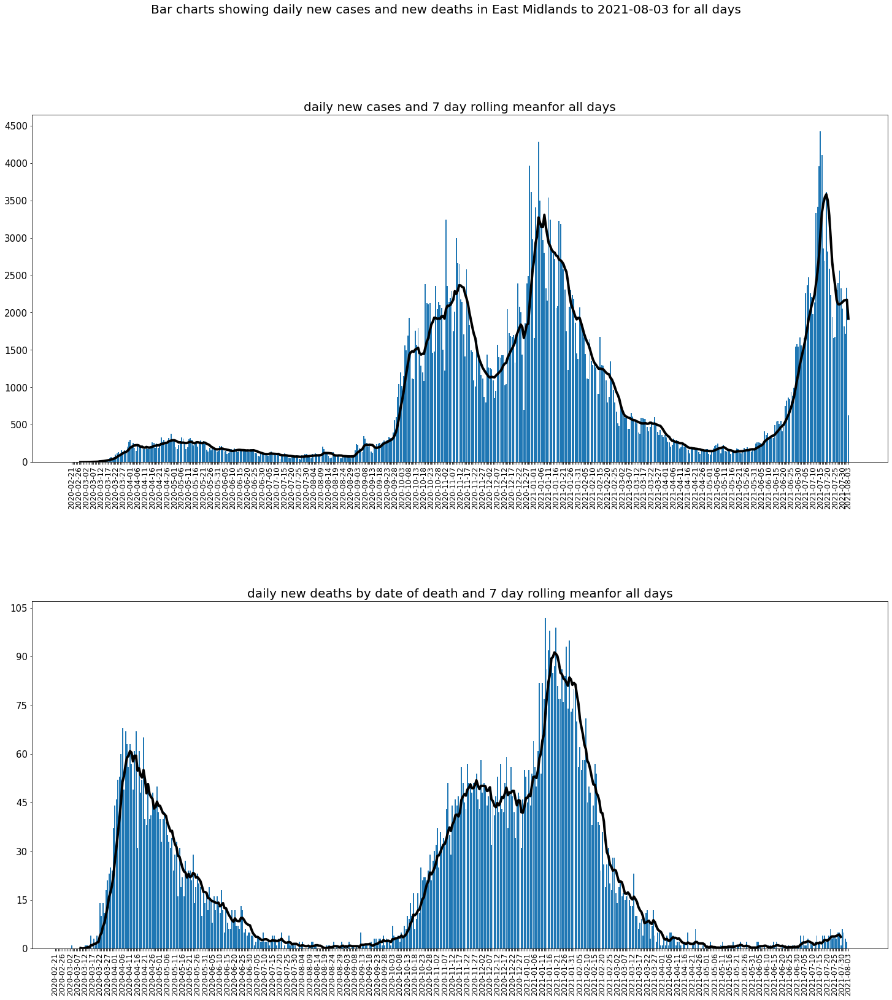

In [141]:
return1, return2, return3 = regional_charts(df_EM, col_names, chart_titles, 'East Midlands', 0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

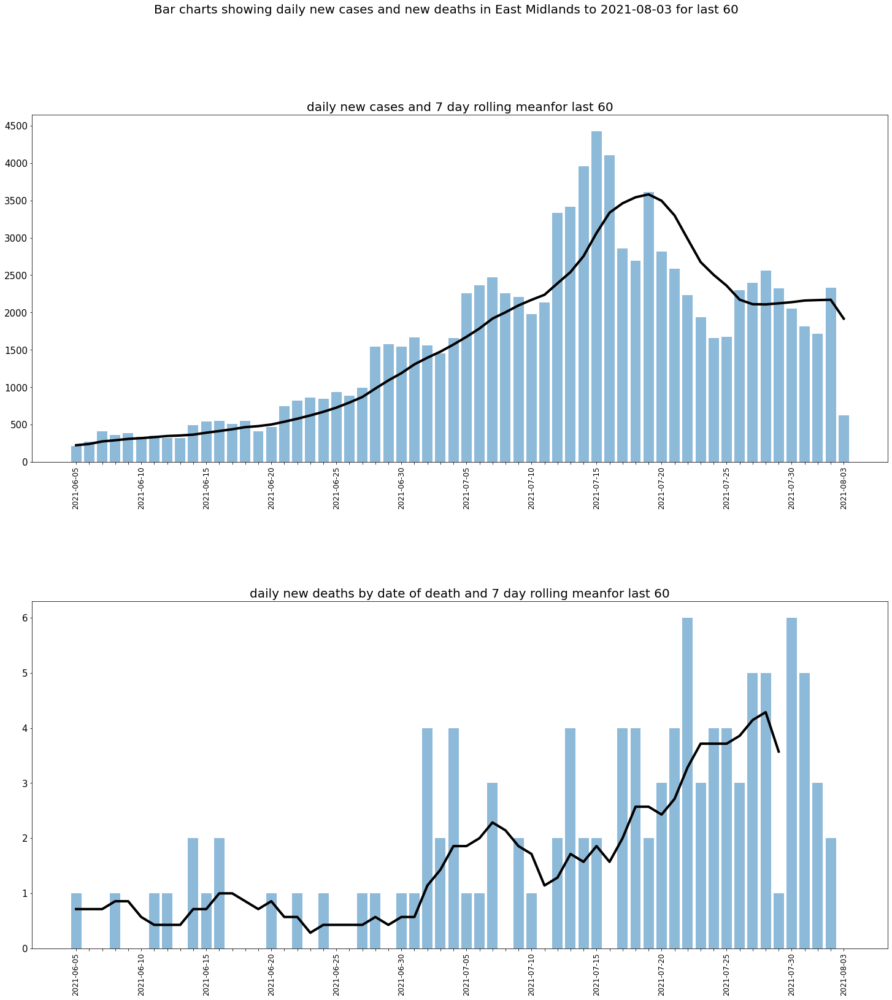

In [142]:
return1, return2, return3 = regional_charts(df_EM, col_names, chart_titles, 'East Midlands', 60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

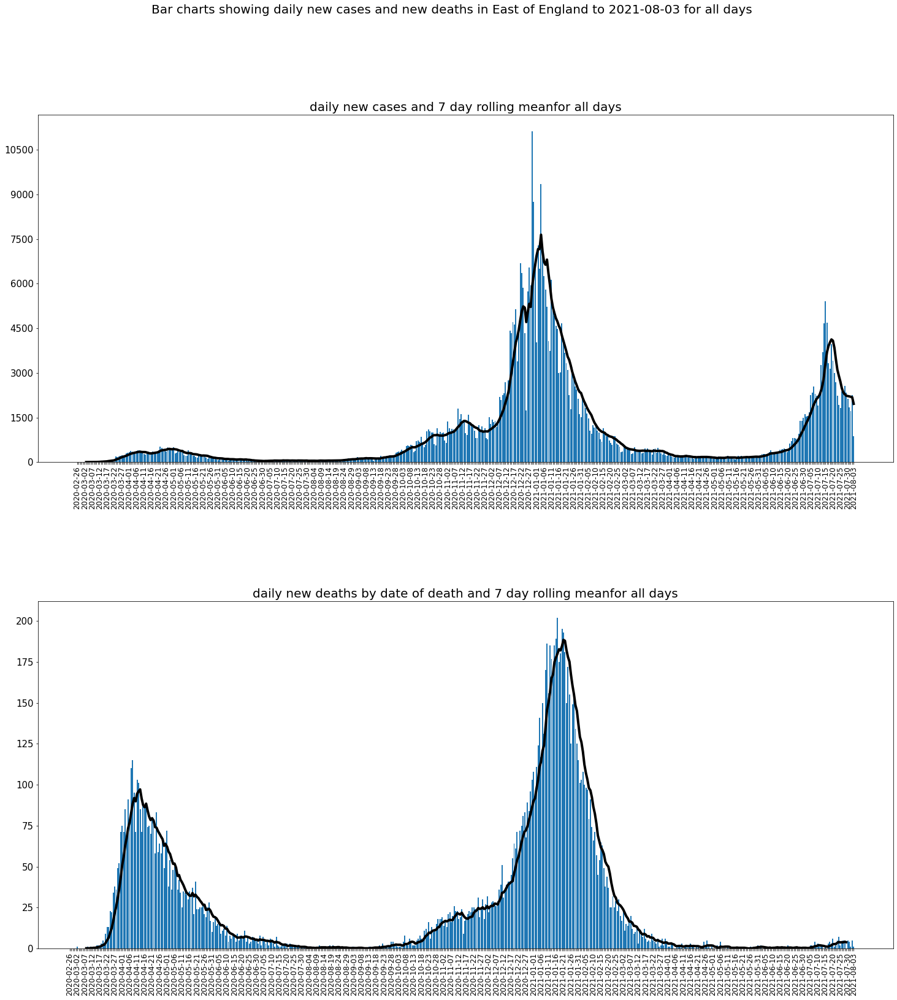

In [143]:
return1, return2, return3 = regional_charts(df_EE, col_names, chart_titles, 'East of England',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

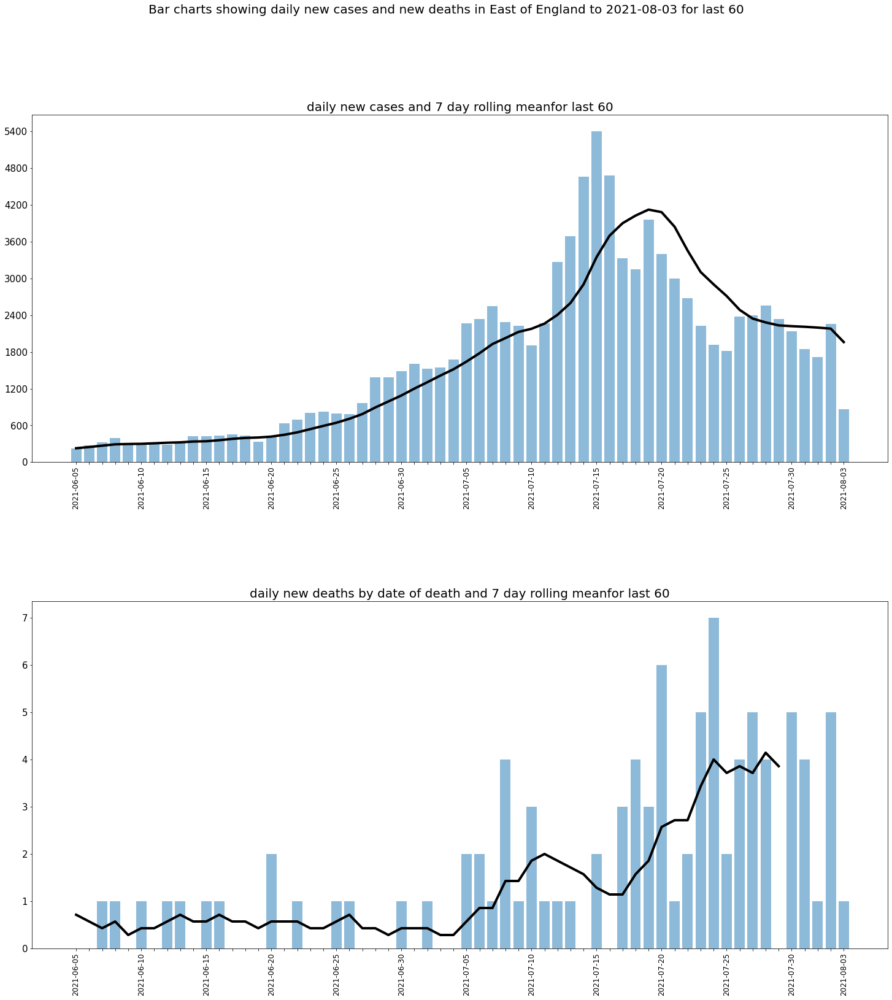

In [144]:
return1, return2, return3 = regional_charts(df_EE, col_names, chart_titles, 'East of England',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

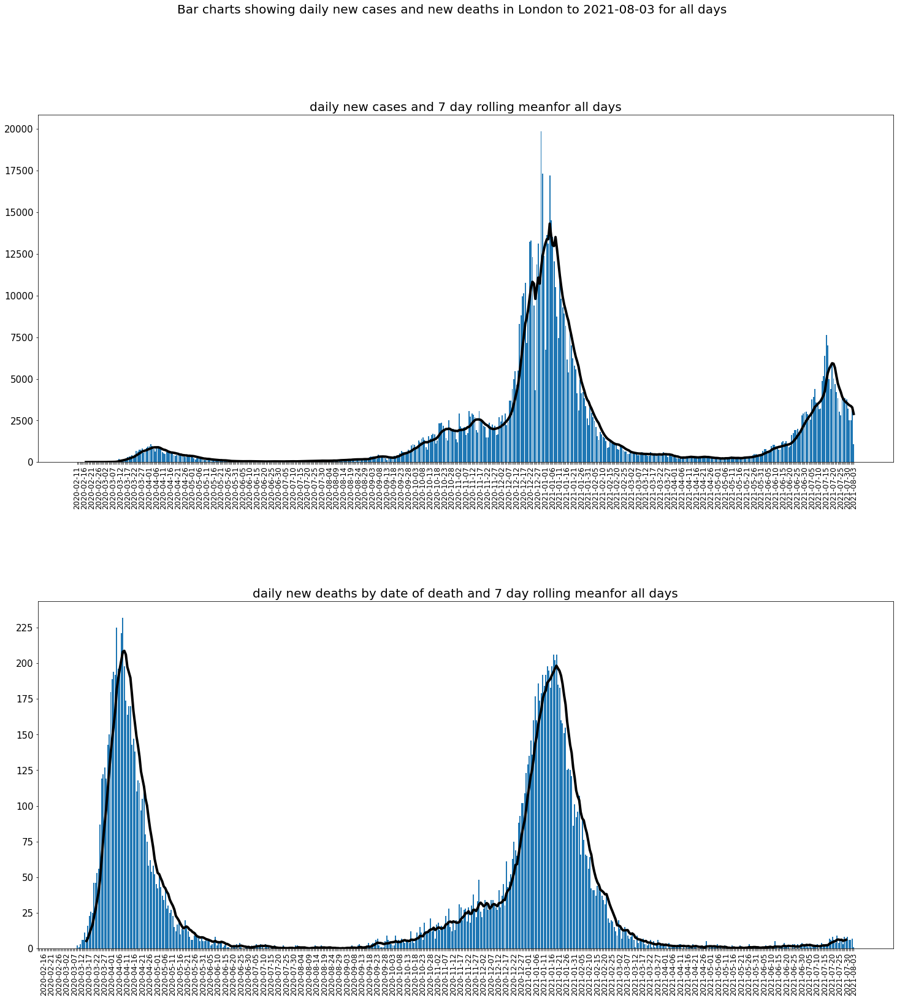

In [145]:
return1, return2, return3 = regional_charts(df_LO, col_names, chart_titles, 'London',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

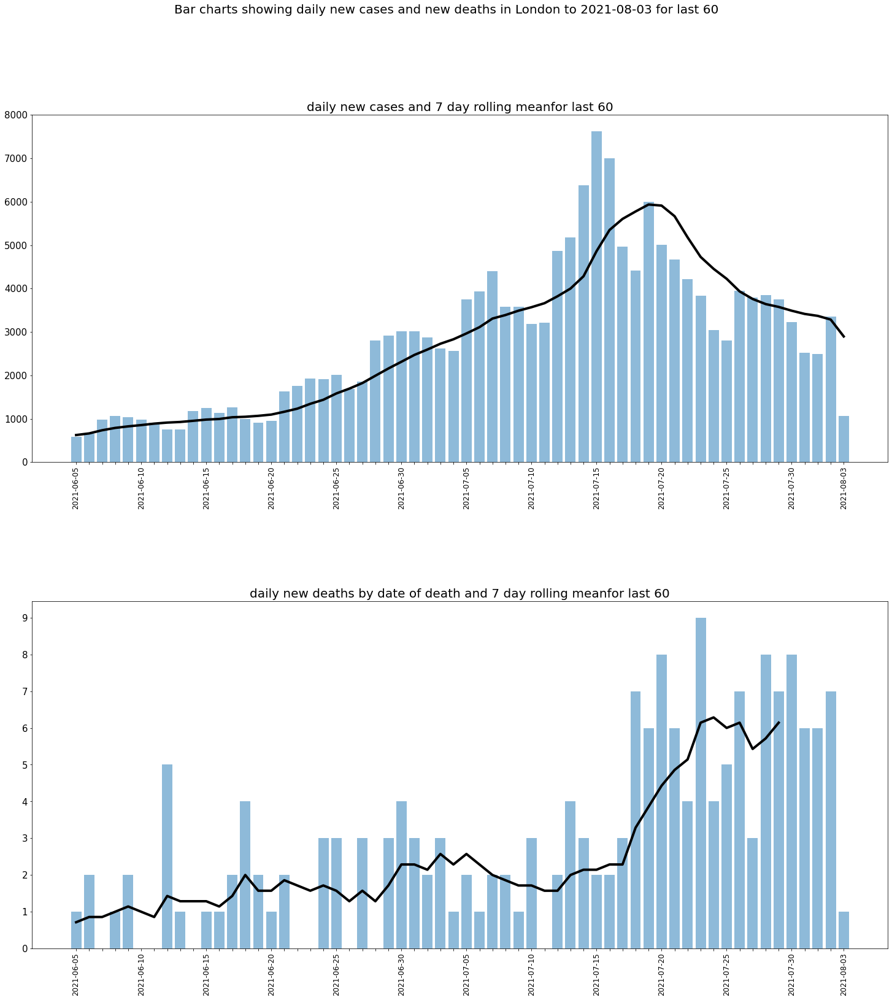

In [146]:
return1, return2, return3 = regional_charts(df_LO, col_names, chart_titles, 'London',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

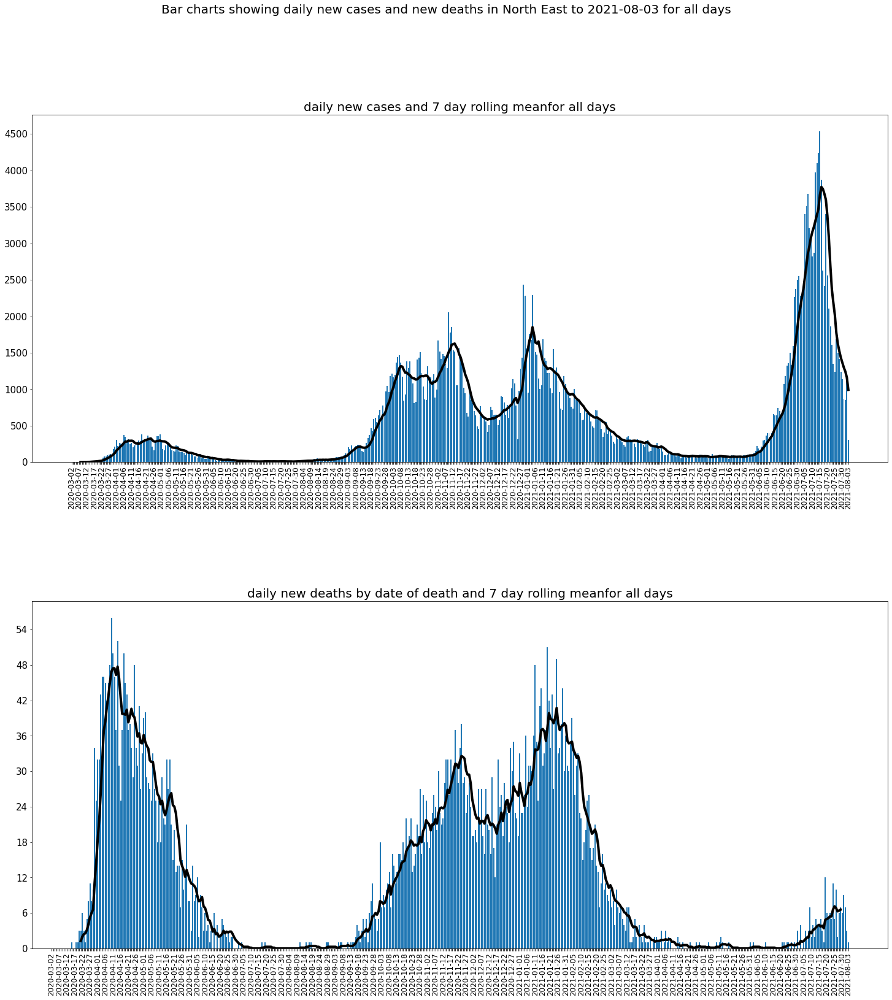

In [147]:
return1, return2, return3 = regional_charts(df_NE, col_names, chart_titles, 'North East',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

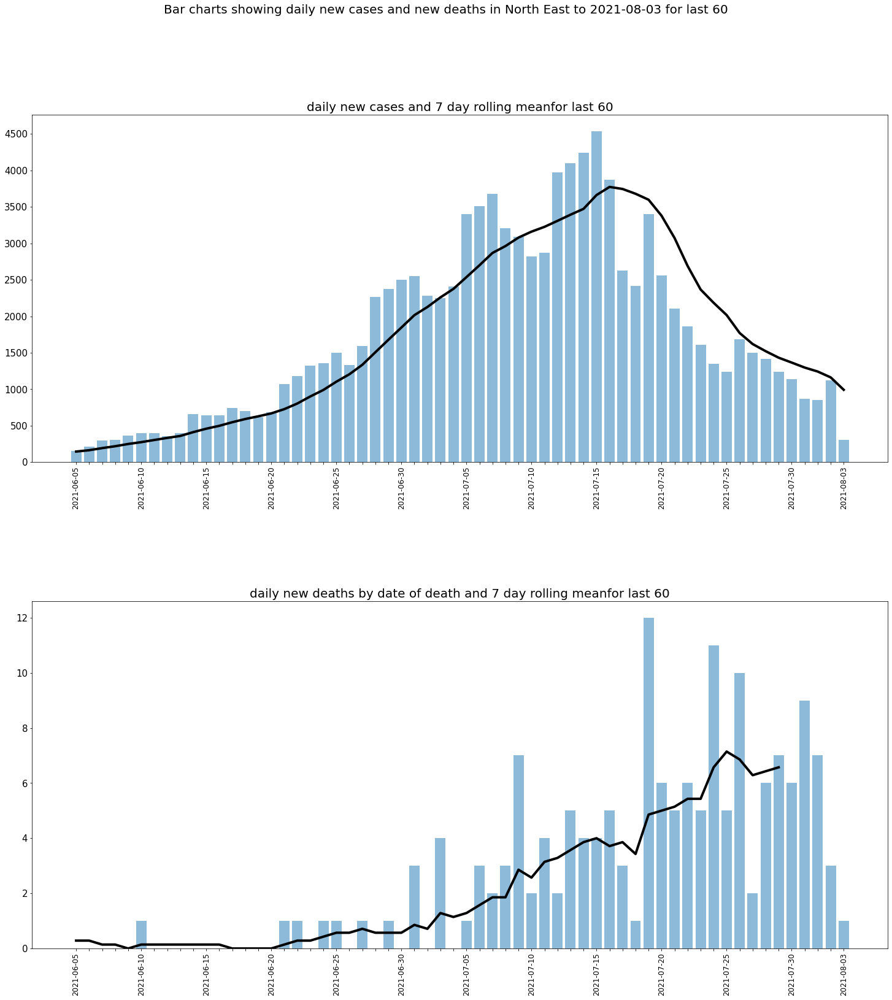

In [148]:
return1, return2, return3 = regional_charts(df_NE, col_names, chart_titles, 'North East',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

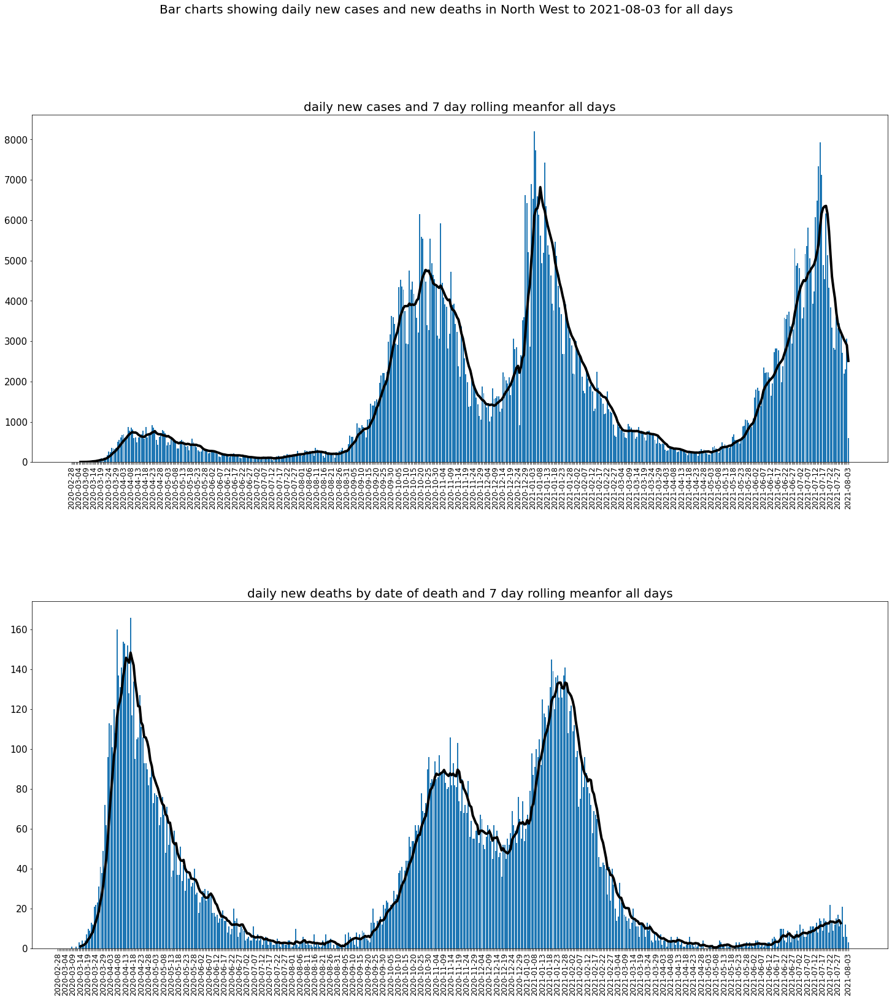

In [149]:
return1, return2, return3 = regional_charts(df_NW, col_names, chart_titles, 'North West',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

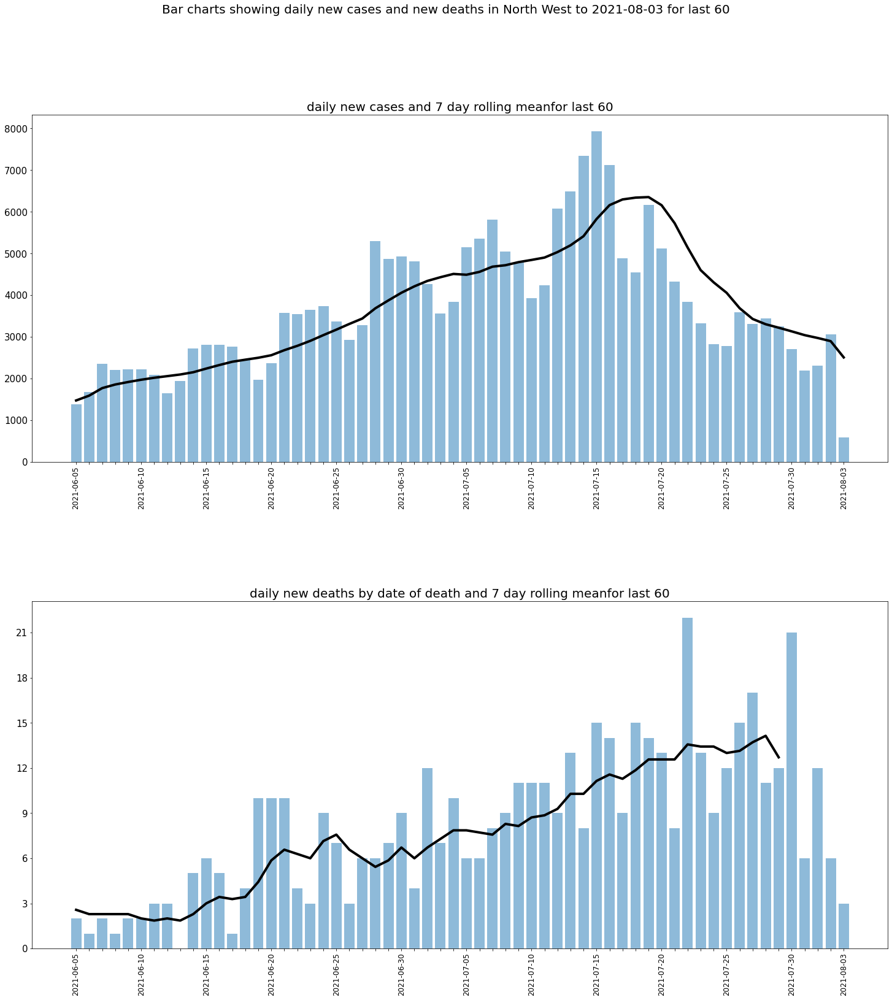

In [150]:
return1, return2, return3 = regional_charts(df_NW, col_names, chart_titles, 'North West',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

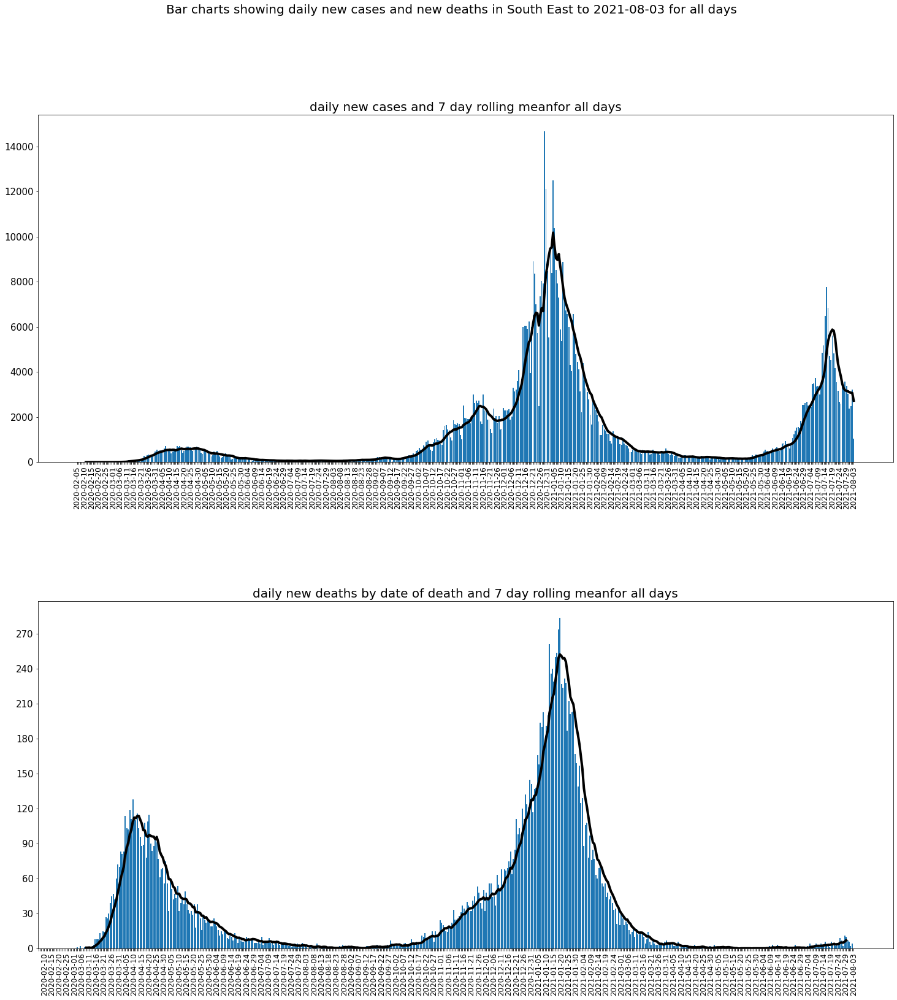

In [151]:
return1, return2, return3 = regional_charts(df_SE, col_names, chart_titles, 'South East',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

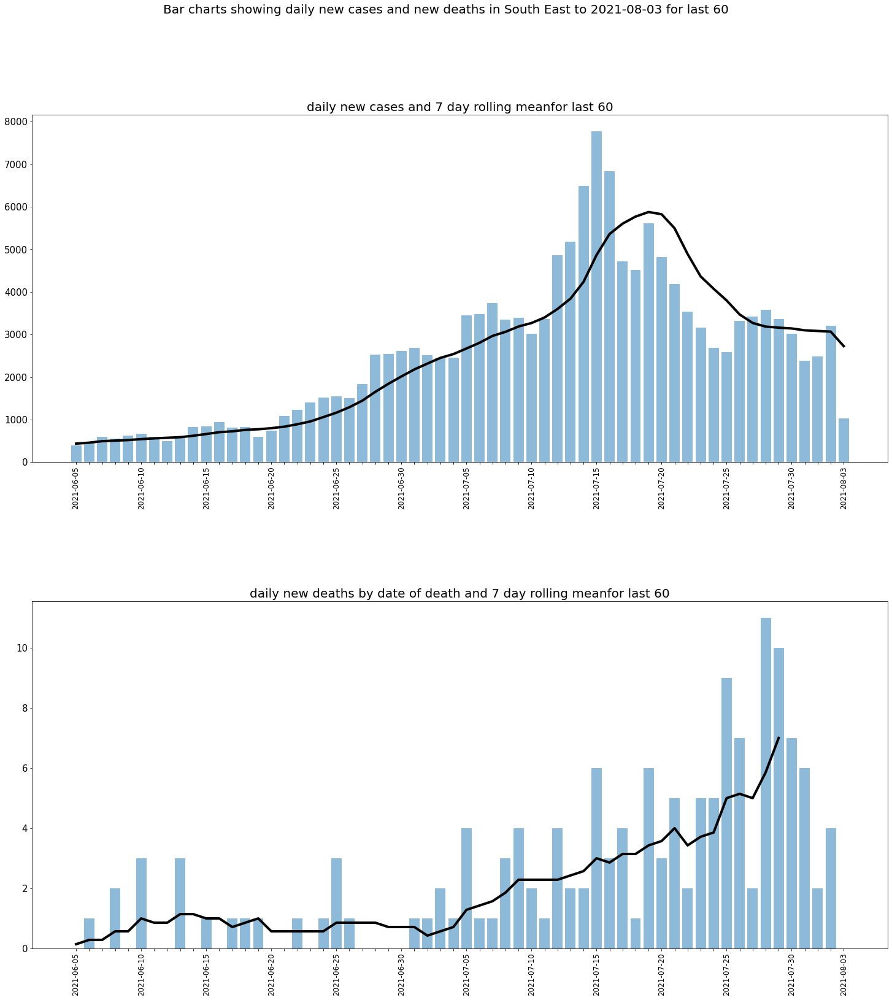

In [152]:
return1, return2, return3 = regional_charts(df_SE, col_names, chart_titles, 'South East',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

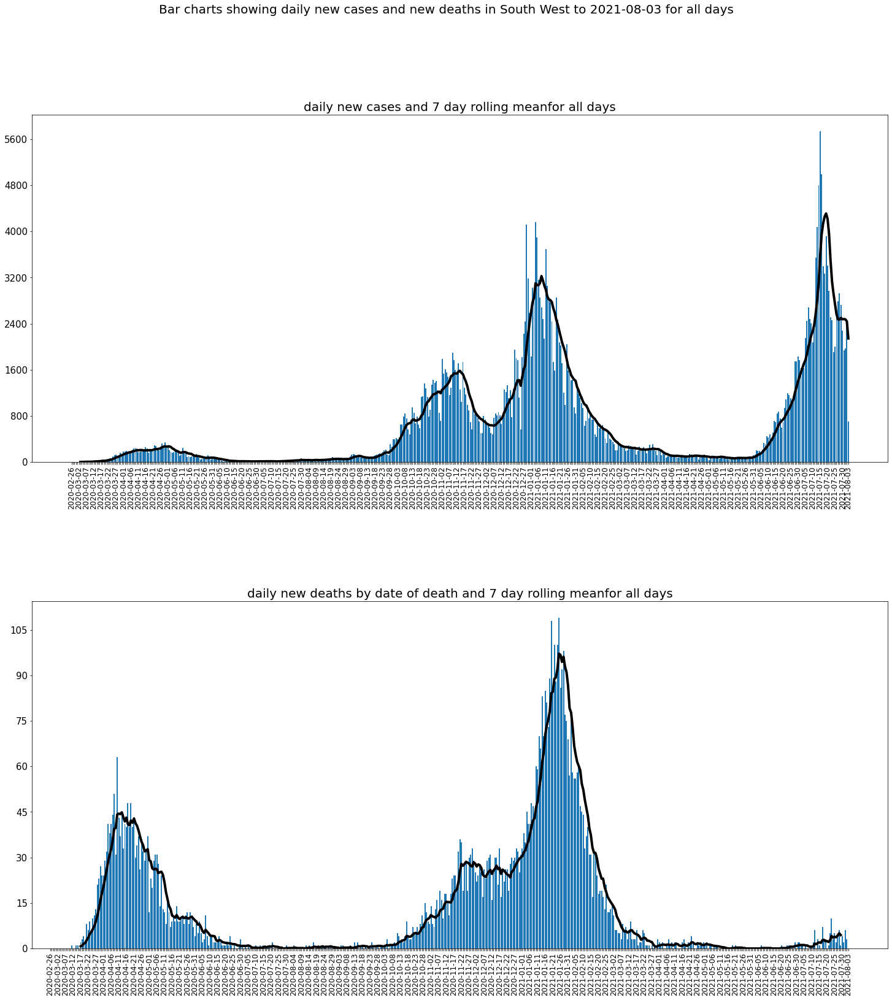

In [153]:
return1, return2, return3 = regional_charts(df_SW, col_names, chart_titles, 'South West',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

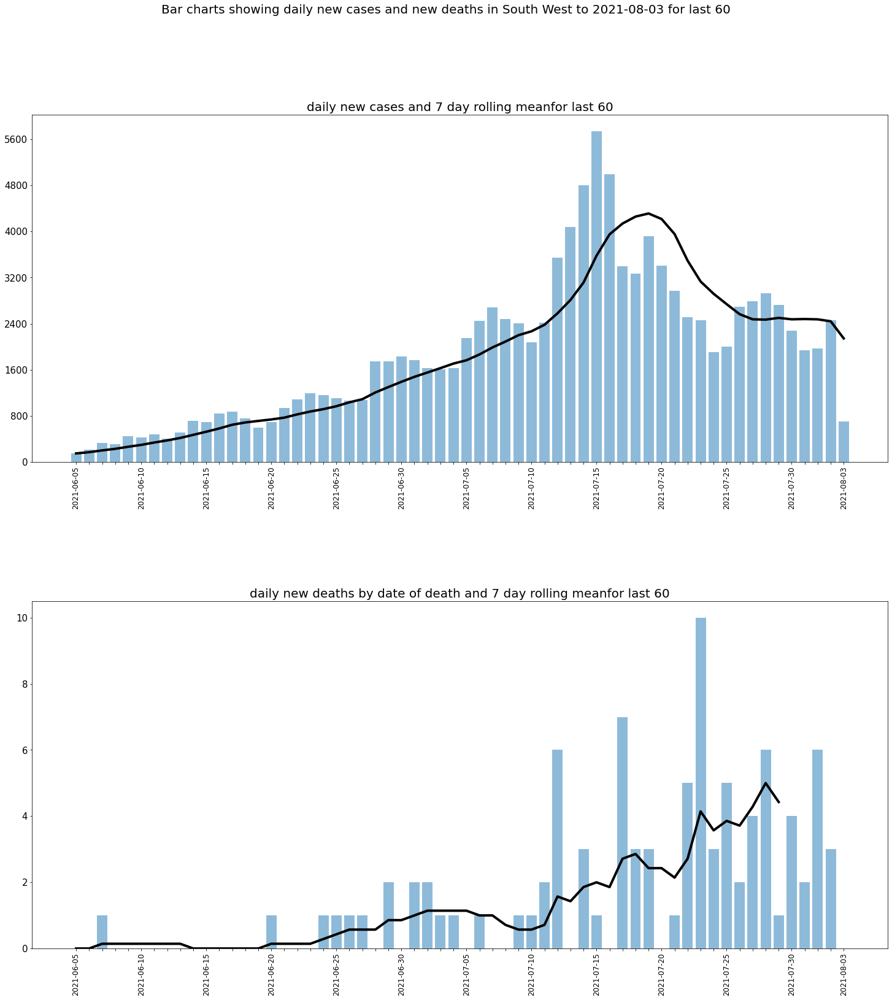

In [154]:
return1, return2, return3 = regional_charts(df_SW, col_names, chart_titles, 'South West',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

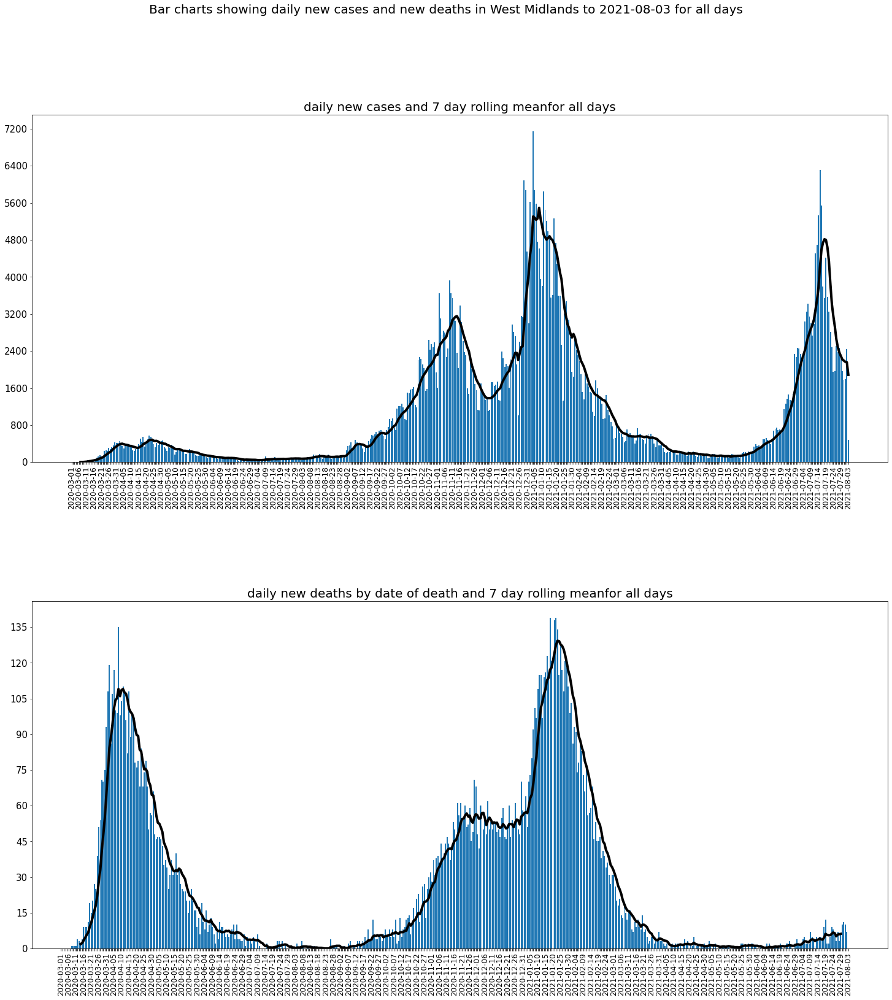

In [155]:
return1, return2, return3 = regional_charts(df_WM, col_names, chart_titles, 'West Midlands',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

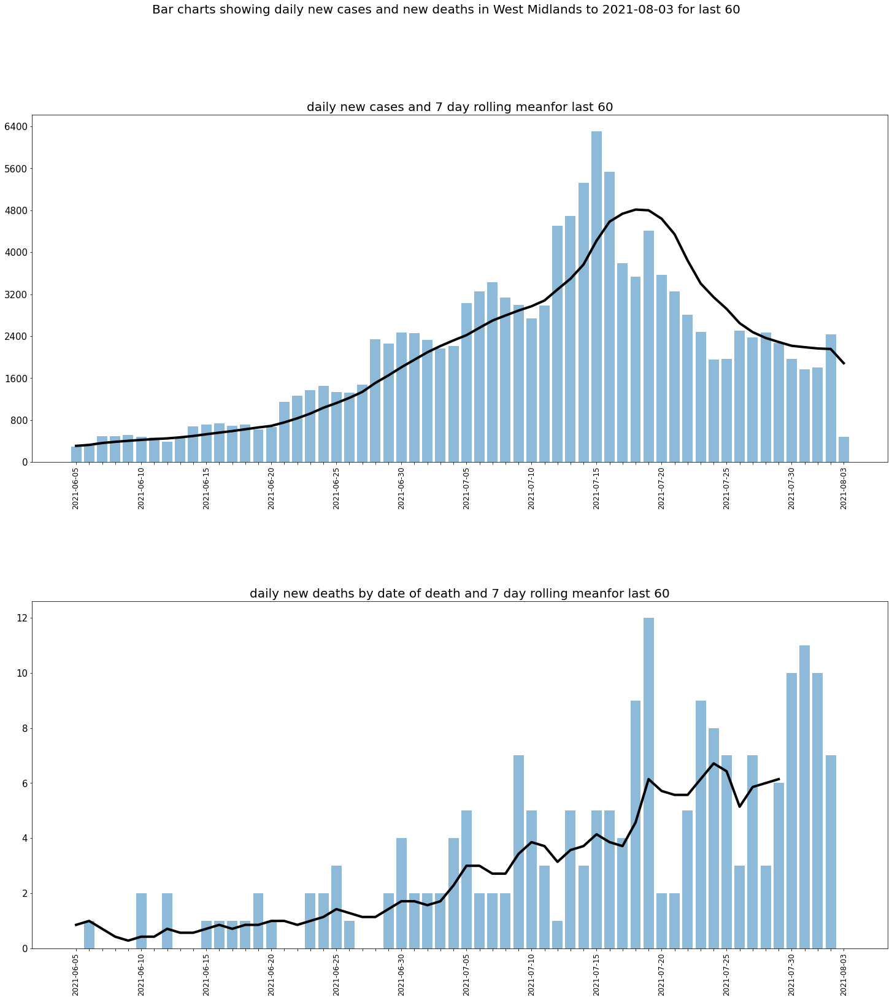

In [156]:
return1, return2, return3 = regional_charts(df_WM, col_names, chart_titles, 'West Midlands',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

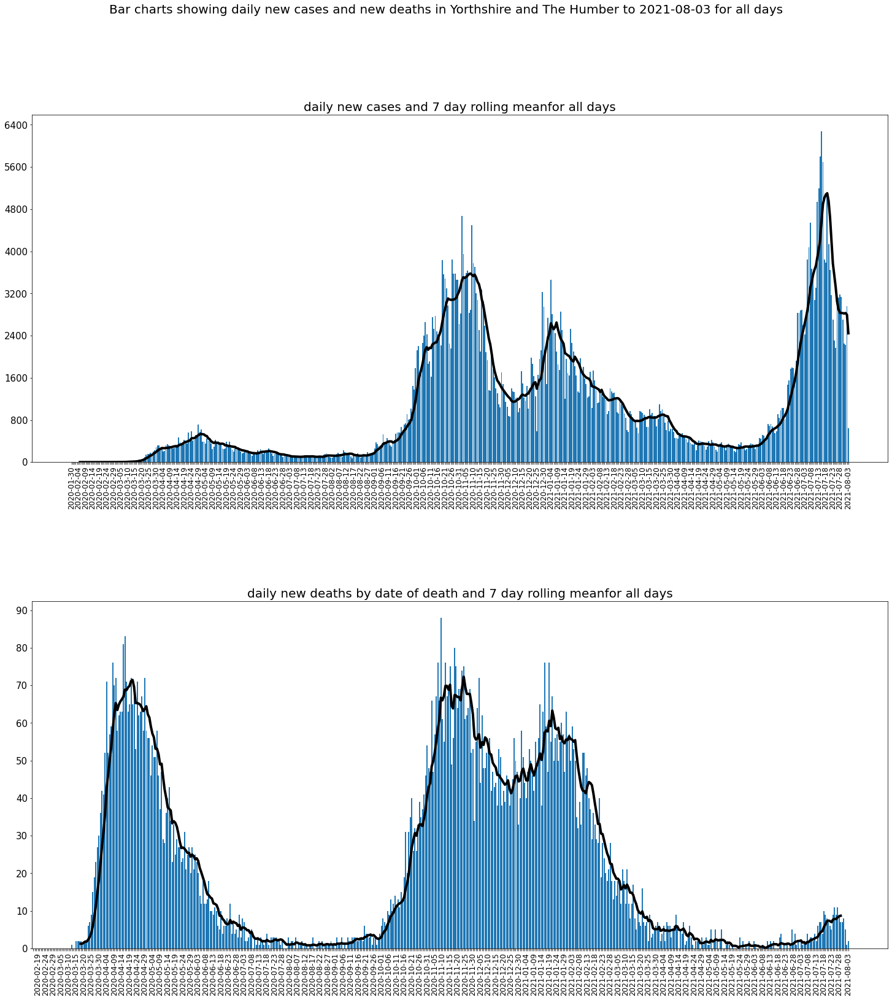

In [157]:
return1, return2, return3 = regional_charts(df_YH, col_names, chart_titles, 'Yorthshire and The Humber',0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

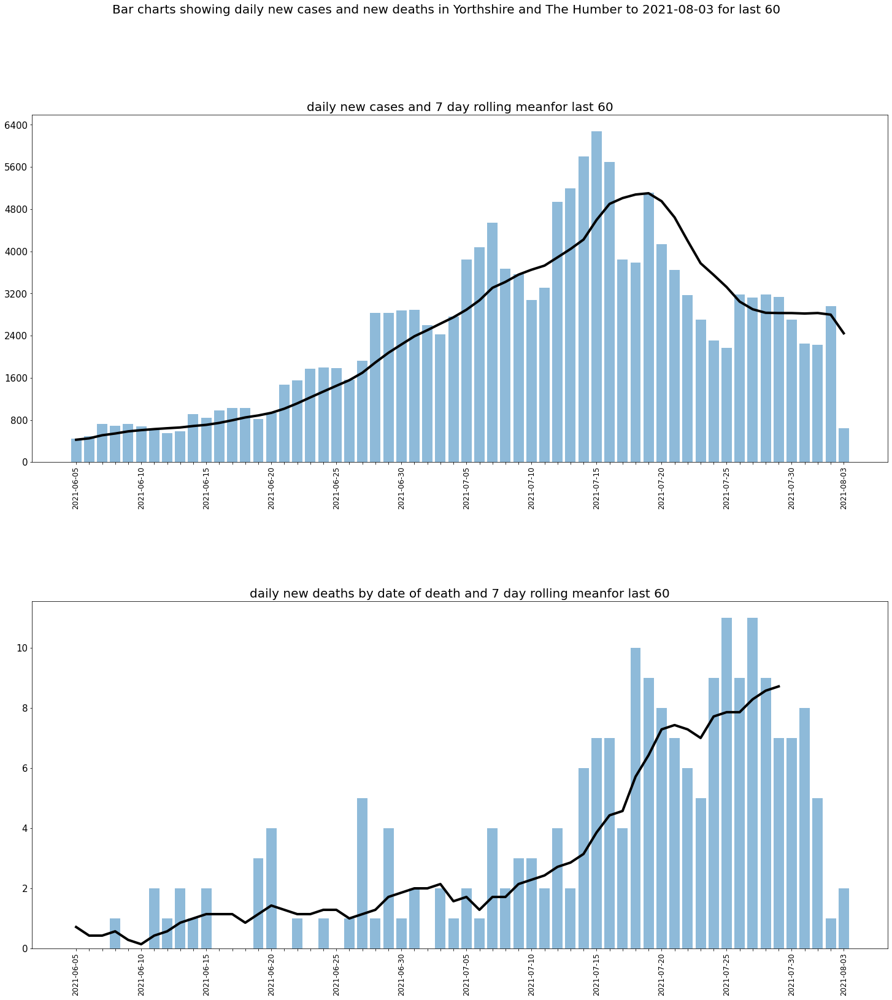

In [158]:
return1, return2, return3 = regional_charts(df_YH, col_names, chart_titles, 'Yorthshire and The Humber',60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [159]:
# for the presentation, insert a new chapter slide

if savePNG == 1 or PwrptPrep == 1:
    #plt.savefig('Auto Trader - bar chart of Lookers cars on site.png', bbox_inches = 'tight')
    
    slideTitle.append('Section 5: Data for the Bolton by Age (most upto date age related death data i can find): Cases, Hospitalisations and Deaths')
    slideText.append('')
    imagePath.append('')

plt.show()

In [160]:
# bolton data
# using bolton data given no other nation data for hospital admissions by age

# create new dataframes for deaths and cases


In [161]:
df_bolton_newcasesbyage = df_bolton_c


In [162]:
df_bolton_newcasesbyage.tail()

,areaCode,areaName,areaType,date,age,cases,rollingSum,rollingRate
11369,E08000001,Bolton,utla,2021-07-30,85_89,1,1,26.8
11370,E08000001,Bolton,utla,2021-07-30,90+,0,0,0.0
11371,E08000001,Bolton,utla,2021-07-30,unassigned,0,0,NaN
11372,E08000001,Bolton,utla,2021-07-30,50_54,2,24,119.6
11373,E08000001,Bolton,utla,2021-07-30,00_04,1,9,47.0


In [163]:
# clean the dateframes

# delete duplicate rows
df_bolton_newcasesbyage.drop_duplicates(inplace=True)
df_bolton_newcasesbyage.reset_index(drop=True)

,areaCode,areaName,areaType,date,age,cases,rollingSum,rollingRate
0,E08000001,Bolton,utla,2020-03-01,unassigned,0,0,NaN
1,E08000001,Bolton,utla,2020-03-01,00_04,0,0,0.0
2,E08000001,Bolton,utla,2020-03-01,00_59,1,0,0.0
3,E08000001,Bolton,utla,2020-03-01,05_09,0,0,0.0
4,E08000001,Bolton,utla,2020-03-01,10_14,0,0,0.0
...,...,...,...,...,...,...,...,...
11369,E08000001,Bolton,utla,2021-07-30,85_89,1,1,26.8
11370,E08000001,Bolton,utla,2021-07-30,90+,0,0,0.0
11371,E08000001,Bolton,utla,2021-07-30,unassigned,0,0,NaN
11372,E08000001,Bolton,utla,2021-07-30,50_54,2,24,119.6


In [164]:
# delete unwanted columns

df_bolton_newcasesbyage = df_bolton_newcasesbyage[['date', 'age', 'cases']]

In [165]:
df_bolton_newcasesbyage.tail()

,date,age,cases
11369,2021-07-30,85_89,1
11370,2021-07-30,90+,0
11371,2021-07-30,unassigned,0
11372,2021-07-30,50_54,2
11373,2021-07-30,00_04,1


In [166]:
df_bolton_newcasesbyage_Summary = dataframe_ageHeaders(df_bolton_newcasesbyage,'cases')

In [167]:
df_bolton_newcasesbyage_Summary.tail()

,date,unassigned,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,40_44,90+,50_54,85_89,80_84,75_79,70_74,45_49,60_64,60+,55_59,65_69
512,2021-07-26,0,2,83,10,10,9,11,6,8,5,7,0,9,0,0,1,1,3,3,7,3,2
513,2021-07-27,0,2,90,3,13,9,15,9,9,10,7,0,0,0,1,2,3,7,5,13,6,2
514,2021-07-28,0,2,82,6,10,7,9,11,12,7,9,0,2,0,1,3,5,6,3,13,1,1
515,2021-07-29,0,0,66,2,12,11,11,6,5,5,7,0,1,0,1,0,2,2,2,10,4,5
516,2021-07-30,0,1,54,2,3,4,5,7,10,8,3,0,2,1,0,2,1,6,4,9,3,1


In [168]:
# create new columns in the other two dataframes to match the admissions ages

In [169]:
def create_new_columns(df, newcol,name):

    df[name] = 0

    for i in range(len(newcol)):
        df[name] = df[name] + df[newcol[i]]


In [170]:
nursery = ['00_04']
school = ['15_19','10_14','05_09']
working = ['60_64', '55_59', '50_54','45_49','40_44','35_39','30_34','25_29','20_24']
old = ['80_84','75_79','70_74','65_69']
older = ['90+','85_89']

In [171]:
create_new_columns(df_bolton_newcasesbyage_Summary,nursery,'00_04_')
create_new_columns(df_bolton_newcasesbyage_Summary,school,'05_19_')
create_new_columns(df_bolton_newcasesbyage_Summary,working,'20_64_')
create_new_columns(df_bolton_newcasesbyage_Summary,old,'65_84_')
create_new_columns(df_bolton_newcasesbyage_Summary,older,'85+_')

In [172]:
# add rolling mean 7 day columns

columns1 = ['00_04_','05_19_','20_64_','65_84_','85+_']
columns2 = ['0_to_5_new','6_to_17_new','18_to_64_new',
            '65_to_84_new','85+_new']

for i in range(len(columns1)):
    df_bolton_newcasesbyage_Summary[columns1[i] + 'rolling7'] = df_bolton_newcasesbyage_Summary[columns1[i]].rolling(7).mean()
    #df_bolton_cumdeathsbyage_Summary[columns1[i] + 'rolling7'] = df_bolton_cumdeathsbyage_Summary[columns1[i]].rolling(7).mean()

# for i in range(len(columns2)):
#     df_bolton_cumadmissionsbyage_Summary[columns2[i] + 'rolling7'] = df_bolton_cumadmissionsbyage_Summary[columns2[i]].rolling(7).mean()


In [173]:
# add cumulative columns

columns1 = ['00_04_','05_19_','20_64_','65_84_','85+_']
columns2 = ['0_to_5_new','6_to_17_new','18_to_64_new',
            '65_to_84_new','85+_new']

for i in range(len(columns1)):
    df_bolton_newcasesbyage_Summary[columns1[i] + 'cumsum'] = df_bolton_newcasesbyage_Summary[columns1[i]].cumsum()


In [174]:
df_bolton_newcasesbyage_Summary.head()

,date,unassigned,00_04,00_59,05_09,10_14,15_19,20_24,25_29,30_34,35_39,40_44,90+,50_54,85_89,80_84,75_79,70_74,45_49,60_64,60+,55_59,65_69,00_04_,05_19_,20_64_,65_84_,85+_,00_04_rolling7,05_19_rolling7,20_64_rolling7,65_84_rolling7,85+_rolling7,00_04_cumsum,05_19_cumsum,20_64_cumsum,65_84_cumsum,85+_cumsum
0,2020-03-01,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0
1,2020-03-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0
2,2020-03-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0
3,2020-03-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0
4,2020-03-05,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,NaN,NaN,NaN,NaN,NaN,0,0,2,0,0


In [175]:
columns = ['00_04_rolling7','05_19_rolling7','20_64_rolling7',
           '65_84_rolling7','85+_rolling7']
chart_titles = ['00_04','05_19','20_64','65_84','85+']
#first_date = df_bolton_newcasesbyage_Summary['date'].iloc[0]
last_date = df_bolton_newcasesbyage_Summary['date'].iloc[-1]

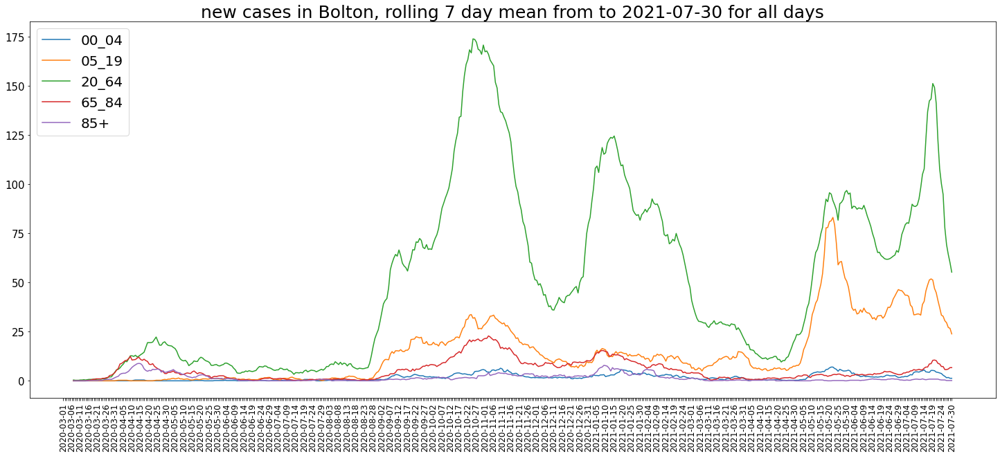

In [176]:
return1, return2, return3 = multiple_line_charts(df_bolton_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in Bolton, rolling 7 day mean from to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

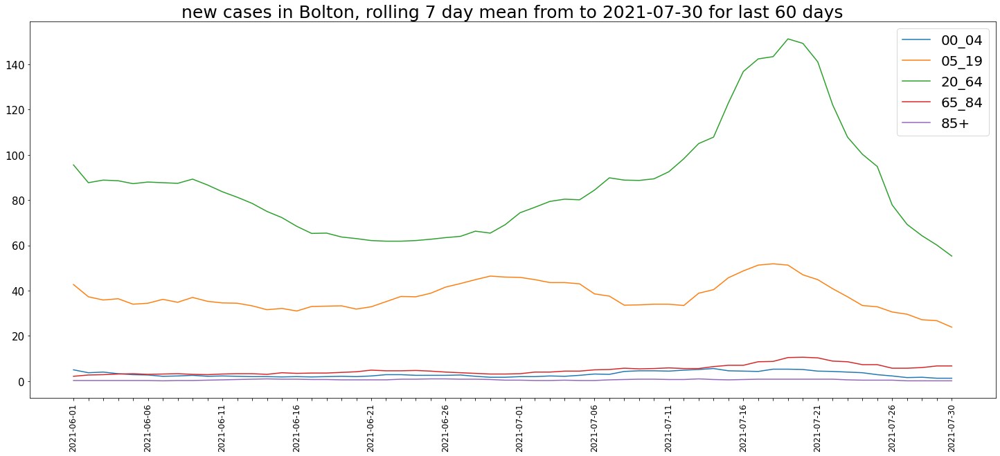

In [177]:
return1, return2, return3 = multiple_line_charts(df_bolton_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in Bolton, rolling 7 day mean from to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [178]:
columns = ['00_04_rolling7','05_19_rolling7',
           '65_84_rolling7','85+_rolling7']
chart_titles = ['00_04','05_19','65_84','85+']
first_date = df_bolton_newcasesbyage_Summary['date'].iloc[0]
last_date = df_bolton_newcasesbyage_Summary['date'].iloc[-1]

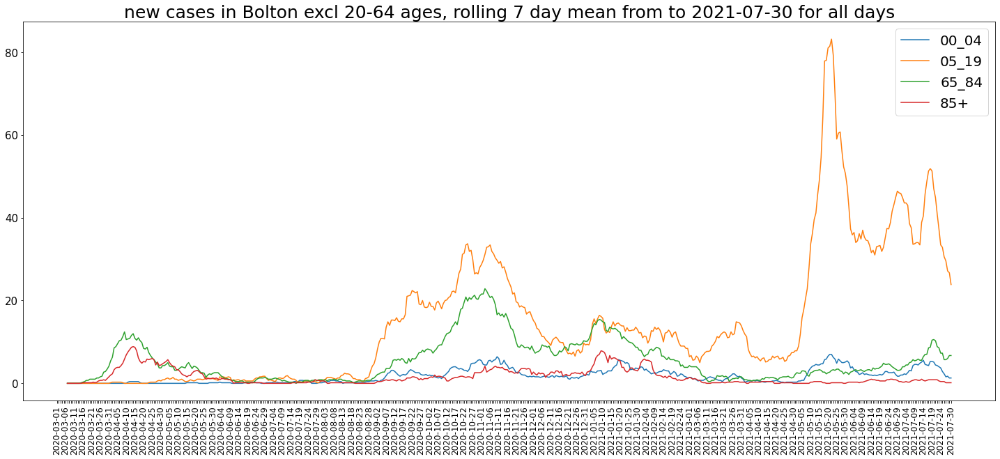

In [179]:
return1, return2, return3 = multiple_line_charts(df_bolton_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in Bolton excl 20-64 ages, rolling 7 day mean from to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

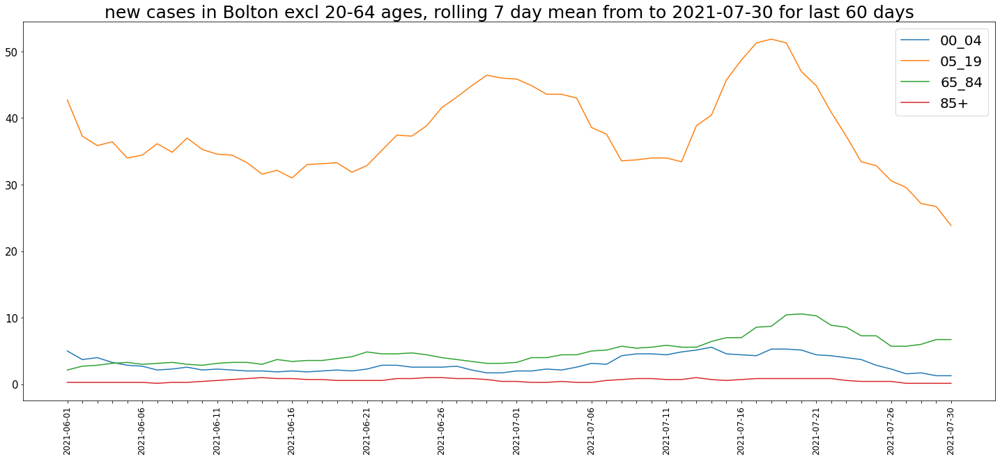

In [180]:
return1, return2, return3 = multiple_line_charts(df_bolton_newcasesbyage_Summary, columns, chart_titles, 
                                                 'new cases in Bolton excl 20-64 ages, rolling 7 day mean from to ' + str(last_date),
                                                60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [181]:
df_bolton_hospital_a['newAdmissions_rolling'] = df_bolton_hospital_a['newAdmissions'].rolling(7).mean()

In [182]:
df_bolton_hospital_a.tail()

,areaCode,areaName,areaType,date,newAdmissions,newAdmissions_rolling
489,RMC,Bolton NHS Foundation Trust,nhsTrust,2021-07-21,5,6.857143
490,RMC,Bolton NHS Foundation Trust,nhsTrust,2021-07-22,4,6.000000
491,RMC,Bolton NHS Foundation Trust,nhsTrust,2021-07-23,6,6.000000
492,RMC,Bolton NHS Foundation Trust,nhsTrust,2021-07-24,5,5.857143
493,RMC,Bolton NHS Foundation Trust,nhsTrust,2021-07-25,5,5.571429


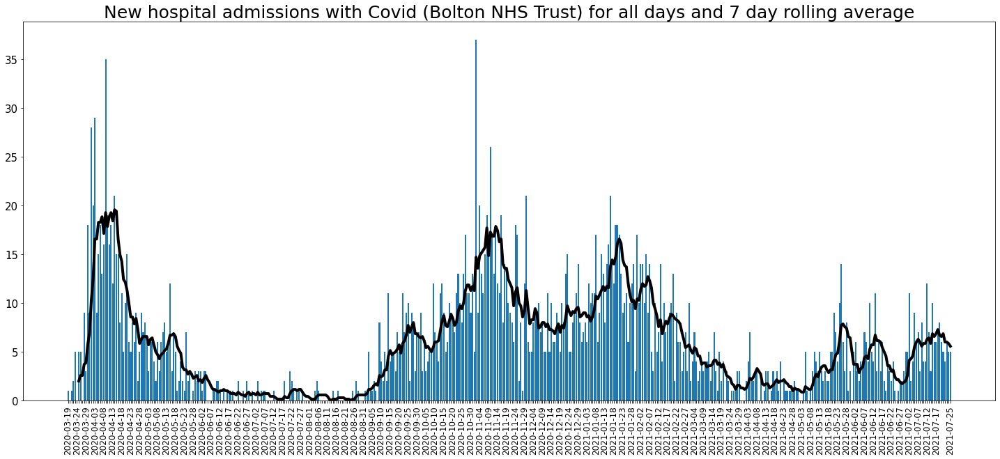

In [183]:
return1, return2, return3 = one_chart(df_bolton_hospital_a, 'newAdmissions', 
                                      'New hospital admissions with Covid (Bolton NHS Trust)',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

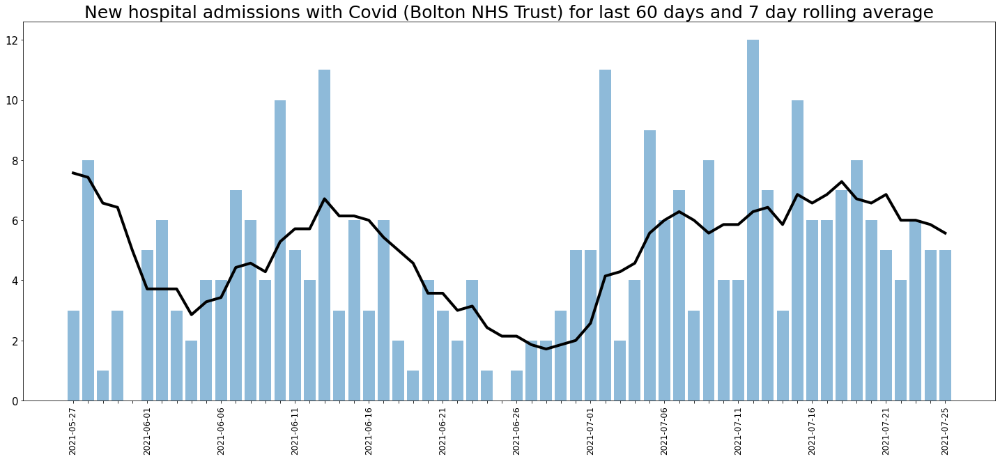

In [184]:
return1, return2, return3 = one_chart(df_bolton_hospital_a, 'newAdmissions', 
                                      'New hospital admissions with Covid (Bolton NHS Trust)',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [185]:
df_bolton_deaths['newDeaths28DaysByDeathDate_rolling'] = df_bolton_deaths['newDeaths28DaysByDeathDate'].rolling(7).mean()

In [186]:
df_bolton_deaths.tail()

,areaCode,areaName,areaType,date,newDeaths28DaysByDeathDate,newDeaths28DaysByDeathDate_rolling
497,E08000001,Bolton,utla,2021-07-30,1,0.857143
498,E08000001,Bolton,utla,2021-07-31,0,0.857143
499,E08000001,Bolton,utla,2021-08-01,2,1.000000
500,E08000001,Bolton,utla,2021-08-02,1,1.000000
501,E08000001,Bolton,utla,2021-08-03,0,1.000000


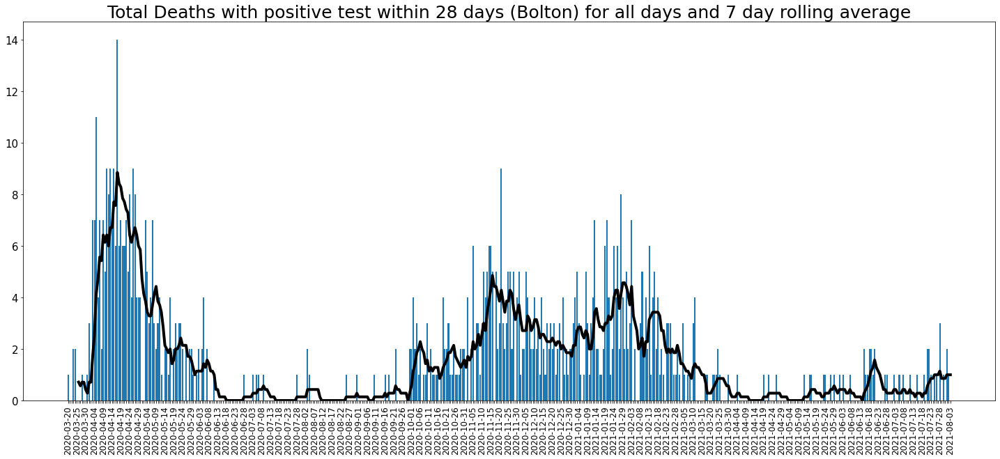

In [187]:
return1, return2, return3 = one_chart(df_bolton_deaths, 'newDeaths28DaysByDeathDate', 
                                      'Total Deaths with positive test within 28 days (Bolton)',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

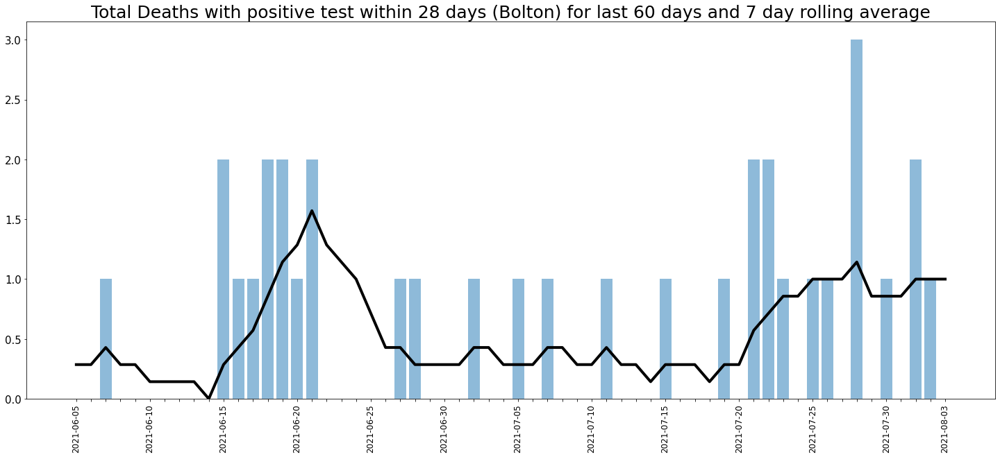

In [188]:
return1, return2, return3 = one_chart(df_bolton_deaths, 'newDeaths28DaysByDeathDate', 
                                      'Total Deaths with positive test within 28 days (Bolton)',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [189]:
# for the presentation, insert a new chapter slide

if savePNG == 1 or PwrptPrep == 1:
    
    slideTitle.append('Section 6: The most upto date daily data for Scotland: Tests, Cases, Hospitalisations, Deaths; all data and last 60 day)')
    slideText.append('')
    imagePath.append('')

plt.show()

In [190]:
df_summary_scot.head()

,areaCode_x,areaName_x,areaType_x,date,cumCasesBySpecimenDate,newCasesBySpecimenDate,areaCode_y,areaName_y,areaType_y,cumDeaths28DaysByDeathDate,newDeaths28DaysByDeathDate,areaCode_x,areaName_x,areaType_x,cumAdmissions,newAdmissions,areaCode_y,areaName_y,areaType_y,hospitalCases,areaCode_x,areaName_x,areaType_x,covidOccupiedMVBeds,areaCode_y,areaName_y,areaType_y,cumVirusTests,newVirusTests
0,S92000003,Scotland,nation,2020-02-28,2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,S92000003,Scotland,nation,2020-02-29,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,S92000003,Scotland,nation,2020-03-01,4,2,NaN,NaN,NaN,NaN,NaN,S92000003,Scotland,nation,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,S92000003,Scotland,nation,2020-03-02,5,1,NaN,NaN,NaN,NaN,NaN,S92000003,Scotland,nation,16.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,S92000003,Scotland,nation,2020-03-03,8,3,NaN,NaN,NaN,NaN,NaN,S92000003,Scotland,nation,29.0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [191]:
df_summary_scot.tail()

,areaCode_x,areaName_x,areaType_x,date,cumCasesBySpecimenDate,newCasesBySpecimenDate,areaCode_y,areaName_y,areaType_y,cumDeaths28DaysByDeathDate,newDeaths28DaysByDeathDate,areaCode_x,areaName_x,areaType_x,cumAdmissions,newAdmissions,areaCode_y,areaName_y,areaType_y,hospitalCases,areaCode_x,areaName_x,areaType_x,covidOccupiedMVBeds,areaCode_y,areaName_y,areaType_y,cumVirusTests,newVirusTests
518,S92000003,Scotland,nation,2021-07-30,346272,1029,S92000003,Scotland,nation,7956.0,3.0,S92000003,Scotland,nation,28607.0,44.0,S92000003,Scotland,nation,462.0,S92000003,Scotland,nation,60.0,S92000003,Scotland,nation,8042708.0,22725.0
519,S92000003,Scotland,nation,2021-07-31,347037,765,S92000003,Scotland,nation,7962.0,6.0,S92000003,Scotland,nation,28637.0,30.0,S92000003,Scotland,nation,444.0,S92000003,Scotland,nation,64.0,S92000003,Scotland,nation,8063754.0,21046.0
520,S92000003,Scotland,nation,2021-08-01,347896,859,S92000003,Scotland,nation,7964.0,2.0,NaN,NaN,NaN,NaN,NaN,S92000003,Scotland,nation,422.0,S92000003,Scotland,nation,62.0,S92000003,Scotland,nation,8077561.0,13807.0
521,S92000003,Scotland,nation,2021-08-02,349147,1251,S92000003,Scotland,nation,7965.0,1.0,NaN,NaN,NaN,NaN,NaN,S92000003,Scotland,nation,407.0,S92000003,Scotland,nation,60.0,S92000003,Scotland,nation,8091265.0,13704.0
522,S92000003,Scotland,nation,2021-08-03,349286,139,S92000003,Scotland,nation,7965.0,0.0,NaN,NaN,NaN,NaN,NaN,S92000003,Scotland,nation,406.0,S92000003,Scotland,nation,61.0,S92000003,Scotland,nation,8120522.0,29257.0


In [192]:
# clean up the summary dataframe, only keeping the needed columns

cols_keep = ['date','newCasesBySpecimenDate','cumCasesBySpecimenDate','newDeaths28DaysByDeathDate',
             'cumDeaths28DaysByDeathDate','newAdmissions','cumAdmissions','hospitalCases','covidOccupiedMVBeds',
            'newVirusTests','cumVirusTests']

In [193]:
df_summary_scot=df_summary_scot[cols_keep]

In [194]:
df_summary_scot.tail(10)

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests
513,2021-07-25,941,340068,4.0,7927.0,44.0,28356.0,480.0,64.0,13635.0,7915189.0
514,2021-07-26,1371,341439,7.0,7934.0,49.0,28405.0,475.0,65.0,20594.0,7935783.0
515,2021-07-27,1349,342788,7.0,7941.0,55.0,28460.0,472.0,63.0,28258.0,7960314.0
516,2021-07-28,1285,344073,7.0,7948.0,64.0,28524.0,474.0,63.0,33679.0,7993993.0
517,2021-07-29,1170,345243,5.0,7953.0,39.0,28563.0,490.0,60.0,25990.0,8019983.0
518,2021-07-30,1029,346272,3.0,7956.0,44.0,28607.0,462.0,60.0,22725.0,8042708.0
519,2021-07-31,765,347037,6.0,7962.0,30.0,28637.0,444.0,64.0,21046.0,8063754.0
520,2021-08-01,859,347896,2.0,7964.0,NaN,NaN,422.0,62.0,13807.0,8077561.0
521,2021-08-02,1251,349147,1.0,7965.0,NaN,NaN,407.0,60.0,13704.0,8091265.0
522,2021-08-03,139,349286,0.0,7965.0,NaN,NaN,406.0,61.0,29257.0,8120522.0


In [195]:
# add new columns
# rolling periods are 7 days

df_summary_scot['%_on_ventilation'] = df_summary_scot['covidOccupiedMVBeds'] / df_summary_scot['hospitalCases']
df_summary_scot['%_positive_tests'] = (df_summary_scot['newCasesBySpecimenDate'].rolling(7).mean() 
                                  / df_summary_scot['newVirusTests'].rolling(7).mean())

In [196]:
# leaving hospital
# this is derived from government data
# leavers = start of day patients in hospital + admissions - deaths - end of day

leaving_hospital_scot = []

in_hospital_start_scot = [0] + df_summary_scot['hospitalCases'][:-1].tolist()
in_hospital_end_scot = df_summary_scot['hospitalCases'].tolist()
new_in_hospital_scot = df_summary_scot['newAdmissions'].tolist()
new_deaths_scot = df_summary_scot['newDeaths28DaysByDeathDate'].tolist()

for i in range(len(in_hospital_start_scot)):
    leaving_hospital_scot.append(in_hospital_start_scot[i] + new_in_hospital_scot[i] 
                                 - new_deaths_scot[i] - in_hospital_end_scot[i])
    
df_summary_scot['leaving_hospital'] = leaving_hospital_scot

In [197]:
# adding more new columns
# looking at hospital leaves as a % of admissions
# looking at new admissions as a % of those already in hospital
# looking at leavers as a % of those already in hospital
# looking at those dying as a % of those on a ventilator

df_summary_scot['leavers_%_admissions'] = (df_summary_scot['leaving_hospital'].rolling(7).mean() 
                                      / df_summary_scot['newAdmissions'].rolling(7).mean())

df_summary_scot['newAdmissions%_inHospital'] = (df_summary_scot['newAdmissions'].rolling(7).mean() 
                                      / df_summary_scot['hospitalCases'].rolling(7).mean())
df_summary_scot['leavers_%_inHospital'] = (df_summary_scot['leaving_hospital'].rolling(7).mean() 
                                      / df_summary_scot['hospitalCases'].rolling(7).mean())

df_summary_scot['deaths_%_vent'] = (df_summary_scot['newDeaths28DaysByDeathDate'].rolling(7).mean() 
                                      / df_summary_scot['covidOccupiedMVBeds'].rolling(7).mean())

In [198]:
# add rolling average columns, 7 day rolling

df_summary_scot['newVirusTests_rolling'] = df_summary_scot['newVirusTests'].rolling(7).mean()
df_summary_scot['newCasesBySpecimenDate_rolling'] = df_summary_scot['newCasesBySpecimenDate'].rolling(7).mean()
df_summary_scot['newAdmissions_rolling'] = df_summary_scot['newAdmissions'].rolling(7).mean()
df_summary_scot['leaving_hospital_rolling'] = df_summary_scot['leaving_hospital'].rolling(7).mean()
df_summary_scot['newDeaths28DaysByDeathDate_rolling'] = df_summary_scot['newDeaths28DaysByDeathDate'].rolling(7).mean()


In [199]:
# add new cases per 100,000
# so need a new column with rolling 7 day count of new cases
# and add 7 nday rolling column
# use Scotland population of 5,454,000

population_scot = 5454000

df_summary_scot['newCasesBySpecimenDate_rolling_sum'] = df_summary_scot['newCasesBySpecimenDate'].rolling(7).sum()
df_summary_scot['newCasesBySpecimenDate_caseRate'] = df_summary_scot['newCasesBySpecimenDate_rolling_sum']*100000/population_scot
df_summary_scot['newCasesBySpecimenDate_caseRate_rolling'] = df_summary_scot['newCasesBySpecimenDate_caseRate'].rolling(7).mean()


In [200]:
# for deaths, take the last 5 days out
# also for the case rate
# the last 5 days of the deaths and cases data tends to be incomplete

df_summary_scot['newDeaths28DaysByDeathDate_rolling'][-5:] = np.NaN
df_summary_scot['newCasesBySpecimenDate_caseRate_rolling'][-5:] = np.NaN


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [201]:
df_summary_scot.tail(10)

,date,newCasesBySpecimenDate,cumCasesBySpecimenDate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,newAdmissions,cumAdmissions,hospitalCases,covidOccupiedMVBeds,newVirusTests,cumVirusTests,%_on_ventilation,%_positive_tests,leaving_hospital,leavers_%_admissions,newAdmissions%_inHospital,leavers_%_inHospital,deaths_%_vent,newVirusTests_rolling,newCasesBySpecimenDate_rolling,newAdmissions_rolling,leaving_hospital_rolling,newDeaths28DaysByDeathDate_rolling,newCasesBySpecimenDate_rolling_sum,newCasesBySpecimenDate_caseRate,newCasesBySpecimenDate_caseRate_rolling
513,2021-07-25,941,340068,4.0,7927.0,44.0,28356.0,480.0,64.0,13635.0,7915189.0,0.133333,0.058264,39.0,0.977667,0.113745,0.111205,0.112565,23611.714286,1375.714286,57.571429,56.285714,6.142857,9630.0,176.567657,204.442349
514,2021-07-26,1371,341439,7.0,7934.0,49.0,28405.0,475.0,65.0,20594.0,7935783.0,0.136842,0.054513,47.0,1.050398,0.108271,0.113728,0.104478,23829.000000,1299.000000,53.857143,56.571429,6.000000,9093.0,166.721672,194.067264
515,2021-07-27,1349,342788,7.0,7941.0,55.0,28460.0,472.0,63.0,28258.0,7960314.0,0.133475,0.054059,51.0,1.037333,0.109489,0.113577,0.102871,23371.285714,1263.428571,53.571429,55.571429,6.142857,8844.0,162.156216,185.253287
516,2021-07-28,1285,344073,7.0,7948.0,64.0,28524.0,474.0,63.0,33679.0,7993993.0,0.132911,0.052165,55.0,1.035616,0.108309,0.112166,0.097674,23428.285714,1222.142857,52.142857,54.000000,6.000000,8555.0,156.857352,177.342972
517,2021-07-29,1170,345243,5.0,7953.0,39.0,28563.0,490.0,60.0,25990.0,8019983.0,0.122449,0.050837,18.0,0.881844,0.102906,0.090747,0.090278,23456.142857,1192.428571,49.571429,43.714286,5.571429,8347.0,153.043638,170.420137
518,2021-07-30,1029,346272,3.0,7956.0,44.0,28607.0,462.0,60.0,22725.0,8042708.0,0.129870,0.049669,69.0,1.014925,0.100540,0.102041,0.080460,23294.428571,1157.000000,47.857143,48.571429,NaN,8099.0,148.496516,NaN
519,2021-07-31,765,347037,6.0,7962.0,30.0,28637.0,444.0,64.0,21046.0,8063754.0,0.144144,0.047672,42.0,0.987692,0.098574,0.097361,0.088838,23703.857143,1130.000000,46.428571,45.857143,NaN,7910.0,145.031170,NaN
520,2021-08-01,859,347896,2.0,7964.0,NaN,NaN,422.0,62.0,13807.0,8077561.0,0.146919,0.047129,NaN,NaN,NaN,NaN,0.084668,23728.428571,1118.285714,NaN,NaN,NaN,7828.0,143.527686,NaN
521,2021-08-02,1251,349147,1.0,7965.0,NaN,NaN,407.0,60.0,13704.0,8091265.0,0.147420,0.048414,NaN,NaN,NaN,NaN,0.071759,22744.142857,1101.142857,NaN,NaN,NaN,7708.0,141.327466,NaN
522,2021-08-03,139,349286,0.0,7965.0,NaN,NaN,406.0,61.0,29257.0,8120522.0,0.150246,0.040560,NaN,NaN,NaN,NaN,0.055814,22886.857143,928.285714,NaN,NaN,NaN,6498.0,119.141914,NaN


In [202]:
# chart the national data

In [203]:
# def one_chart(df, column, chart_title, bar, percent, rolling, days):
    
#     # bar = bar chart rather than line chart
#     # percent is percent y labels rather than absolute numbers
#     # rolling = print rolling line
#     # days = number of days to plot from the end, 0 = all days

#     fig, ax = plt.subplots(figsize=(25,10))

#     plt.subplots_adjust(hspace=0.6, wspace=0.2)

#     start_date = df['date'].iloc[0]
#     end_date = df['date'].iloc[-1]
    
#     x = df.index.values[-days:]

#     labels = list(df['date'][-days:])
    
#     transparent = 0.5
    
#     days_print = 'for last ' + str(days) + ' days'
#     slideText1 = days_print + ' to ' + str(end_date)
    
#     # if days = 0 then print entire chart   
#     if days == 0:
#         days = len(list(df['date']))
#         days_print = 'for all days'
#         transparent = 1 # set bars for full fill
#         slideText1 = (str(start_date) + ' to ' + str(end_date))
    
#     chart_title = chart_title + ' ' + days_print

#     # prevent x-axis labels from overlapping by printing every nth label
#     for i in range(5,len(labels),5): # label prints at every nth label
#         for ii in range(1,5): # the rest is blanks
#             labels[i-ii] =''

#     # for the final label, ensure there is space to avoid a clash
#     labels[len(labels)-1]=list(df['date'])[-1]
#     labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''

#     y1 = df[column][-days:]
#     if rolling == 1:
#         y2 = df[column + '_rolling'][-days:]
#         chart_title_1 = chart_title + ' and 7 day rolling average'
#     else:
#         chart_title_1 = chart_title

#     ax.set_title(chart_title_1, fontsize=25)
#     ax.set_xticklabels(labels, rotation=90, fontsize=12)
#     ax.set_xticks(x)
    
#     if percent == 1:
#         ax.yaxis.set_major_formatter(ticker.PercentFormatter(1.0, decimals=0))
    
#     ax.yaxis.set_tick_params(labelsize=15)
    
#     if bar == 1:
#         ax.bar(x, y1, alpha = transparent)
#     else:
#         ax.plot(x, y1)
        
#     if rolling == 1:
#         ax.plot(x, y2, color='black', lw=4)
    
#     fileName = 'Coviduk - onechart ' + str(chart_title) + '.png'  

#     plt.savefig(fileName, bbox_inches = 'tight')
    
#     slideTitle_ = chart_title
#     slideText_ = slideText1
#     imagePath_ = (fileName)  
    
#     plt.show()
    
#     return slideTitle_, slideText_, imagePath_

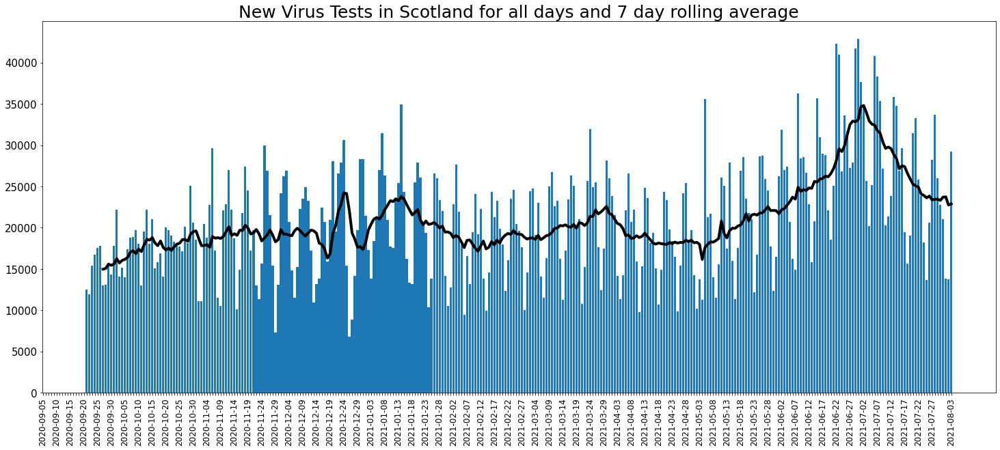

In [204]:
return1, return2, return3 = one_chart(df_summary_scot, 'newVirusTests', 'New Virus Tests in Scotland',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

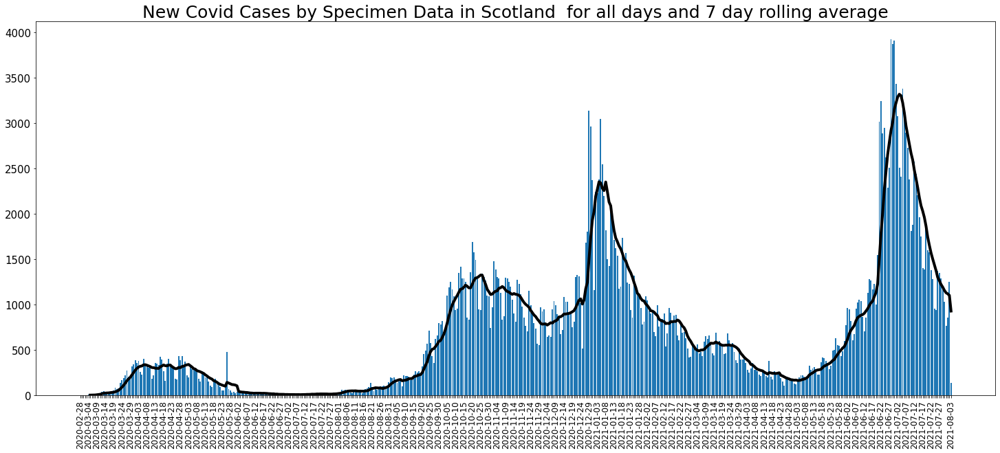

In [205]:
return1, return2, return3 = one_chart(df_summary_scot, 'newCasesBySpecimenDate', 
                                      'New Covid Cases by Specimen Data in Scotland ',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

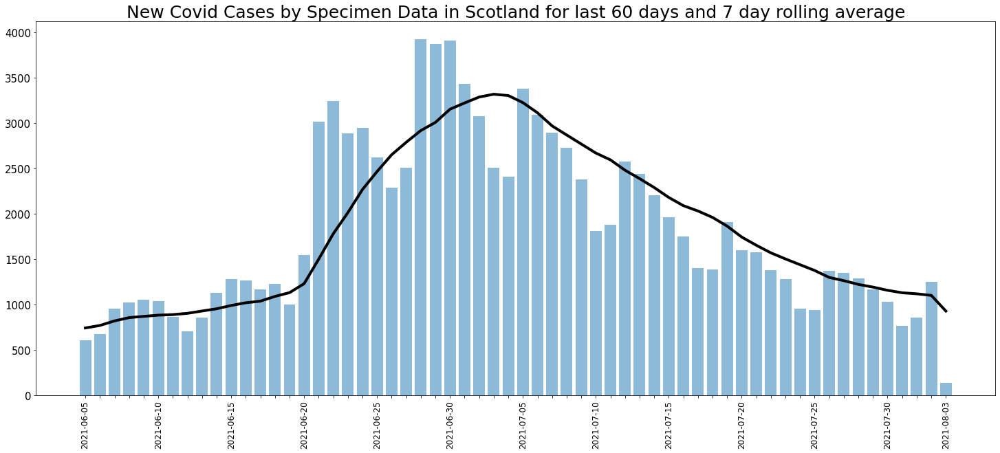

In [206]:
return1, return2, return3 = one_chart(df_summary_scot, 'newCasesBySpecimenDate', 
                                      'New Covid Cases by Specimen Data in Scotland',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

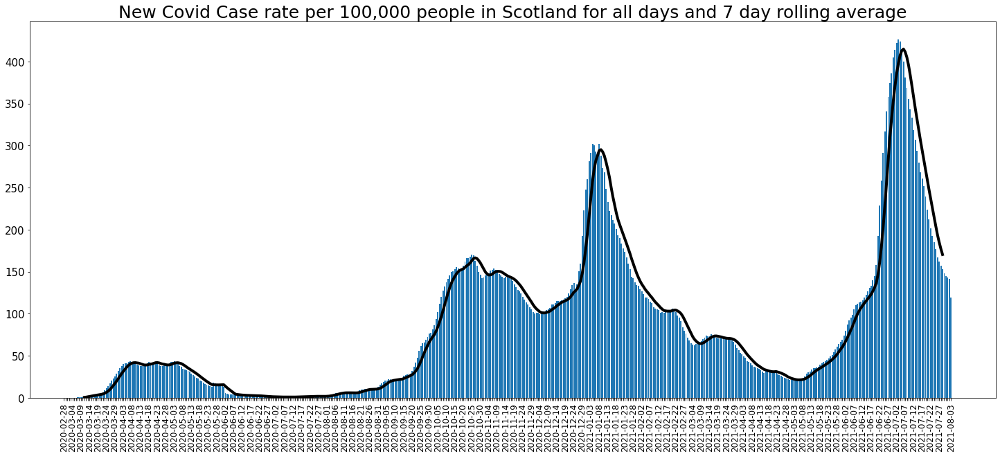

In [207]:
return1, return2, return3 = one_chart(df_summary_scot, 'newCasesBySpecimenDate_caseRate', 
                                      'New Covid Case rate per 100,000 people in Scotland',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

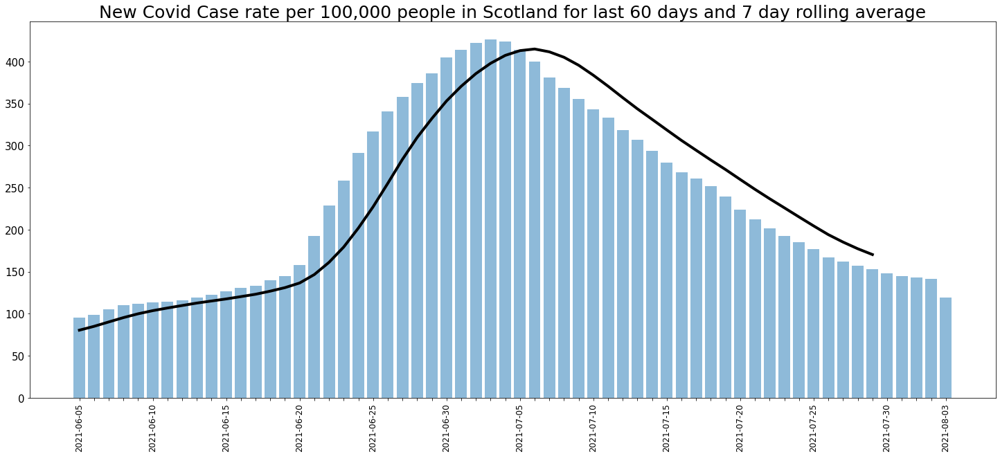

In [208]:
return1, return2, return3 = one_chart(df_summary_scot, 'newCasesBySpecimenDate_caseRate', 
                                      'New Covid Case rate per 100,000 people in Scotland',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

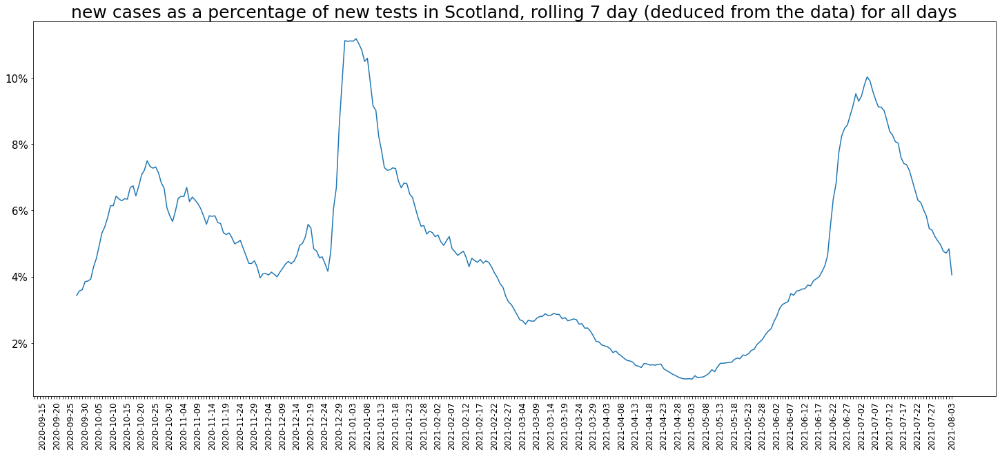

In [209]:
return1, return2, return3 = one_chart(df_summary_scot, '%_positive_tests', 
                                      'new cases as a percentage of new tests in Scotland, rolling 7 day (deduced from the data)',
                                      0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

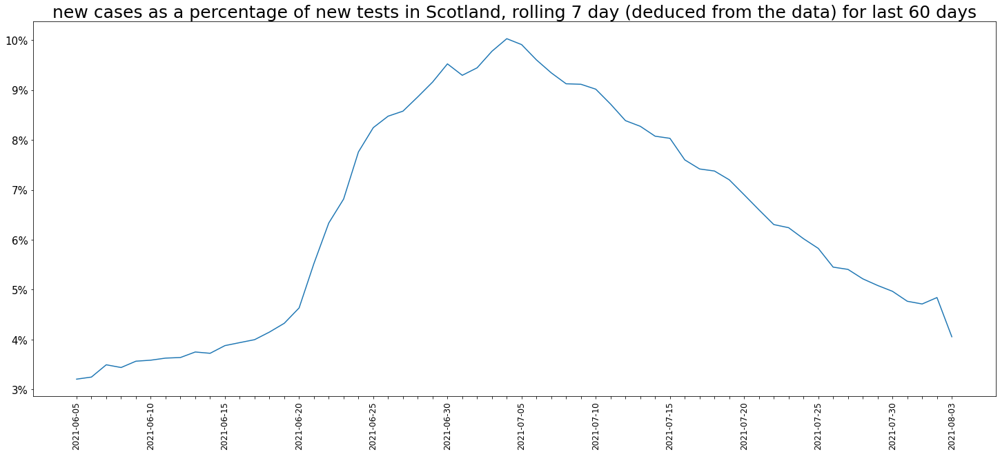

In [210]:
return1, return2, return3 = one_chart(df_summary_scot, '%_positive_tests', 
                                      'new cases as a percentage of new tests in Scotland, rolling 7 day (deduced from the data)',
                                      0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

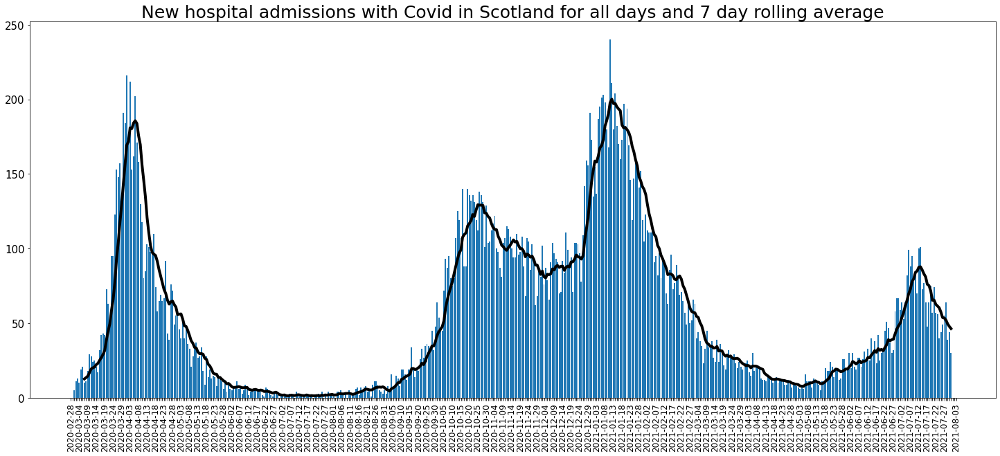

In [211]:
return1, return2, return3 = one_chart(df_summary_scot, 'newAdmissions', 'New hospital admissions with Covid in Scotland',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

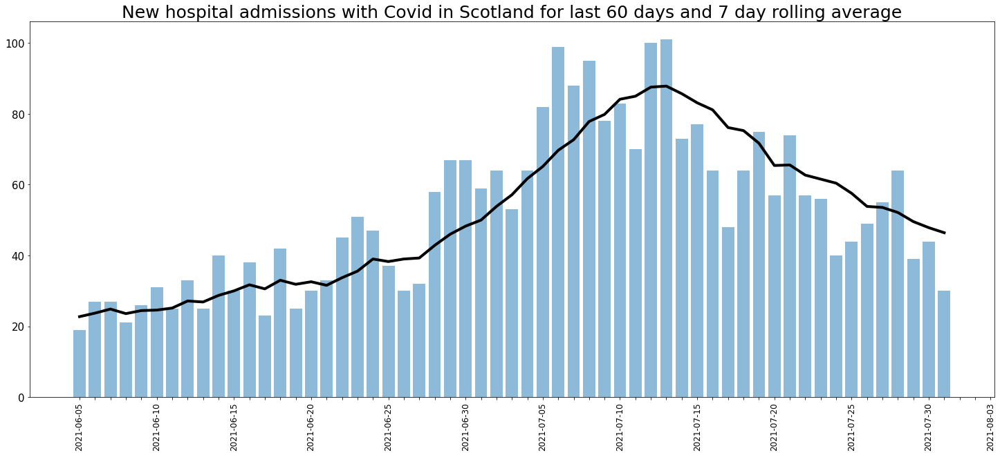

In [212]:
return1, return2, return3 = one_chart(df_summary_scot, 'newAdmissions', 'New hospital admissions with Covid in Scotland'
                                      ,1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

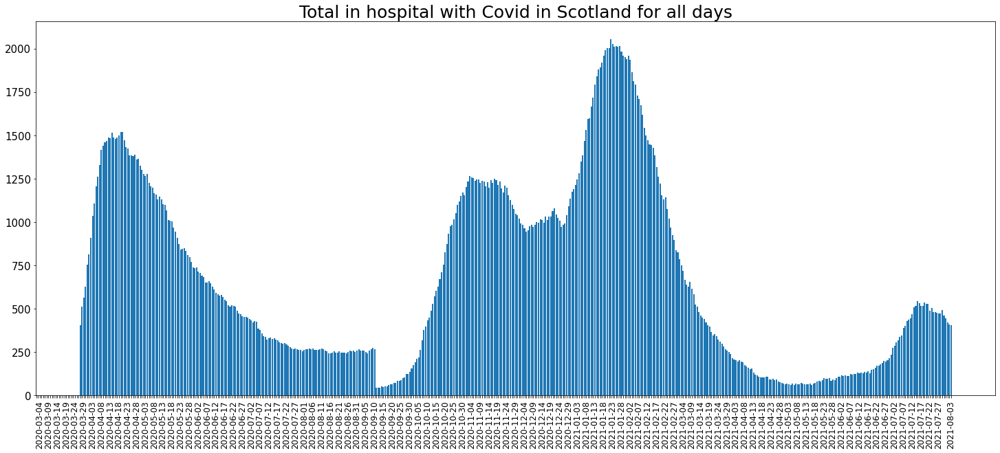

In [213]:
return1, return2, return3 = one_chart(df_summary_scot, 'hospitalCases', 'Total in hospital with Covid in Scotland'
                                      ,1,0,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

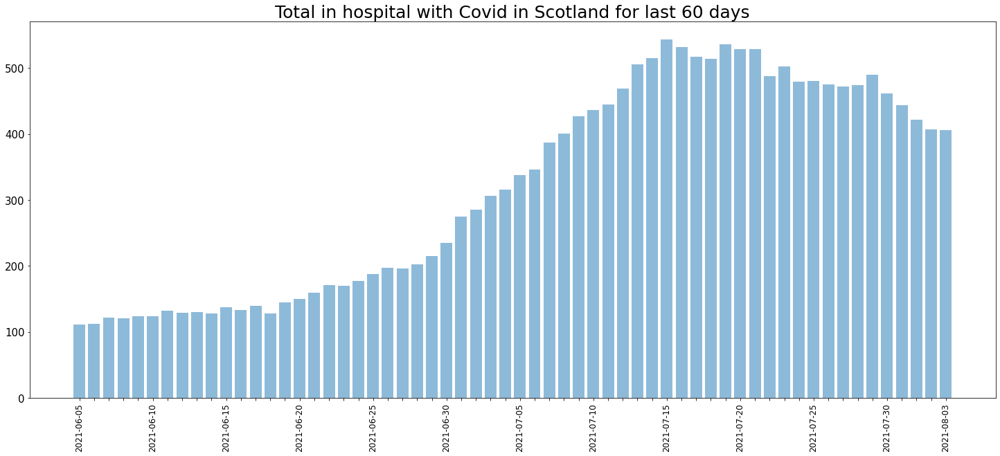

In [214]:
return1, return2, return3 = one_chart(df_summary_scot, 'hospitalCases', 'Total in hospital with Covid in Scotland'
                                      ,1,0,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

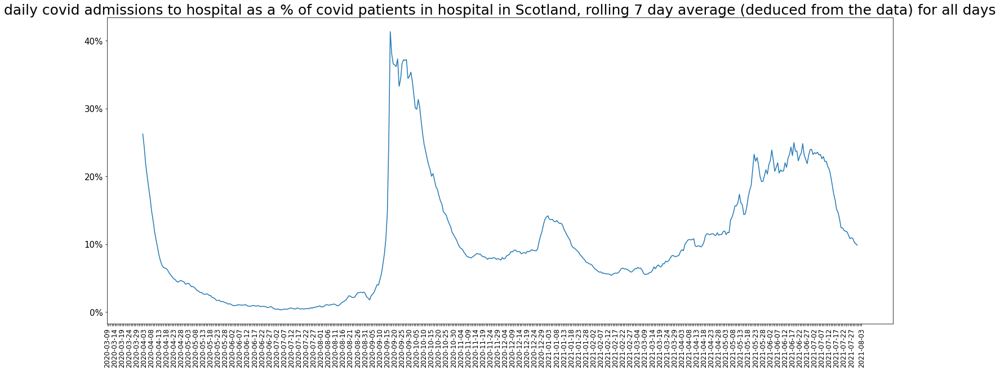

In [215]:
return1, return2, return3 = one_chart(df_summary_scot, 'newAdmissions%_inHospital', 
                                      'daily covid admissions to hospital as a % of covid patients in hospital in Scotland, rolling 7 day average (deduced from the data)',
                                      0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

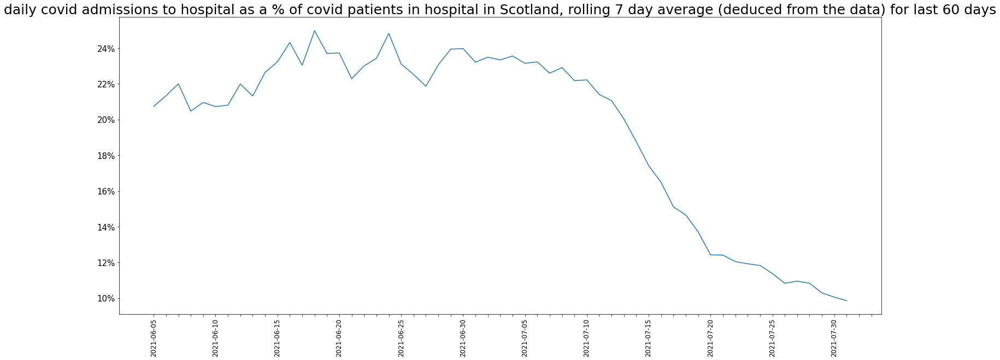

In [216]:
return1, return2, return3 = one_chart(df_summary_scot, 'newAdmissions%_inHospital', 
                                      'daily covid admissions to hospital as a % of covid patients in hospital in Scotland, rolling 7 day average (deduced from the data)',
                                      0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

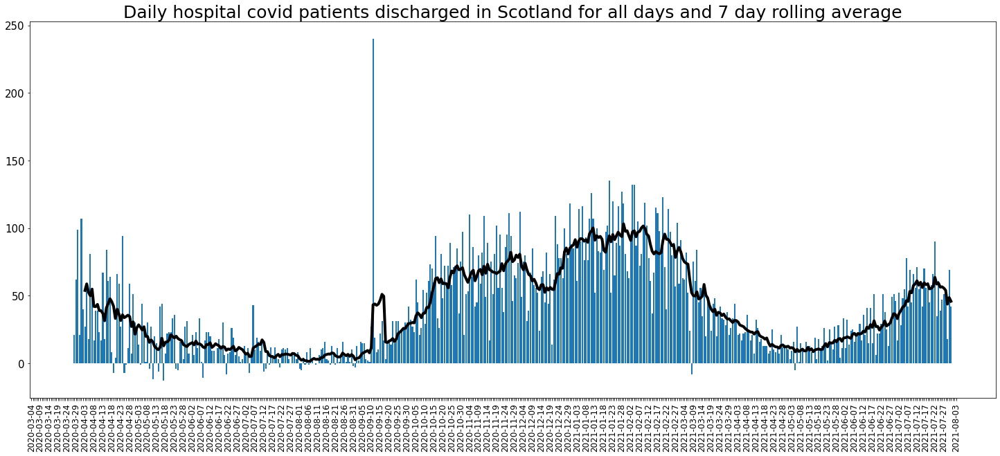

In [217]:
return1, return2, return3 = one_chart(df_summary_scot, 'leaving_hospital', 
                                      'Daily hospital covid patients discharged in Scotland',1,0,1,0)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

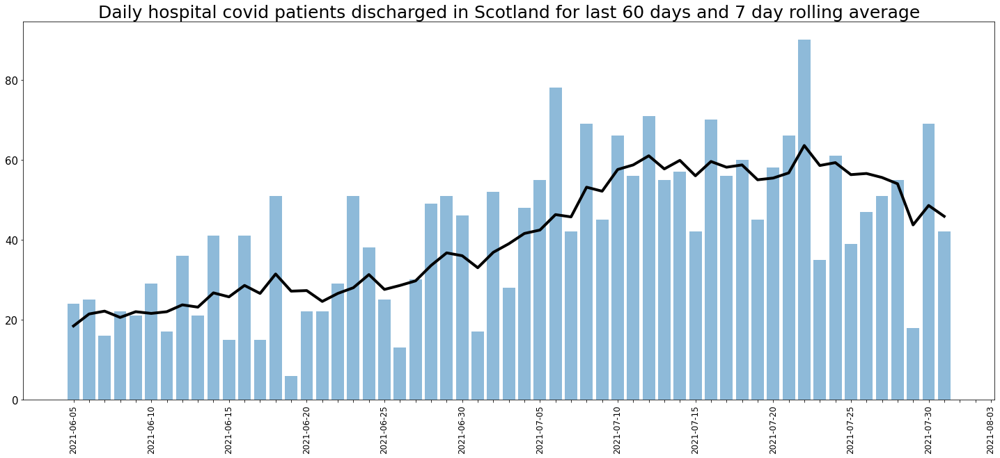

In [218]:
return1, return2, return3 = one_chart(df_summary_scot, 'leaving_hospital', 
                                      'Daily hospital covid patients discharged in Scotland',1,0,1,60)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

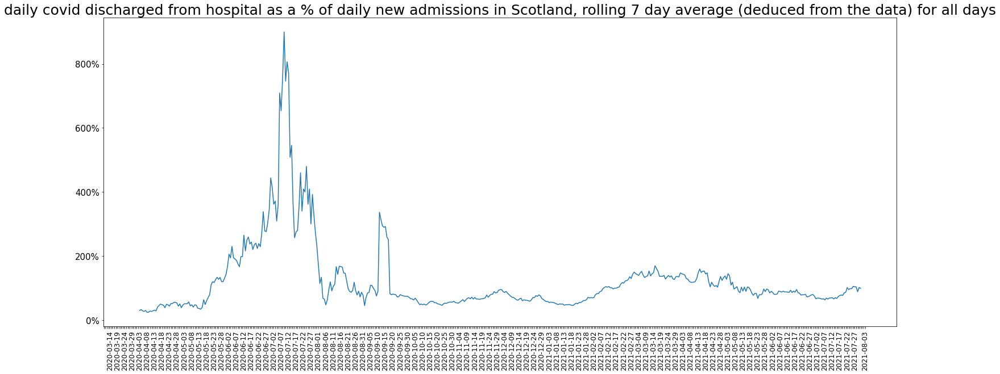

In [219]:
return1, return2, return3 = one_chart(df_summary_scot, 'leavers_%_admissions', 
                                      'daily covid discharged from hospital as a % of daily new admissions in Scotland, rolling 7 day average (deduced from the data)',
                                      0,1,0,0)
slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

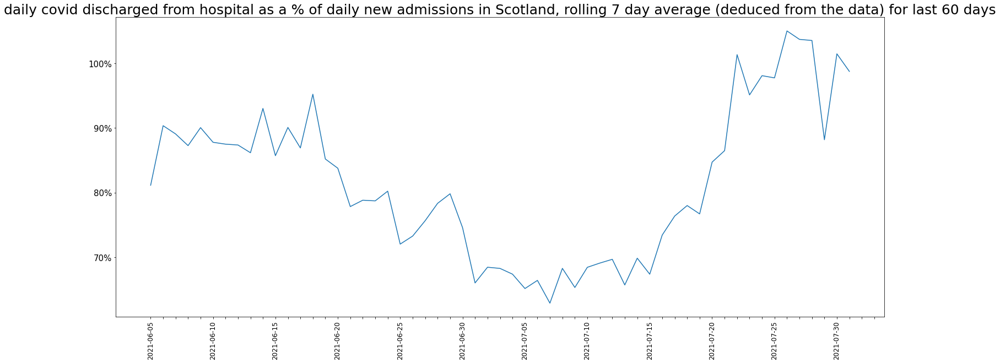

In [220]:
return1, return2, return3 = one_chart(df_summary_scot, 'leavers_%_admissions', 
                                      'daily covid discharged from hospital as a % of daily new admissions in Scotland, rolling 7 day average (deduced from the data)',
                                      0,1,0,60)
slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

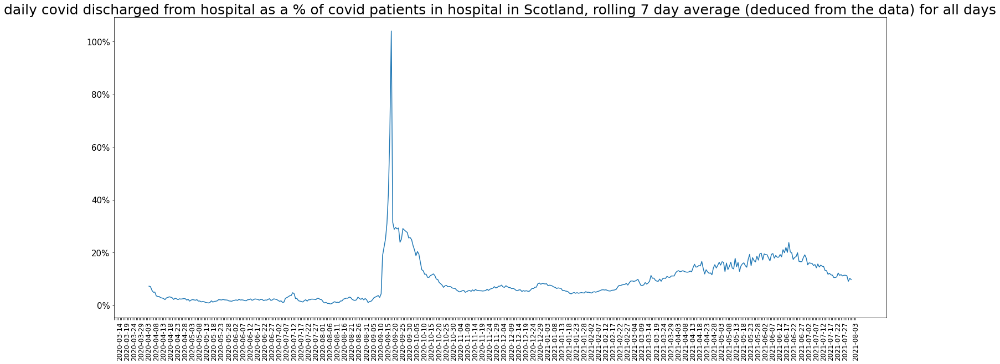

In [221]:
return1, return2, return3 = one_chart(df_summary_scot, 'leavers_%_inHospital', 
                                      'daily covid discharged from hospital as a % of covid patients in hospital in Scotland, rolling 7 day average (deduced from the data)',
                                      0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

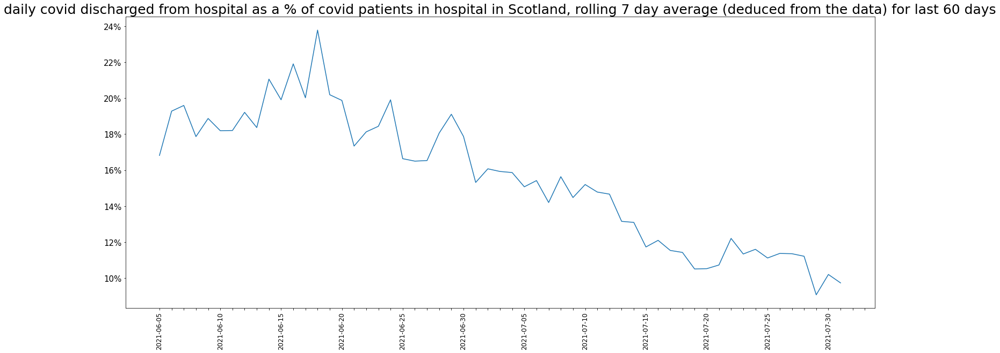

In [222]:
return1, return2, return3 = one_chart(df_summary_scot, 'leavers_%_inHospital', 
                                      'daily covid discharged from hospital as a % of covid patients in hospital in Scotland, rolling 7 day average (deduced from the data)',
                                      0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

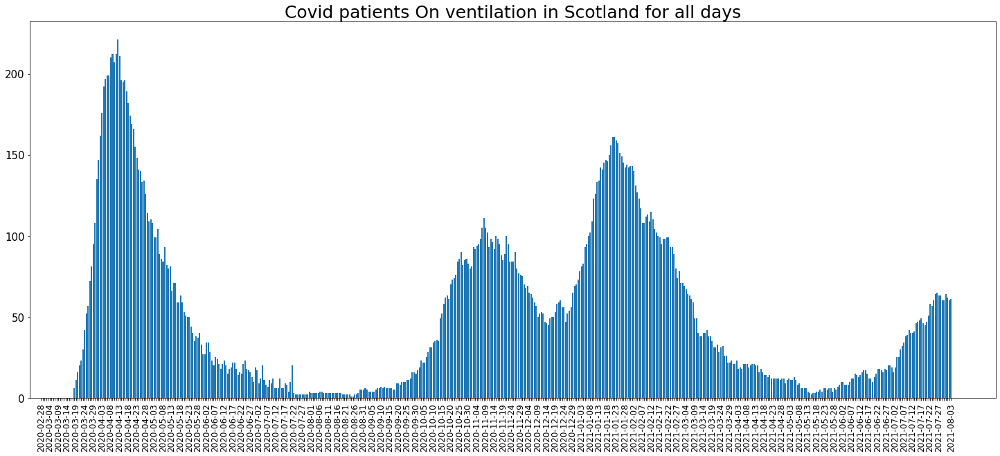

In [223]:
return1, return2, return3 = one_chart(df_summary_scot, 'covidOccupiedMVBeds', 'Covid patients On ventilation in Scotland',1,0,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

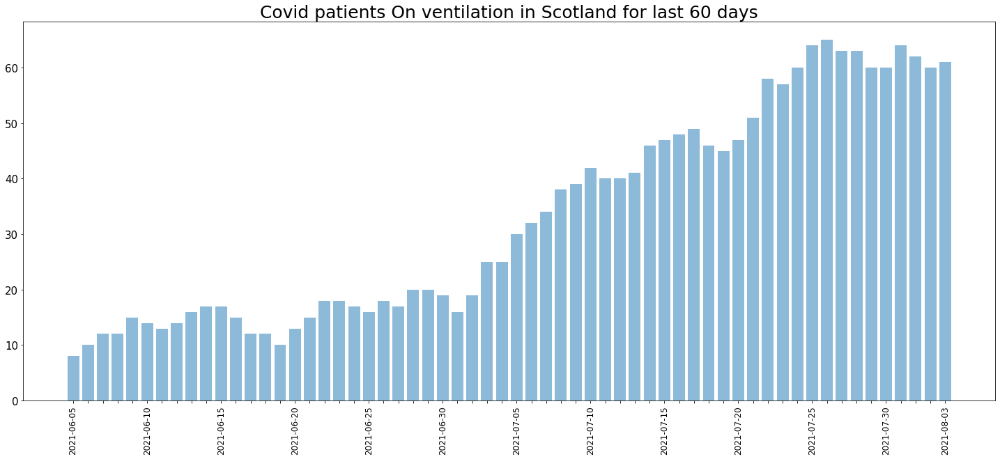

In [224]:
return1, return2, return3 = one_chart(df_summary_scot, 'covidOccupiedMVBeds', 'Covid patients On ventilation in Scotland',1,0,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

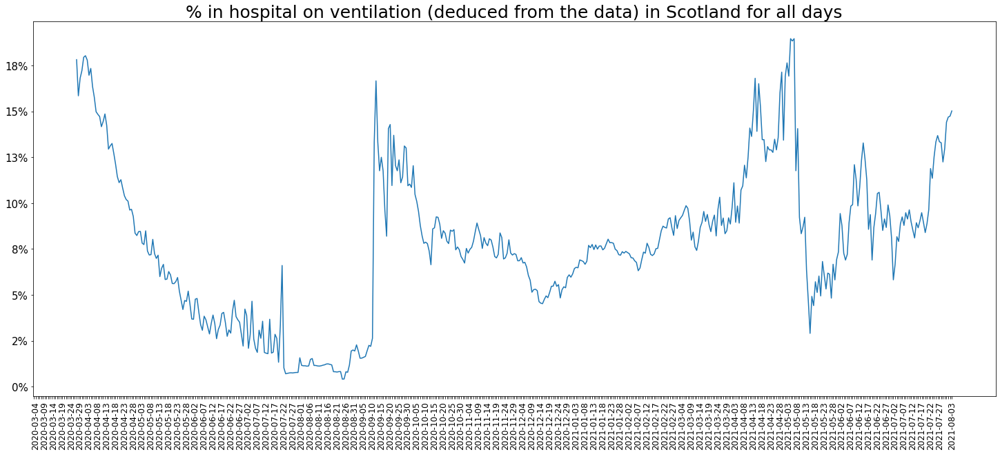

In [225]:
return1, return2, return3 = one_chart(df_summary_scot, '%_on_ventilation', 
                                      '% in hospital on ventilation (deduced from the data) in Scotland',0,1,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

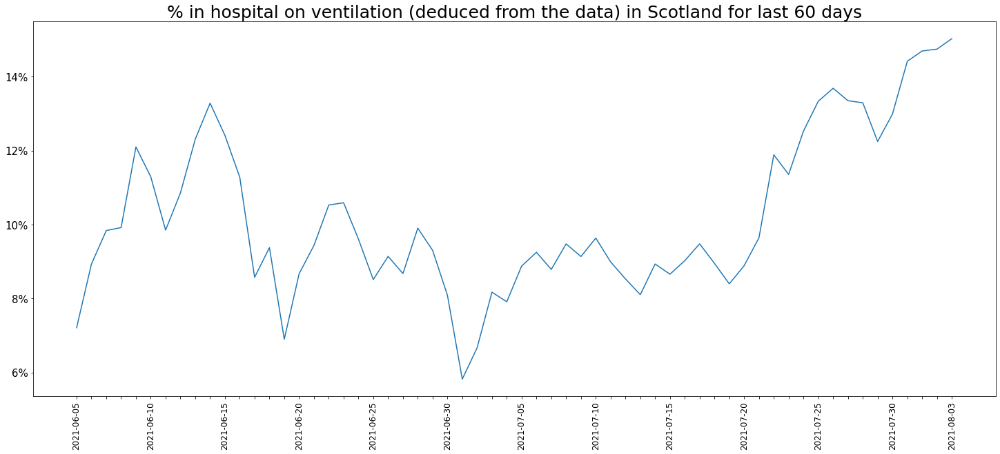

In [226]:
return1, return2, return3 = one_chart(df_summary_scot, '%_on_ventilation',
                                      '% in hospital on ventilation (deduced from the data) in Scotland',0,1,0,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

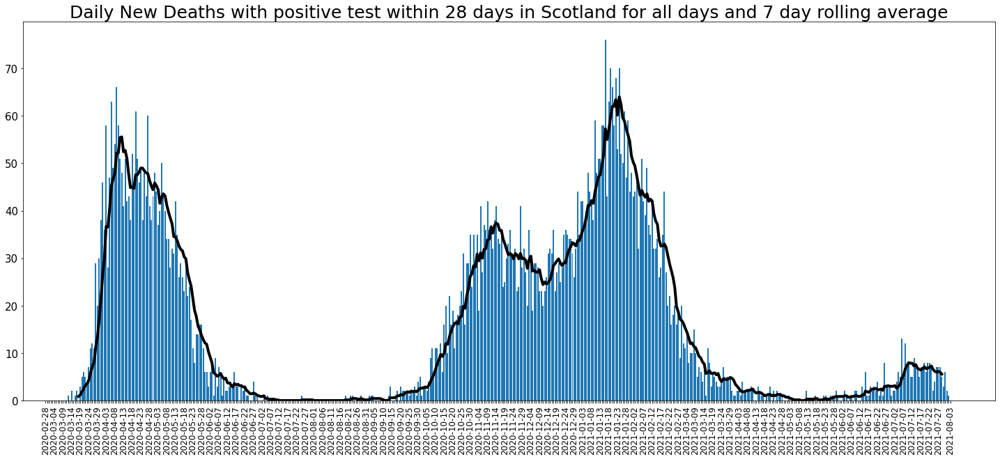

In [227]:
return1, return2, return3 = one_chart(df_summary_scot, 'newDeaths28DaysByDeathDate', 
                                      'Daily New Deaths with positive test within 28 days in Scotland',1,0,1,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

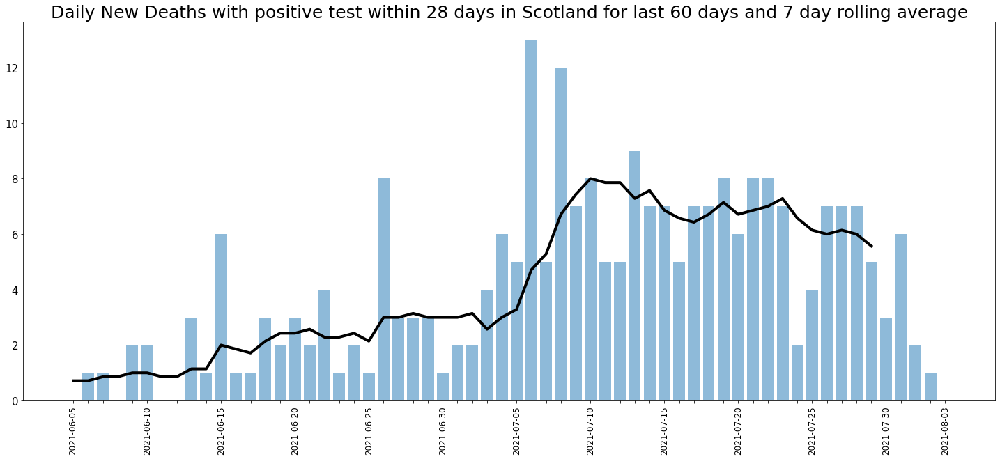

In [228]:
return1, return2, return3 = one_chart(df_summary_scot, 'newDeaths28DaysByDeathDate', 
                                      'Daily New Deaths with positive test within 28 days in Scotland',1,0,1,60)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

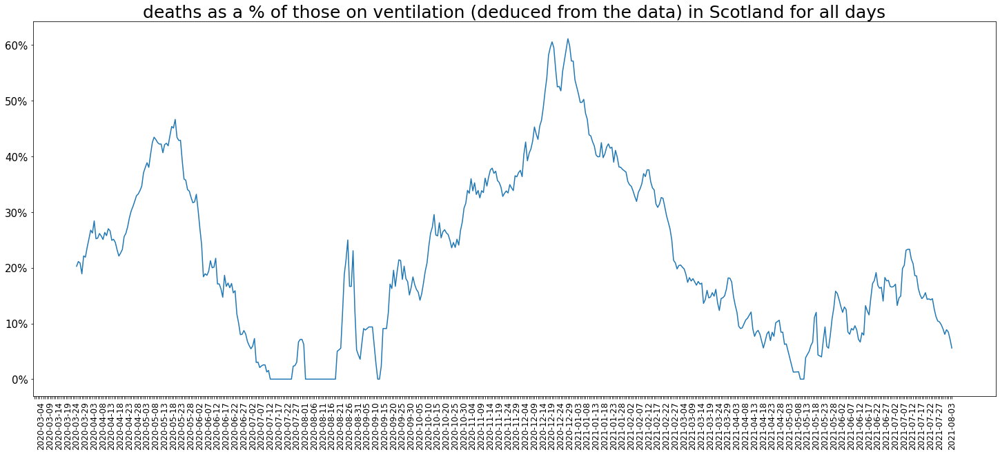

In [229]:
return1, return2, return3 = one_chart(df_summary_scot, 'deaths_%_vent', 
                                      'deaths as a % of those on ventilation (deduced from the data) in Scotland',
                                      0,1,0,0)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

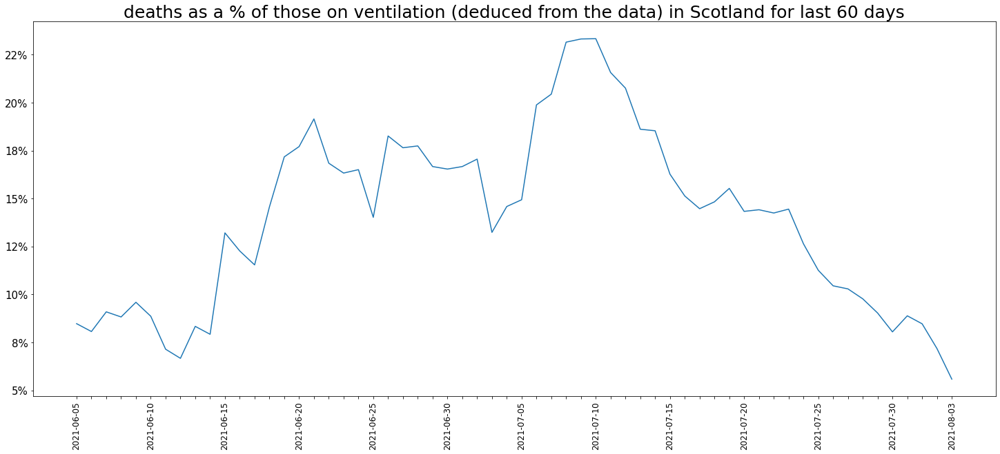

In [230]:
return1, return2, return3 = one_chart(df_summary_scot, 
                                      'deaths_%_vent', 'deaths as a % of those on ventilation (deduced from the data) in Scotland',
                                      0,1,0,60)

# slideTitle.append(return1)
# slideText.append(return2)
# imagePath.append(return3)

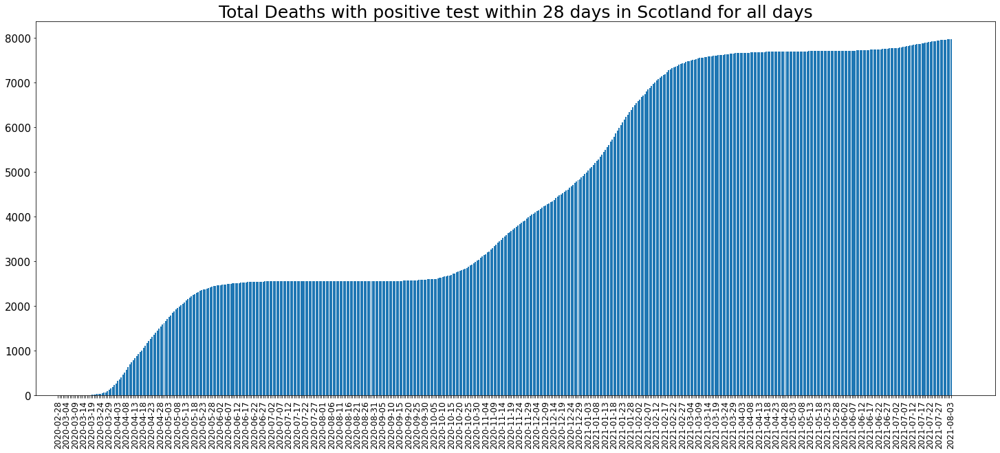

In [231]:
return1, return2, return3 = one_chart(df_summary_scot, 'cumDeaths28DaysByDeathDate', 
                                      'Total Deaths with positive test within 28 days in Scotland',1,0,0,0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [232]:
# for the presentation, insert a new chapter slide

if savePNG == 1 or PwrptPrep == 1:
    
    slideTitle.append('Section 7: Data looking at the Vaccine Rollout')
    slideText.append('')
    imagePath.append('')

plt.show()

In [233]:
df_vac.tail()

,areaCode,areaName,areaType,date,cumPeopleVaccinatedFirstDoseByPublishDate,cumPeopleVaccinatedSecondDoseByPublishDate,newPeopleVaccinatedFirstDoseByPublishDate,newPeopleVaccinatedSecondDoseByPublishDate
201,K02000001,United Kingdom,overview,2021-07-30,46812287,38133682,36762.0,171275.0
202,K02000001,United Kingdom,overview,2021-07-31,46851145,38345841,38858.0,212159.0
203,K02000001,United Kingdom,overview,2021-08-01,46872411,38464025,21266.0,118184.0
204,K02000001,United Kingdom,overview,2021-08-02,46898525,38590332,26114.0,126307.0
205,K02000001,United Kingdom,overview,2021-08-03,46928033,38733334,29508.0,143002.0


In [234]:
last_date = df_vac['date'].iloc[-1]

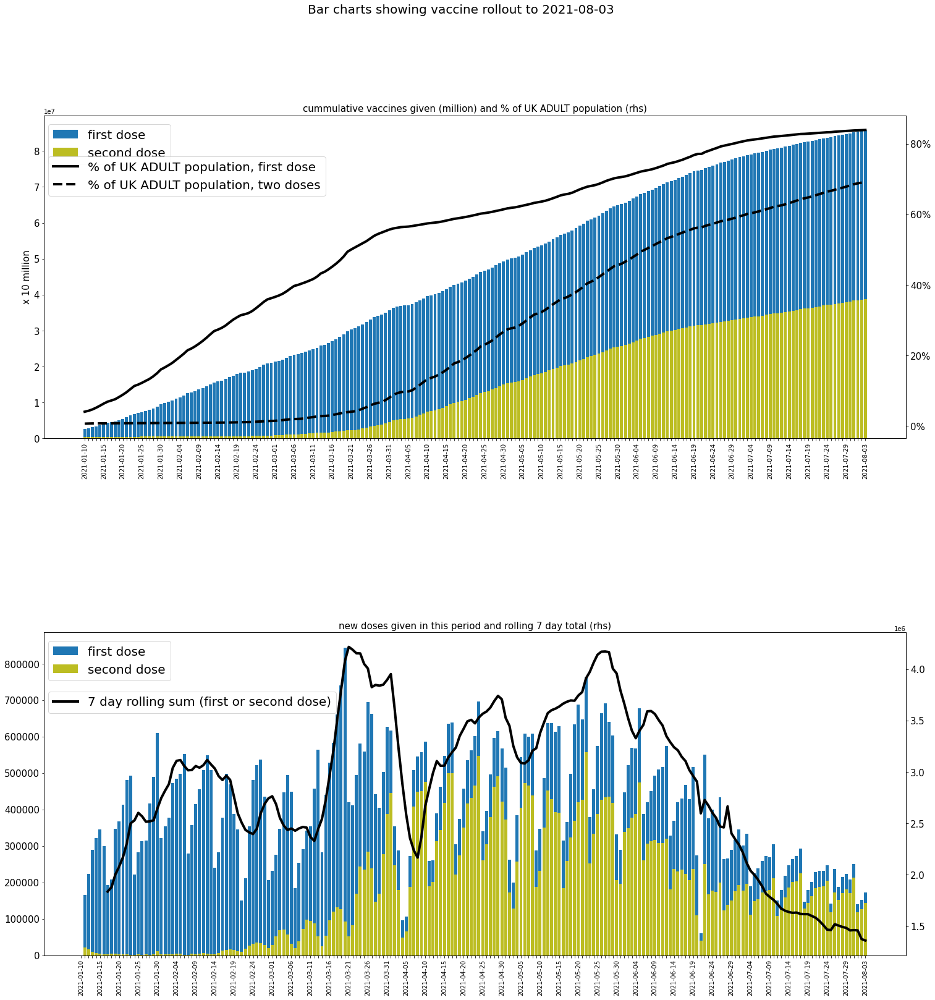

In [235]:
# bar charts showing vaccine rollout

col_names = ['cumPeopleVaccinatedFirstDoseByPublishDate', 'cumPeopleVaccinatedSecondDoseByPublishDate',
             'newPeopleVaccinatedFirstDoseByPublishDate', 'newPeopleVaccinatedSecondDoseByPublishDate']

titles = ['cummulative vaccines given (million) and % of UK ADULT population (rhs)', 
          'new doses given in this period and rolling 7 day total (rhs)']

fig, ax = plt.subplots(nrows=int(len(col_names)/2), ncols=1, figsize=(25,25))

plt.subplots_adjust(hspace=0.6, wspace=0.6)
plt.suptitle('Bar charts showing vaccine rollout to ' + last_date, fontsize = 20)

x = df_vac.index.values

labels = list(df_vac['date'])

# prevent x-axis labels from overlapping by printing every nth label
for i in range(5,len(labels),5): # label prints at every nth label
    for ii in range(1,5): # the rest is blanks
        labels[i-ii] =''

# for the final label, ensure there is space to avoid a clash
labels[len(labels)-1]=list(df_vac['date'])[-1]
labels[len(labels)-2], labels[len(labels)-3], labels[len(labels)-4]='','',''


for ii in range(0,len(col_names),2):
    #for i in range(len(df)):
    y1 = df_vac[col_names[ii]]
    y2 = df_vac[col_names[ii+1]]
    y3 = y1 + y2
    ax[int(ii/2)].set_title(titles[int(ii/2)], fontsize=15)
    ax[int(ii/2)].set_xticks(x)
    ax[int(ii/2)].set_xticklabels(labels, rotation = 90)
    ax[int(ii/2)].yaxis.set_tick_params(labelsize=15)
    ax[int(ii/2)].yaxis.set_major_locator(MaxNLocator(integer=True))
    ax[int(ii/2)].bar(x,y1+y2, color='#1f77b4', label = 'first dose')
    ax[int(ii/2)].bar(x,y2, color='#bcbd22', label = 'second dose')
    ax[int(ii/2)].legend(fontsize=20, loc=(0.005,0.85))
    
    if ii == 0:
        ax[int(ii/2)].set_ylabel('x 10 million', fontsize=15)
        ax2 = ax[int(ii/2)].twinx()
        ax2.plot(x,y1/55940000, color='black', lw=4, label = '% of UK ADULT population, first dose')
        ax2.plot(x,y2/55940000, color='black', lw=4, label = '% of UK ADULT population, two doses', linestyle='dashed')
        ax2.legend(fontsize=20, loc=(.005,.75))
        ax2.yaxis.set_major_formatter(ticker.PercentFormatter(1.0, decimals=0))
        ax2.yaxis.set_tick_params(labelsize=15)

    if ii == 2:
        ax2 = ax[int(ii/2)].twinx()
        ax2.plot(x,y3.rolling(7).sum(), color='black', lw=4, label = '7 day rolling sum (first or second dose)')
        ax2.legend(fontsize=20, loc=(.005,.75))
        ax2.yaxis.set_tick_params(labelsize=15)
    

start_date = df_vac['date'].iloc[0]
end_date = df_vac['date'].iloc[-1]

if savePNG == 1 or PwrptPrep == 1:
    fileName = 'Coviduk - bar charts vaccine rollout.png'
    
    slideTitle.append('Bar charts showing vaccine rollout to ' + last_date)
    slideText.append(str(start_date) + ' to ' + str(end_date))
    imagePath.append(fileName)

    # need to remove any dates filename when saved as .png given they change
    plt.savefig(fileName, bbox_inches = 'tight')

    
plt.show()

In [236]:
df_vac_age.head(10)

,areaCode,areaName,areaType,date,age,VaccineRegisterPopulationByVaccinationDate,cumPeopleVaccinatedCompleteByVaccinationDate,newPeopleVaccinatedCompleteByVaccinationDate,cumPeopleVaccinatedFirstDoseByVaccinationDate,newPeopleVaccinatedFirstDoseByVaccinationDate,cumPeopleVaccinatedSecondDoseByVaccinationDate,newPeopleVaccinatedSecondDoseByVaccinationDate,cumVaccinationFirstDoseUptakeByVaccinationDatePercentage,cumVaccinationCompleteCoverageByVaccinationDatePercentage,cumVaccinationSecondDoseUptakeByVaccinationDatePercentage
0,E92000001,England,nation,2020-12-08,90+,481276.0,0.0,0.0,220.0,220.0,0.0,0.0,0.0,0.0,0.0
1,E92000001,England,nation,2020-12-08,18_24,5253391.0,0.0,0.0,137.0,137.0,0.0,0.0,0.0,0.0,0.0
2,E92000001,England,nation,2020-12-08,25_29,4457577.0,0.0,0.0,259.0,259.0,0.0,0.0,0.0,0.0,0.0
3,E92000001,England,nation,2020-12-08,30_34,4759187.0,0.0,0.0,306.0,306.0,0.0,0.0,0.0,0.0,0.0
4,E92000001,England,nation,2020-12-08,35_39,4515862.0,0.0,0.0,326.0,326.0,0.0,0.0,0.0,0.0,0.0
5,E92000001,England,nation,2020-12-08,40_44,4128588.0,0.0,0.0,430.0,430.0,0.0,0.0,0.0,0.0,0.0
6,E92000001,England,nation,2020-12-08,45_49,4002448.0,0.0,0.0,497.0,497.0,0.0,0.0,0.0,0.0,0.0
7,E92000001,England,nation,2020-12-08,85_89,863986.0,0.0,0.0,462.0,462.0,0.0,0.0,0.1,0.0,0.0
8,E92000001,England,nation,2020-12-08,55_59,4077814.0,0.0,0.0,654.0,654.0,0.0,0.0,0.0,0.0,0.0
9,E92000001,England,nation,2020-12-08,60_64,3450462.0,0.0,0.0,414.0,414.0,0.0,0.0,0.0,0.0,0.0


In [237]:
df_vac_ageFirst= dataframe_ageHeaders(df_vac_age,'cumVaccinationFirstDoseUptakeByVaccinationDatePercentage')
df_vac_ageComplete= dataframe_ageHeaders(df_vac_age,'cumVaccinationCompleteCoverageByVaccinationDatePercentage')

In [238]:
df_vac_ageFirst.tail()

,date,90+,18_24,25_29,30_34,35_39,40_44,45_49,85_89,55_59,60_64,65_69,70_74,75_79,80_84,50_54
234,2021-07-30,94.0,61.1,60.4,63.8,69.1,75.3,81.2,95.6,88.5,90.4,92.4,94.5,95.5,95.6,86.0
235,2021-07-31,94.0,61.3,60.6,63.9,69.1,75.4,81.3,95.6,88.5,90.4,92.4,94.5,95.5,95.6,86.0
236,2021-08-01,94.0,61.4,60.6,64.0,69.2,75.4,81.3,95.6,88.6,90.4,92.4,94.5,95.5,95.6,86.1
237,2021-08-02,94.0,61.5,60.7,64.1,69.2,75.4,81.3,95.6,88.6,90.4,92.4,94.5,95.5,95.6,86.1
238,2021-08-03,94.0,61.7,60.8,64.1,69.2,75.4,81.3,95.6,88.6,90.4,92.4,94.5,95.5,95.6,86.1


In [239]:
columns = sorted(df_vac_ageFirst.columns[1:].tolist())
chart_titles = sorted(df_vac_ageFirst.columns[1:].tolist())
last_date = df_vac_ageFirst['date'].iloc[-1]

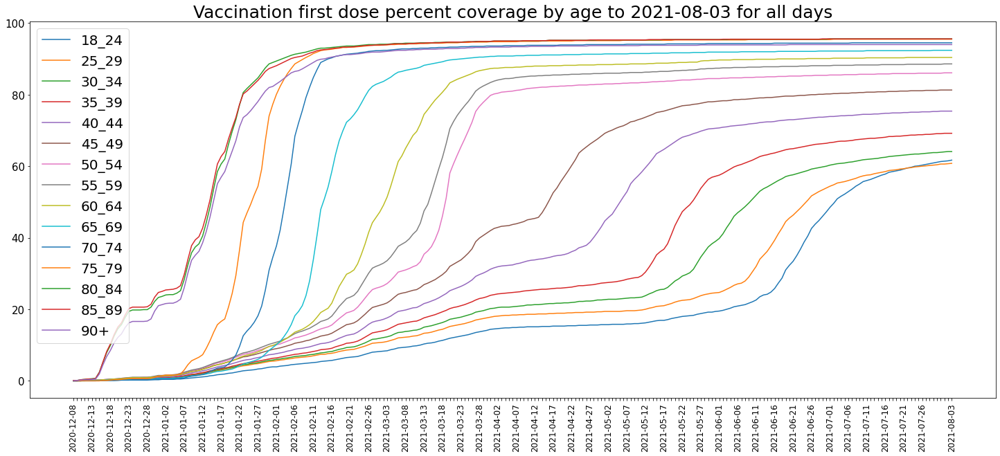

In [240]:
return1, return2, return3 = multiple_line_charts(df_vac_ageFirst, columns, chart_titles, 
                                                 'Vaccination first dose percent coverage by age to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [241]:
df_vac_ageComplete.tail()

,date,90+,18_24,25_29,30_34,35_39,40_44,45_49,85_89,55_59,60_64,65_69,70_74,75_79,80_84,50_54
234,2021-07-30,91.7,19.6,25.0,36.6,49.6,64.9,74.3,93.6,85.2,87.6,90.6,93.3,94.3,93.9,82.2
235,2021-07-31,91.7,20.0,25.6,37.8,50.4,65.5,74.5,93.6,85.2,87.7,90.7,93.3,94.3,93.9,82.3
236,2021-08-01,91.7,20.2,25.8,38.5,50.9,65.7,74.7,93.6,85.2,87.7,90.7,93.3,94.3,93.9,82.3
237,2021-08-02,91.8,20.3,26.1,39.1,51.2,66.0,74.8,93.6,85.2,87.7,90.7,93.3,94.3,93.9,82.3
238,2021-08-03,91.8,20.6,26.5,39.8,51.7,66.3,75.0,93.6,85.3,87.7,90.7,93.3,94.4,93.9,82.4


In [242]:
columns = sorted(df_vac_ageComplete.columns[1:].tolist())
chart_titles = sorted(df_vac_ageComplete.columns[1:].tolist())
last_date = df_vac_ageComplete['date'].iloc[-1]

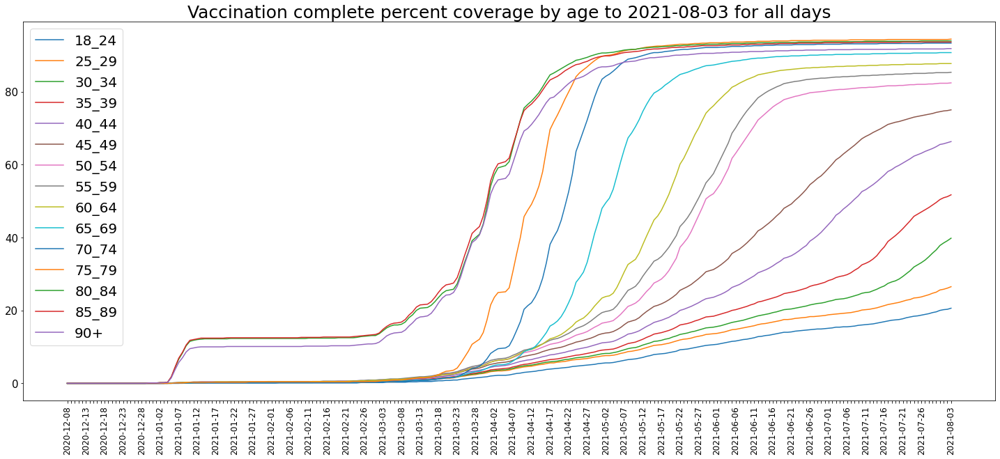

In [243]:
return1, return2, return3 = multiple_line_charts(df_vac_ageComplete, columns, chart_titles, 
                                                 'Vaccination complete percent coverage by age to ' + str(last_date),
                                                0)

slideTitle.append(return1)
slideText.append(return2)
imagePath.append(return3)

In [244]:
#
# Preparing the presentation
#

In [245]:
if PwrptPrep == 1:
    prs = Presentation('Presentation - template.pptx')
    prs_type = 'agi'
    #prs = Presentation('Presentation - template2.pptx')
    #prs_type = 'plain'

In [246]:
# change the title and date on the front page
# the slide shapes do not go nicely 0,1,2 they go 1,2,0
if PwrptPrep == 1:
    
    #listShapes = [1,2,0]
    
    if prs_type !='plain':
        
        listShapes = [1,2,0]
        for i in range(3):
            slide = prs.slides[0]
            shape = slide.shapes[listShapes[i]]
            text_frame = shape.text_frame
            text_frame.paragraphs[0].runs[0].text = presentationTitle[i]
    
    else:        
        listShapes = [0,1,2]
        for i in range(3):
            slide = prs.slides[0]
            shape = slide.shapes[listShapes[i]]
            text_frame = shape.text_frame
            text_frame.paragraphs[0].text = presentationTitle[i]

In [247]:
# add the Preamble and Summary slides
if PwrptPrep == 1:

    title_Preamble_Summary = ['Preamble']
    
    for i in range(1):
        if prs_type !='plain':
            blank_slide_layout = prs.slide_layouts[15]
            left_inches = 0.25
            p_level = 1
        else:
            blank_slide_layout = prs.slide_layouts[5]
            left_inches = 0.955
            p_level = 0
        
        slide = prs.slides.add_slide(blank_slide_layout)

        title = slide.shapes.title
        title.text = title_Preamble_Summary[i]

        top = height = Inches(1.5)
        width = Inches(10.25)
        left = Inches(left_inches)
        txBox = slide.shapes.add_textbox(left, top, width, height)
        tf = txBox.text_frame
        tf.word_wrap = True
        p = tf.add_paragraph()
        p.level = p_level
        if i == 0:
            p.text = 'Daily and some weekly charts showing UK Covid Testing, new cases, hospitalisations including occupied ventilation beds and deaths.  Data Further visualised by age and by region.  End of chart pack has excess deaths and vaccine rollout'
            p = tf.add_paragraph()
            p.level = p_level 
            p.text = 'The charts for England only given i could only find hospital admission by age for England'
            p = tf.add_paragraph()
            p.level = p_level
            p.text = 'All the data for these charts comes from UK government websites'
            p = tf.add_paragraph()
            p.level = p_level
            p.text = 'Some charts are derived from other charts'
            p = tf.add_paragraph()
            p.level = p_level
            p.text = 'For the daily charts, the latest data points are subject to revision as new data is submitted'         


In [248]:
# add the Preamble and Summary slides
if PwrptPrep == 1:

    title_Preamble_Summary = ['Sources - 1/2']
    
    for i in range(1):
        if prs_type !='plain':
            blank_slide_layout = prs.slide_layouts[15]
            left_inches = 0.25
            p_level = 1
        else:
            blank_slide_layout = prs.slide_layouts[5]
            left_inches = 0.955
            p_level = 0
        
        slide = prs.slides.add_slide(blank_slide_layout)

        title = slide.shapes.title
        title.text = title_Preamble_Summary[i]

        top = height = Inches(1.5)
        width = Inches(10.25)
        left = Inches(left_inches)
        txBox = slide.shapes.add_textbox(left, top, width, height)
        tf = txBox.text_frame
        tf.word_wrap = True
        p = tf.add_paragraph()
        p.level = p_level
        if i == 0:
            for i in range(21):
                p = tf.add_paragraph()
                p.level = p_level + 1
                p.font.size = Pt(6)
                p.text = url_list[i]

In [249]:
# add the Preamble and Summary slides
if PwrptPrep == 1:

    title_Preamble_Summary = ['Sources - 2/2']
    
    for i in range(1):
        if prs_type !='plain':
            blank_slide_layout = prs.slide_layouts[15]
            left_inches = 0.25
            p_level = 1
        else:
            blank_slide_layout = prs.slide_layouts[5]
            left_inches = 0.955
            p_level = 0
        
        slide = prs.slides.add_slide(blank_slide_layout)

        title = slide.shapes.title
        title.text = title_Preamble_Summary[i]

        top = height = Inches(1.5)
        width = Inches(10.25)
        left = Inches(left_inches)
        txBox = slide.shapes.add_textbox(left, top, width, height)
        tf = txBox.text_frame
        tf.word_wrap = True
        p = tf.add_paragraph()
        p.level = p_level
        if i == 0:
            for i in range(21,len(url_list)):
                p = tf.add_paragraph()
                p.level = p_level + 1
                p.font.size = Pt(6)
                p.text = url_list[i]

In [250]:
# add the Preamble and Summary slides
if PwrptPrep == 1:

    title_Preamble_Summary = ['Summary']
    
    for i in range(1):
        if prs_type !='plain':
            blank_slide_layout = prs.slide_layouts[15]
            left_inches = 0.25
            p_level = 1
        else:
            blank_slide_layout = prs.slide_layouts[5]
            left_inches = 0.955
            p_level = 0
        
        slide = prs.slides.add_slide(blank_slide_layout)

        title = slide.shapes.title
        title.text = title_Preamble_Summary[i]

        top = height = Inches(1.5)
        width = Inches(10.25)
        left = Inches(left_inches)
        txBox = slide.shapes.add_textbox(left, top, width, height)
        tf = txBox.text_frame
        tf.word_wrap = True
        p = tf.add_paragraph()
        p.level = p_level


In [251]:
# add the Chapter contents slide and Chapter 1 slide
if prs_type !='plain':

    if PwrptPrep == 1:

        if prs_type !='plain':
            blank_slide_layout = prs.slide_layouts[15]
        else:
            blank_slide_layout = prs.slide_layouts[5]

        slide = prs.slides.add_slide(blank_slide_layout)

        shapes = slide.shapes

        shapes.title.text = 'Contents'

        rows = cols = 2
        left = Inches(0.25)
        top = Inches(1.5)
        width = Inches(1.5)
        height = Inches(1.5)

        table = shapes.add_table(rows, cols, left, top, width, height).table

        # set column widths
        table.columns[0].width = Inches(1.5)
        table.columns[1].width = Inches(2.0)

        tableText = ['01', 'Charts', '02', 'Appendix']
        TableFont = [60, 14, 60, 14]
        tableCell1 = [0,0,1,1]
        tableCell2 = [0,1,0,1]

        for i in range(4):
            table.cell(tableCell1[i], tableCell2[i]).text = tableText[i]
            cell = table.cell(tableCell1[i], tableCell2[i])
            para = cell.text_frame.paragraphs[0]
            para.font.bold = True
            para.font.size = Pt(TableFont[i])
            para.font.color.rgb = RGBColor(0, 55, 129) 
            cell.vertical_anchor = MSO_ANCHOR.MIDDLE
            fill = cell.fill
            fill.background()

        slide = prs.slides.add_slide(prs.slide_layouts[9])
        placeholder = slide.placeholders[1]
        placeholder.text = '01'
        title = slide.shapes.title
        title.text = 'Charts'


In [252]:
# add a blank slide with title, text and saved graphic as per the list of items
if PwrptPrep == 1:
    
    for i in range(len(slideTitle)):

        if prs_type !='plain':
            blank_slide_layout = prs.slide_layouts[15]
            left_inches = 0.25
        else:
            blank_slide_layout = prs.slide_layouts[5]
            left_inches = 0.955
            
        slide = prs.slides.add_slide(blank_slide_layout)

        title = slide.shapes.title
        title.text = slideTitle[i]

        top = width = height = Inches(1.5)
        left = Inches(left_inches)
        txBox = slide.shapes.add_textbox(left, top, width, height)
        tf = txBox.text_frame

        p = tf.add_paragraph()
        p.text = slideText[i]
        p.font.bold = True
        p.font.size = Pt(14)

        left = Inches(left_inches)
        top = Inches(2.5)
        height = Inches(4)
        width = Inches(9)
        if imagePath[i] !='':
            pic = slide.shapes.add_picture(imagePath[i], left, top, width = width, height = height)

In [253]:
# # add the Appendix

if PwrptPrep == 1:
    if prs_type !='plain':
        blank_slide_layout = prs.slide_layouts[15]
    
        slide = prs.slides.add_slide(prs.slide_layouts[9])
        placeholder = slide.placeholders[1]
        placeholder.text = '02'
        title = slide.shapes.title
        title.text = 'Appendix'

In [254]:
# add closing slide

if PwrptPrep == 1:
    if prs_type !='plain':
        blank_slide_layout = prs.slide_layouts[40]
        slide = prs.slides.add_slide(blank_slide_layout)

In [255]:
# save completed presentation to file using name diven in the slide name cell
if PwrptPrep == 1:

    prs.save(saveFileName)

In [256]:
#
# all the slide types
# only to be run for reference
#

In [257]:
# prs = Presentation('Persentation - template.pptx')

In [258]:
# for i in range(43):

#     blank_slide_layout = prs.slide_layouts[i]
#     slide = prs.slides.add_slide(blank_slide_layout)

In [259]:
# prs.save('presentationPrep - all the slides.pptx')